<a href="https://colab.research.google.com/github/eriksali/DNN_2023_NLP/blob/main/hw1_NLP_review_nb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from tqdm import tqdm
import csv
#d = {}

## langs = set(['0','1'])

small_dataset = {}

## for split in ['train','validation','test']:
small_dataset = {'labels':[], 'text':[]}
with open('hw1_dataset_shuffled.csv', mode='r') as f:
    data = csv.reader(f)
    ##label = {rows[0] for rows in data}
    for rows in data:
      small_dataset['labels'].append(rows[0])
      small_dataset['text'].append(rows[1])

In [ ]:
'''
head -n1 -q *.txt > 4195_.csv
'''
## !mkdir reviews_yellow_mountain

## !pip install contractions

import pandas as pd

import string
import optparse

import nltk
nltk.download('stopwords')
##nltk.download('words')
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
import re
import sys

## import contractions



'''input_file = sys.argv[1]
output_file = sys.argv[2]'''

 
def remove(list):
    pattern = '[0-9]'
    list = [re.sub(pattern, '', i) for i in list]
    return list


ps = PorterStemmer()

# Open the file in read mode
##text = open("/content/a1_input.txt", "r")
##text = open("a1_input.txt", "r")
##text = open(input_file, "r")

# Create an empty dictionary
d = dict()


## df = pd.read_csv("/content/reviews_yellow_mountain_1575.csv")
df = pd.read_csv("/content/reviews_The_Great_Wall_4508.csv")

'''for filename, g in df.groupby("Title"):
    exclude = '//'
    filename = ''.join(ch for ch in filename if ch not in exclude)  
    g.to_csv(filename + ".txt", index=False)
'''
for title in df.Title.unique():
    
    exclude = '//'
    title = ''.join(ch for ch in title if ch not in exclude) 
    fileName = "/content/reviews_great_wall/" + title +".txt"
    file = open(fileName, "w+", encoding='utf-8') #creating a txt file if not already exists
    
    #adding rows for each unique title name 
    for row in df[df.Title==title].values:

      # Create an empty list
      lis = []
      listToStr = ''
      expanded_words = []

      ## row[2] = row[2].encode('utf-8', errors='ignore').decode('utf-8')
      row[2] = row[2].lower()

      ## words = set(nltk.corpus.words.words())

      ## sent = "Io andiamo to the beach with my amico."
      ## " ".join(w for w in nltk.wordpunct_tokenize(row[2]) if w.lower() in words or not w.isalpha())

      # Remove the punctuation marks from the line
      row[2] = row[2].translate(row[2].maketrans("", "", string.punctuation))
      row[2] = row[2].replace('"', '')

      # Split the row[2] into words
      words = row[2].split(" ")

      # Iterate over each word in row[2]
      for word in words:
        ## expanded_words.append(contractions.fix(word)) 
      ## expanded_text = ''.join(expanded_words)

      ##for word in expanded_text:            
        ##if dest_check3:
        ## new_stopwords = ["don't", "it's", "can't", "i'll", "we'll"]
        stpwrd = nltk.corpus.stopwords.words('english')
        ## stpwrd.extend(new_stopwords)
        if word not in stpwrd:
          word = word
        else:
          word = ""

        ##if dest_check2:
        word = ps.stem(word)
        
        ##if dest_check4:
        word = ''.join([i for i in word if not i.isdigit()])

        if word != "":
          if word in d:
          # Increment count of word by 1
            d[word] = d[word] + 1
          else:
            # Add the word to dictionary with count 1
            d[word] = 1

          lis.append(word)
    
      # using list comprehension
      listToStr = ' '.join([str(elem) for elem in lis])
      ##print(listToStr)      
      
      file.write(listToStr) #writing to txt file

## !zip -r reviews_yellow_mountain.zip reviews_yellow_mountain/

In [55]:
import csv
import glob

column_names = ['Title','Review'] # or whatever


with open('/content/reviews_great_wall.csv', 'w', newline='') as target:
    writer = csv.DictWriter(target, fieldnames=column_names)
    writer.writeheader() # if you want a header
    for path in glob.glob('/content/reviews_great_wall/*.txt'):
        with open(path, newline='') as source:
            reader = csv.DictReader(source, delimiter='/', fieldnames=column_names)
            writer.writerows(reader)

In [39]:
import glob
with open('/content/yellow_mountain.csv', 'a') as csv_file:
    for path in glob.glob('/content/reviews_yellow_mountain/*.txt'):
        with open(path) as txt_file:
            ## txt = txt_file.read() + '\n'
            txt = txt_file.read()
            csv_file.write(txt)

In [66]:
from tqdm import tqdm
import csv
#d = {}

##langs = set(['0','1'])

small_dataset = {}

## for split in ['train','validation','test']:
## small_dataset = {'labels':[], 'text':[]}
small_dataset = {'text':[], 'labels':[]}
with open('hw1_dataset_shuffled.csv', mode='r') as f:
    data = csv.reader(f)
    ##label = {rows[0] for rows in data}
    for rows in data:
      small_dataset['labels'].append(rows[1])
      small_dataset['text'].append(rows[0])

      
# We will not waste 20 min figuring out slicing lists today :D
# take a list of words and get all character ngrams from the words and their counts
import collections
def get_char_ngrams(words, n=3, start_token="<s>", end_token="</s>"):
    counter = collections.defaultdict(int)
    for word in words:
        chars = [start_token] + list(word) + [end_token]
        for i in range(len(chars)-(n-1)):
            ngram = chars[i:i+n]
            counter[''.join(ngram)] += 1
    return counter

# show how it works
get_char_ngrams("she sells seashells by the seashore".lower().split())

# simple tokenization/normalization + char ngram function from above

import nltk
nltk.download('punkt')
import string

# document is a string containing 1 or more sentences
# returns a list of all of the tokens in the document
# either word-level unigrams (if char_ngrams is 0 or None) or character ngrams
def tokenize(document, char_ngrams=3):
    doc_tokens = []
    # use nltk sentence tokenization
    sentences = nltk.sent_tokenize(document)
    for sentence in sentences:
        # use nltk word tokenization
        sent_tokens = nltk.word_tokenize(sentence)
        # remove punctuation
        sent_tokens = [word.translate(str.maketrans('', '', string.punctuation)) for word in sent_tokens]
        # lowercase and remove empty strings (all punctuation will become empty after previous line)
        sent_tokens = [word.lower() for word in sent_tokens if word]
        # either use char ngrams or full words
        if char_ngrams:
            doc_tokens += get_char_ngrams(sent_tokens, char_ngrams)
        else:
            doc_tokens += sent_tokens
    return doc_tokens


for x in tqdm(range(1000)):
    y = 1 + 1

'''
Write a function to compute Naive Bayes
Need to compute 3 outputs from set of documents and their labels:

Log-Prior:  𝑙𝑜𝑔(|{𝑑∈𝐷|𝐶(𝑑)=𝑐}||𝐷|) 
Log-Likelihood:  𝑙𝑜𝑔(𝑐𝑜𝑢𝑛𝑡(𝑤,𝑐)+1∑𝑤′∈𝑉𝑐𝑜𝑢𝑛𝑡(𝑤′,𝑐)+1) 
Vocabulary:  𝑉
'''

import math
import collections
from tqdm import tqdm

def train_nb(training_data, tokenize_function):

    vocab = set()
    label_counts = {}
    label_word_counts = {}
    label_sum = collections.defaultdict(int)

    num_total_docs = len(training_data['labels'])
    # Update 0: added tqdm to make a progress bar
    for d in tqdm(range(num_total_docs)):
        document = training_data['text'][d]
        label = training_data['labels'][d]

        if label not in label_counts:
            label_counts[label] = 0
        if label not in label_word_counts:
            label_word_counts[label] = collections.defaultdict(int)

        tokens = tokenize_function(document)
        for token in tokens:
            label_word_counts[label][token] += 1
            vocab.add(token)
            label_sum[label] += 1

        label_counts[label] += 1

    # keys are labels, values are the log priors
    log_priors = {}
    for label, count in label_counts.items():
        log_priors[label] = math.log(count / num_total_docs)
    # keys are labels, values are dictionaries mapping words to their 
    #                   likelihoods for that label
    log_likelihoods = {}
    for label, word_count in label_word_counts.items():
        log_likelihoods[label] = {}
        # Update 1:
        # key thing here: needed to this for all words in vocab
        # otherwise, tokens that don't appear in one of the classes
        # will not get smoothed and counts remain 0 for that class
        # then during test time, won't handle those words correctly
        # when computing the class probabilities
        # OLD VERSION WAS: 
        # for word, count in word_count.items()
        for word in vocab:
            log_likelihoods[label][word] = math.log((word_count[word] + 1) / (label_sum[label] + len(vocab)))


    return log_priors, log_likelihoods, vocab

# test sentences
##train_nb({'text':['this is an okay sentence','this is a bad sentence'],'labels':['neutral','bad']}, tokenize)
train_nb(small_dataset, tokenize)


'''
Dr. Wilson's example NB train function
'''
# list of tuples, document as a string and then its label

import math
import collections
from tqdm import tqdm

def my_train_nb(training_data):
    label_counts = collections.defaultdict(int)
    total_words_with_label = collections.defaultdict(int)
    word_with_label_counts = {}
    vocab = set()
    total_docs = len(training_data['text'])
    for d in tqdm(range(total_docs)):
        document = training_data['text'][d]
        label = training_data['labels'][d]
        label_counts[label] += 1
        if label not in word_with_label_counts:
            word_with_label_counts[label] = collections.defaultdict(int)
        words = tokenize(document)
        for word in words:
            vocab.add(word)
            word_with_label_counts[label][word] += 1
            total_words_with_label[label] += 1
    priors = {label:count/total_docs for label,count in label_counts.items()}
    log_likelihoods = {}
    for label, word_counts in word_with_label_counts.items():
        log_likelihoods[label] = {}
        for word in vocab:
            count = word_counts[word]
            log_likelihoods[label][word] = math.log( (count + 1) / 
                                                    (total_words_with_label[label] + len(vocab)) )
            
    return priors, log_likelihoods, vocab

## my_train_nb({'text':['this is an okay sentence','this is a bad sentence'],'labels':['neutral','bad']})
my_train_nb(small_dataset)

prior, lh, v = train_nb(small_dataset, tokenize)

# get the k features (tokens) with the highest likelihood for a given label
def get_top_k_nb_features(label, likelihoods, k):
    return sorted(likelihoods[label].items(),key=lambda x:x[1],reverse=True)[:k]

# try changing change 'es' to 'en or 'pt'
get_top_k_nb_features('1',lh, 10)

# model 1: character trigrams (basically, what we already did above)
trigram_tokenize = lambda document: tokenize(document, char_ngrams=3)
prior, lh, v = train_nb(small_dataset, trigram_tokenize)
##preds = my_test_nb(small_dataset['test'], prior, lh, v, trigram_tokenize)

# model 2: character bigrams are the tokens (aka features)
bigram_tokenize = lambda document: tokenize(document, char_ngrams=2)
prior2, lh2, v2 = train_nb(small_dataset, bigram_tokenize)
##preds2 = my_test_nb(small_dataset['test'], prior2, lh2, v2, bigram_tokenize)

# model 3: full words are the tokens (aka features)
full_word_tokenize = lambda document: tokenize(document, char_ngrams=None)
prior3, lh3, v3 = train_nb(small_dataset, full_word_tokenize)
##preds3 = my_test_nb(small_dataset['test'], prior3, lh3, v3, full_word_tokenize)


'''print("Model 1: Character Trigrams")
print(lh)
print("Model 2: Character Bigrams")
print(lh2)
print("Model 3: Full Word Tokens")'''
print(lh3)

SyntaxError: ignored

In [64]:
print(lh3)

{'0': {'downther': -10.68400437923298, 'amazeven': -11.78261666790109, 'west': -6.4994129391631015, 'surpirs': -11.78261666790109, 'spectacularworth': -11.78261666790109, 'imperi': -11.089469487341145, 'strike': -10.3963223067812, 'anywayconclus': -11.089469487341145, 'autuum': -11.78261666790109, 'crouch': -9.217667310439554, 'infomr': -11.78261666790109, 'load': -8.227268606411677, 'stepssom': -11.089469487341145, 'moreconclus': -11.089469487341145, 'particularli': -9.07456646679888, 'foreignersdont': -11.089469487341145, 'leftth': -11.78261666790109, 'visitedthough': -11.089469487341145, 'exce': -10.68400437923298, 'traditionalethn': -11.089469487341145, 'swimmer': -11.089469487341145, 'seawild': -11.089469487341145, 'essenc': -11.78261666790109, 'weaponri': -11.78261666790109, '¥': -7.911415656993199, 'modest': -10.68400437923298, 'eloqu': -11.089469487341145, 'morningthough': -11.78261666790109, 'bhutan': -11.089469487341145, 'placebad': -11.78261666790109, 'beijplace': -11.782616

In [ ]:
print("Model 1: Character Trigrams")
print(lh)
print("Model 2: Character Bigrams")
print(lh2)
print("Model 3: Full Word Tokens")
print(lh3)

In [ ]:
import os
import pandas as pd

data='/content/reviews_yellow_mountain/'

files = os.listdir(data)

output = pd.DataFrame()

for file in files:
    
    file_name = os.path.splitext(file)[0]

    with open(os.path.join(data, file)) as f:
        info = [word for word in f.read().split()]
        
    #print(info)
            
    df = pd.DataFrame(info, columns=[file_name], index = range(len(info)))

    output = pd.concat([output, df], axis=1)

## output = output.T
print(output)
output.to_csv('/content/yellow_mountain.csv', index=False)

In [ ]:
import pandas as pd

read_file = pd.read_csv (r'C:\Users\Ron\Desktop\Test\Product_List.txt')
read_file.to_csv (r'C:\Users\Ron\Desktop\Test\New_Products.csv', index=None)

In [33]:
listToStr

'want relax day one activ spent app hour walk valley nice natur waterfal look someth special uniqu definit best choic'

In [17]:
type(row[2])

str

In [15]:
import string
import optparse

import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
import re
import sys

'''input_file = sys.argv[1]
output_file = sys.argv[2]'''

 
def remove(list):
    pattern = '[0-9]'
    list = [re.sub(pattern, '', i) for i in list]
    return list


ps = PorterStemmer()

# Open the file in read mode
text = open("/content/a1_input.txt", "r")
##text = open("a1_input.txt", "r")
##text = open(input_file, "r")

# Create an empty dictionary
d = dict()
# Create an empty list
lis = []


# Loop through each line of the file
for line in text:
  # Remove the leading spaces and newline character
  line = line.strip()

  # Convert the characters in line to
  # lowercase to avoid case mismatch
  ##if dest_check1:
  line = line.lower()

  # Remove the punctuation marks from the line
  line = line.translate(line.maketrans("", "", string.punctuation))
  line = line.replace('"', '')

      # Split the line into words
  words = line.split(" ")

  # Iterate over each word in line
  for word in words:
          
    ##if dest_check3:
    new_stopwords = ["thee", "thy", "thou", "on", "you"]
    stpwrd = nltk.corpus.stopwords.words('english')
    stpwrd.extend(new_stopwords)
    if word not in stpwrd:
      word = word
    else:
      word = ""

    ##if dest_check2:
    word = ps.stem(word)
    
    ##if dest_check4:
    word = ''.join([i for i in word if not i.isdigit()])

    if word != "":
      if word in d:
      # Increment count of word by 1
        d[word] = d[word] + 1
      else:
        # Add the word to dictionary with count 1
        d[word] = 1

      lis.append(word)
 
# using list comprehension
listToStr = ' '.join([str(elem) for elem in lis])
print(listToStr)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


romeo juliet william shakespear person repres escalu princ verona pari young nobleman kinsman princ montagu head two hous varianc capulet old man uncl capulet romeo son montagu mercutio kinsman princ friend romeo benvolio nephew montagu friend romeo tybalt nephew ladi capulet friar lawrenc franciscan friar john order balthasar servant romeo sampson servant capulet gregori servant capulet peter servant juliet nurs abraham servant montagu apothecari three musician choru page pari anoth page offic ladi montagu wife montagu ladi capulet wife capulet juliet daughter capulet nurs juliet citizen verona sever men women relat hous masker guard watchmen attend scene greater part play verona fifth act mantua prologu enter choru chor two household alik digniti fair verona lay scene ancient grudg break new mutini civil blood make civil hand unclean forth fatal loin two foe pair starcrossd lover take life whose misadventurd piteou overthrow doth death buri parent strife fear passag deathmarkd love c

In [2]:
f"{row[2]}"

"Well....it's the Great Wall, so it must be seen if visiting China. It has become highly commercialized, and is basically just a bunch of steps up a mountain, but no trip would be complete without seeing it. As with the Forbidden City, the history is more intriguing than the actual sight. Still....it is an impressive sight."

In [3]:
row[2]

"Well....it's the Great Wall, so it must be seen if visiting China. It has become highly commercialized, and is basically just a bunch of steps up a mountain, but no trip would be complete without seeing it. As with the Forbidden City, the history is more intriguing than the actual sight. Still....it is an impressive sight."

In [13]:
import string
import optparse

import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
import re
import sys

'''input_file = sys.argv[1]
output_file = sys.argv[2]'''

 
def remove(list):
    pattern = '[0-9]'
    list = [re.sub(pattern, '', i) for i in list]
    return list
'''
def normalized_token_counter(dest_check1, dest_check2, dest_check3, dest_check4):

	ps = PorterStemmer()

	# Open the file in read mode
	text = open("/content/a1_input.txt", "r")
	##text = open("a1_input.txt", "r")
	##text = open(input_file, "r")

	# Create an empty dictionary
	d = dict()

	# Loop through each line of the file
	for line in text:
		# Remove the leading spaces and newline character
		line = line.strip()

		# Convert the characters in line to
		# lowercase to avoid case mismatch
		if dest_check1:
			line = line.lower()

		# Remove the punctuation marks from the line
		line = line.translate(line.maketrans("", "", string.punctuation))
		line = line.replace('"', '')

        # Split the line into words
		words = line.split(" ")

		# Iterate over each word in line
		for word in words:
            
			if dest_check3:
				new_stopwords = ["thee", "thy", "thou", "on", "you"]
				stpwrd = nltk.corpus.stopwords.words('english')
				stpwrd.extend(new_stopwords)
				if word not in stpwrd:
					word = word
				else:
					word = ""

			if dest_check2:
				word = ps.stem(word)
			
			if dest_check4:
				word = ''.join([i for i in word if not i.isdigit()])

			if word != "":
				if word in d:
				# Increment count of word by 1
					d[word] = d[word] + 1
				else:
					# Add the word to dictionary with count 1
					d[word] = 1

	import operator

	d = dict( sorted(d.items(), key=operator.itemgetter(1), reverse=True))
	
	import csv  

	with open('/content/a1_output.csv', 'w', encoding='UTF8') as f:
	## with open(output_file, 'w', encoding='UTF8') as f:
		writer = csv.writer(f)

		header = ['Token', 'Count']
		writer.writerow(header)

		for key in list(d.keys()):
			data = [key, d[key]]
			writer.writerow(data)

    
    # Print the results to the screen
    
    ##for key in list(d.keys()):
		  ##print(key, " ", d[key])


def Main():
	parser = optparse.OptionParser()
	parser.add_option("-l", "--lower",
					action = "store_true",
					dest = "lower",
					default = False,
					help = "convert to lower case")

	parser.add_option("-s", "--stem",
					action = "store_true",
					dest = "stem",
					default = False,
					help = "stem words")
                    
	parser.add_option("-t", "--stopword",
					action = "store_true",
					dest = "stop",
					default = False,
					help = "remove stopwords")

	parser.add_option("-r", "--remove-num",
					action = "store_true",
					dest = "remove",
					default = False,
					help = "remove numbers")


	
	(options, args) = parser.parse_args()

	normalized_token_counter(options.lower, options.stem, options.stop, options.remove)


if __name__ == '__main__':
	
	Main()

'''


ps = PorterStemmer()

# Open the file in read mode
text = open("/content/a1_input.txt", "r")
##text = open("a1_input.txt", "r")
##text = open(input_file, "r")

# Create an empty dictionary
d = dict()
# Create an empty list
lis = []


# Loop through each line of the file
for line in text:
  # Remove the leading spaces and newline character
  line = line.strip()

  # Convert the characters in line to
  # lowercase to avoid case mismatch
  ##if dest_check1:
  line = line.lower()

  # Remove the punctuation marks from the line
  line = line.translate(line.maketrans("", "", string.punctuation))
  line = line.replace('"', '')

      # Split the line into words
  words = line.split(" ")

  # Iterate over each word in line
  for word in words:
          
    ##if dest_check3:
    new_stopwords = ["thee", "thy", "thou", "on", "you"]
    stpwrd = nltk.corpus.stopwords.words('english')
    stpwrd.extend(new_stopwords)
    if word not in stpwrd:
      word = word
    else:
      word = ""

    ##if dest_check2:
    word = ps.stem(word)
    
    ##if dest_check4:
    word = ''.join([i for i in word if not i.isdigit()])

    if word != "":
      if word in d:
      # Increment count of word by 1
        d[word] = d[word] + 1
      else:
        # Add the word to dictionary with count 1
        d[word] = 1

      lis.append(word)

## lis

def listToString(s):
 
    # initialize an empty string
    str1 = ""
 
    # traverse in the string
    for ele in s:
        str1 += ele
 
    # return string
    return str1
 
 
# using list comprehension
listToStr = ' '.join([str(elem) for elem in lis])
## print(listToStr)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


['romeo', 'juliet', 'william', 'shakespear', 'person', 'repres', 'escalu', 'princ', 'verona', 'pari', 'young', 'nobleman', 'kinsman', 'princ', 'montagu', 'head', 'two', 'hous', 'varianc', 'capulet', 'old', 'man', 'uncl', 'capulet', 'romeo', 'son', 'montagu', 'mercutio', 'kinsman', 'princ', 'friend', 'romeo', 'benvolio', 'nephew', 'montagu', 'friend', 'romeo', 'tybalt', 'nephew', 'ladi', 'capulet', 'friar', 'lawrenc', 'franciscan', 'friar', 'john', 'order', 'balthasar', 'servant', 'romeo', 'sampson', 'servant', 'capulet', 'gregori', 'servant', 'capulet', 'peter', 'servant', 'juliet', 'nurs', 'abraham', 'servant', 'montagu', 'apothecari', 'three', 'musician', 'choru', 'page', 'pari', 'anoth', 'page', 'offic', 'ladi', 'montagu', 'wife', 'montagu', 'ladi', 'capulet', 'wife', 'capulet', 'juliet', 'daughter', 'capulet', 'nurs', 'juliet', 'citizen', 'verona', 'sever', 'men', 'women', 'relat', 'hous', 'masker', 'guard', 'watchmen', 'attend', 'scene', 'greater', 'part', 'play', 'verona', 'fifth

In [14]:
print(listToStr)

romeo juliet william shakespear person repres escalu princ verona pari young nobleman kinsman princ montagu head two hous varianc capulet old man uncl capulet romeo son montagu mercutio kinsman princ friend romeo benvolio nephew montagu friend romeo tybalt nephew ladi capulet friar lawrenc franciscan friar john order balthasar servant romeo sampson servant capulet gregori servant capulet peter servant juliet nurs abraham servant montagu apothecari three musician choru page pari anoth page offic ladi montagu wife montagu ladi capulet wife capulet juliet daughter capulet nurs juliet citizen verona sever men women relat hous masker guard watchmen attend scene greater part play verona fifth act mantua prologu enter choru chor two household alik digniti fair verona lay scene ancient grudg break new mutini civil blood make civil hand unclean forth fatal loin two foe pair starcrossd lover take life whose misadventurd piteou overthrow doth death buri parent strife fear passag deathmarkd love c

In [ ]:
from os import path

base_path = "C:\\texts\\*.txt"  #RENAMED
for file in files:
    with open (file) as in_file:
        with open(path.join(base_path,"%s_tokenized.txt" % file)) as out_file:  #ATTENTION
            for line in in_file:
                words = line.split()
                for word in words:
                out_file.write(word)
                out_file.write("\n")

In [9]:
import csv
d = {}
with open('reviews_10.csv', mode='r') as f:
    data = csv.reader(f)
    d = {rows[0]:rows[1] for rows in data}

In [ ]:
d

In [56]:
from tqdm import tqdm
import csv
#d = {}

##langs = set(['0','1'])

small_dataset = {}

## for split in ['train','validation','test']:
## small_dataset = {'labels':[], 'text':[]}
small_dataset = {'text':[], 'labels':[]}
with open('hw1_dataset.csv', mode='r') as f:
    data = csv.reader(f)
    ##label = {rows[0] for rows in data}
    for rows in data:
      small_dataset['labels'].append(rows[1])
      small_dataset['text'].append(rows[0])

In [57]:
print(len(small_dataset['text']))
print(len(small_dataset['labels']))

6688
6688


In [ ]:
small_dataset

In [ ]:
from tqdm import tqdm
import csv
#d = {}

##langs = set(['0','1'])

small_dataset = {}

## for split in ['train','validation','test']:
## small_dataset = {'labels':[], 'text':[]}
small_dataset = {'text':[], 'labels':[]}
with open('hw1_dataset.csv', mode='r') as f:
    data = csv.reader(f)
    ##label = {rows[0] for rows in data}
    for rows in data:
      small_dataset['labels'].append(rows[1])
      small_dataset['text'].append(rows[0])

      
# We will not waste 20 min figuring out slicing lists today :D
# take a list of words and get all character ngrams from the words and their counts
import collections
def get_char_ngrams(words, n=3, start_token="<s>", end_token="</s>"):
    counter = collections.defaultdict(int)
    for word in words:
        chars = [start_token] + list(word) + [end_token]
        for i in range(len(chars)-(n-1)):
            ngram = chars[i:i+n]
            counter[''.join(ngram)] += 1
    return counter

# show how it works
get_char_ngrams("she sells seashells by the seashore".lower().split())

# simple tokenization/normalization + char ngram function from above

import nltk
nltk.download('punkt')
import string

# document is a string containing 1 or more sentences
# returns a list of all of the tokens in the document
# either word-level unigrams (if char_ngrams is 0 or None) or character ngrams
def tokenize(document, char_ngrams=3):
    doc_tokens = []
    # use nltk sentence tokenization
    sentences = nltk.sent_tokenize(document)
    for sentence in sentences:
        # use nltk word tokenization
        sent_tokens = nltk.word_tokenize(sentence)
        # remove punctuation
        sent_tokens = [word.translate(str.maketrans('', '', string.punctuation)) for word in sent_tokens]
        # lowercase and remove empty strings (all punctuation will become empty after previous line)
        sent_tokens = [word.lower() for word in sent_tokens if word]
        # either use char ngrams or full words
        if char_ngrams:
            doc_tokens += get_char_ngrams(sent_tokens, char_ngrams)
        else:
            doc_tokens += sent_tokens
    return doc_tokens


for x in tqdm(range(1000)):
    y = 1 + 1

'''
Write a function to compute Naive Bayes
Need to compute 3 outputs from set of documents and their labels:

Log-Prior:  𝑙𝑜𝑔(|{𝑑∈𝐷|𝐶(𝑑)=𝑐}||𝐷|) 
Log-Likelihood:  𝑙𝑜𝑔(𝑐𝑜𝑢𝑛𝑡(𝑤,𝑐)+1∑𝑤′∈𝑉𝑐𝑜𝑢𝑛𝑡(𝑤′,𝑐)+1) 
Vocabulary:  𝑉
'''

import math
import collections
from tqdm import tqdm

def train_nb(training_data, tokenize_function):

    vocab = set()
    label_counts = {}
    label_word_counts = {}
    label_sum = collections.defaultdict(int)

    num_total_docs = len(training_data['labels'])
    # Update 0: added tqdm to make a progress bar
    for d in tqdm(range(num_total_docs)):
        document = training_data['text'][d]
        label = training_data['labels'][d]

        if label not in label_counts:
            label_counts[label] = 0
        if label not in label_word_counts:
            label_word_counts[label] = collections.defaultdict(int)

        tokens = tokenize_function(document)
        for token in tokens:
            label_word_counts[label][token] += 1
            vocab.add(token)
            label_sum[label] += 1

        label_counts[label] += 1

    # keys are labels, values are the log priors
    log_priors = {}
    for label, count in label_counts.items():
        log_priors[label] = math.log(count / num_total_docs)
    # keys are labels, values are dictionaries mapping words to their 
    #                   likelihoods for that label
    log_likelihoods = {}
    for label, word_count in label_word_counts.items():
        log_likelihoods[label] = {}
        # Update 1:
        # key thing here: needed to this for all words in vocab
        # otherwise, tokens that don't appear in one of the classes
        # will not get smoothed and counts remain 0 for that class
        # then during test time, won't handle those words correctly
        # when computing the class probabilities
        # OLD VERSION WAS: 
        # for word, count in word_count.items()
        for word in vocab:
            log_likelihoods[label][word] = math.log((word_count[word] + 1) / (label_sum[label] + len(vocab)))


    return log_priors, log_likelihoods, vocab

# test sentences
##train_nb({'text':['this is an okay sentence','this is a bad sentence'],'labels':['neutral','bad']}, tokenize)
train_nb(small_dataset, tokenize)


'''
Dr. Wilson's example NB train function
'''
# list of tuples, document as a string and then its label

import math
import collections
from tqdm import tqdm

def my_train_nb(training_data):
    label_counts = collections.defaultdict(int)
    total_words_with_label = collections.defaultdict(int)
    word_with_label_counts = {}
    vocab = set()
    total_docs = len(training_data['text'])
    for d in tqdm(range(total_docs)):
        document = training_data['text'][d]
        label = training_data['labels'][d]
        label_counts[label] += 1
        if label not in word_with_label_counts:
            word_with_label_counts[label] = collections.defaultdict(int)
        words = tokenize(document)
        for word in words:
            vocab.add(word)
            word_with_label_counts[label][word] += 1
            total_words_with_label[label] += 1
    priors = {label:count/total_docs for label,count in label_counts.items()}
    log_likelihoods = {}
    for label, word_counts in word_with_label_counts.items():
        log_likelihoods[label] = {}
        for word in vocab:
            count = word_counts[word]
            log_likelihoods[label][word] = math.log( (count + 1) / 
                                                    (total_words_with_label[label] + len(vocab)) )
            
    return priors, log_likelihoods, vocab

## my_train_nb({'text':['this is an okay sentence','this is a bad sentence'],'labels':['neutral','bad']})
my_train_nb(small_dataset)
'''

# take test data and the trained NB model components
# then output the test data with predicted classes
# we can use this to test on the data it was trained on 
#    and compare to the held-out test data
def test_nb(test_data, log_priors, log_likelihoods, vocabulary, tokenize_function):

    predictions = []

    for test_instance in test_data:
        document = test_instance['text']
        correct_label = test_instance['labels']

        

    # Do something here to get the predictions



# take test data and the trained NB model components
# then output the test data with predicted classes
# we can use this to test on the data it was trained on 
#    and compare to the held-out test data

from numpy import inf

def my_test_nb(test_data, log_priors, log_likelihoods, vocab, tokenize_function):

    predictions = []

    for d in range(len(test_data['labels'])):
        document = test_data['text'][d]
        correct_label = test_data['labels'][d]

        label_probs = collections.defaultdict(int)
        for label,log_prior in log_priors.items():
            label_probs[label] += log_prior
            tokens = tokenize_function(document)
            for token in tokens:
                label_probs[label] += log_likelihoods[label].get(token,0)
        predicted_label = None
        max_prob = -inf
        for label,prob in label_probs.items():
            if prob > max_prob:
                predicted_label = label
                max_prob = prob
        predictions.append(predicted_label)

    return predictions
'''

prior, lh, v = train_nb(small_dataset, tokenize)

'''preds = my_test_nb(small_dataset['test'], prior, lh, v, tokenize)

from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(small_dataset['test']['labels'], preds))
print("Confusion Matrix: \n  |en |es |pt ")
print(confusion_matrix(small_dataset['test']['labels'], preds,labels=['en','es','pt']))
'''
# get the k features (tokens) with the highest likelihood for a given label
def get_top_k_nb_features(label, likelihoods, k):
    return sorted(likelihoods[label].items(),key=lambda x:x[1],reverse=True)[:k]

# try changing change 'es' to 'en or 'pt'
get_top_k_nb_features('1',lh, 10)


# model 1: character trigrams (basically, what we already did above)
trigram_tokenize = lambda document: tokenize(document, char_ngrams=3)
prior, lh, v = train_nb(small_dataset, trigram_tokenize)
##preds = my_test_nb(small_dataset['test'], prior, lh, v, trigram_tokenize)

# model 2: character bigrams are the tokens (aka features)
bigram_tokenize = lambda document: tokenize(document, char_ngrams=2)
prior2, lh2, v2 = train_nb(small_dataset, bigram_tokenize)
##preds2 = my_test_nb(small_dataset['test'], prior2, lh2, v2, bigram_tokenize)

# model 3: full words are the tokens (aka features)
full_word_tokenize = lambda document: tokenize(document, char_ngrams=None)
prior3, lh3, v3 = train_nb(small_dataset, full_word_tokenize)
##preds3 = my_test_nb(small_dataset['test'], prior3, lh3, v3, full_word_tokenize)


print("Model 1: Character Trigrams")
##print(classification_report(small_dataset['test']['labels'], preds))
print(lh)
'''print("Model 2: Character Bigrams")
print(classification_report(small_dataset['test']['labels'], preds2))
print("Model 3: Full Word Tokens")
print(classification_report(small_dataset['test']['labels'], preds3))'''

In [66]:
# get the k features (tokens) with the highest likelihood for a given label
def get_top_k_nb_features(label, likelihoods, k):
    return sorted(likelihoods[label].items(),key=lambda x:x[1],reverse=True)[:k]

# try changing change 'es' to 'en or 'pt'
get_top_k_nb_features('1',lh, 10)


# model 1: character trigrams (basically, what we already did above)
trigram_tokenize = lambda document: tokenize(document, char_ngrams=3)
prior, lh, v = train_nb(small_dataset, trigram_tokenize)
##preds = my_test_nb(small_dataset['test'], prior, lh, v, trigram_tokenize)

# model 2: character bigrams are the tokens (aka features)
bigram_tokenize = lambda document: tokenize(document, char_ngrams=2)
prior2, lh2, v2 = train_nb(small_dataset, bigram_tokenize)
##preds2 = my_test_nb(small_dataset['test'], prior2, lh2, v2, bigram_tokenize)

# model 3: full words are the tokens (aka features)
full_word_tokenize = lambda document: tokenize(document, char_ngrams=None)
prior3, lh3, v3 = train_nb(small_dataset, full_word_tokenize)
##preds3 = my_test_nb(small_dataset['test'], prior3, lh3, v3, full_word_tokenize)


print("Model 1: Character Trigrams")
##print(classification_report(small_dataset['test']['labels'], preds))
print(lh)
'''print("Model 2: Character Bigrams")
print(classification_report(small_dataset['test']['labels'], preds2))
print("Model 3: Full Word Tokens")
print(classification_report(small_dataset['test']['labels'], preds3))'''

100%|██████████| 6126/6126 [00:08<00:00, 747.30it/s]


Model 1: Character Trigrams
{'0': {'sbr': -13.553163493348865, 'nsi': -8.16181126083364, 'kha': -12.63687276147471, 'nn</s>': -12.454551204680754, 'rau': -13.1476983852407, 'rmu': -13.553163493348865, 'ili': -8.435169680932109, 'hys': -9.681962482440975, '812': -14.24631067390881, 'cdo': -12.300400524853497, '7am': -11.681361316447273, 'jot': -14.24631067390881, 'jjn': -13.553163493348865, 'lp4': -13.553163493348865, '<s>ec': -12.166869132228975, '´ve': -13.1476983852407, 'ior': -9.969644554892755, 'oas': -10.719950149292648, 'unx': -14.24631067390881, '14k': -13.553163493348865, '0fo': -13.553163493348865, 'b60': -13.553163493348865, 'n1</s>': -13.553163493348865, '997': -13.553163493348865, 'kg</s>': -13.553163493348865, 'jn4': -14.24631067390881, 'eea': -12.300400524853497, 'llk': -13.553163493348865, 'c56': -14.24631067390881, 'htt': -11.413097329852594, 'bvi': -10.375109663000918, '<s>py': -12.300400524853497, '<s>谢裕': -14.24631067390881, 'g2</s>': -12.86001631278892, 'whe': -6.71

'print("Model 2: Character Bigrams")\nprint(classification_report(small_dataset[\'test\'][\'labels\'], preds2))\nprint("Model 3: Full Word Tokens")\nprint(classification_report(small_dataset[\'test\'][\'labels\'], preds3))'

In [67]:
print("Model 2: Character Bigrams")
print(lh2)
print("Model 3: Full Word Tokens")
print(lh3)

Model 2: Character Bigrams
{'0': {'´t': -12.389782127598977, 'g1': -12.235631447771718, '9m': -12.79524723570714, 's2': -9.55656878354276, 'hu': -7.526101246459384, '2r': -11.696634947039032, '居庸': -13.082929308158922, 'hi': -5.17613655651639, 'k1': -14.181541596827032, 'xm': -13.488394416267086, 'c5': -14.181541596827032, 'gf': -11.616592239365495, 'h5': -13.082929308158922, 'ig': -6.334951621535845, 'ip': -6.985604370351463, 'n7': -13.488394416267086, '🏻</s>': -13.082929308158922, '–</s>': -10.885704730822702, '33': -11.291169838930866, '寨西': -14.181541596827032, 'cg': -13.488394416267086, '5</s>': -7.987136205722359, 'dl': -8.303805815047392, '国县': -14.181541596827032, '0w': -13.488394416267086, '<s>m': -5.059595375613444, '云楼': -14.181541596827032, 'rt': -5.768154574136383, '95': -12.389782127598977, '2i': -12.79524723570714, '4d': -13.082929308158922, 'ub': -7.9011457578668365, '30': -8.441748684647797, '芙蓉': -14.181541596827032, '😉</s>': -14.181541596827032, 'br': -7.254964563604

In [68]:
print("Model 3: Full Word Tokens")
print(lh3)

Model 3: Full Word Tokens
{'0': {'tourain': -12.348888615264796, 'panlongshan': -12.348888615264796, 'smoking': -11.096125646769428, '812': -13.04203579582474, 'thoses': -12.348888615264796, '7am': -10.64414052302637, 'calls': -13.04203579582474, 'economy': -12.348888615264796, 'majesticwe': -12.348888615264796, 'moslry': -13.04203579582474, 'timeless': -12.348888615264796, 'beating': -11.65574143470485, 'challeging': -12.348888615264796, 'spoons': -12.348888615264796, 'commenting': -11.94342350715663, 'destination': -9.709831285649537, 'music': -11.096125646769428, 'operational': -12.348888615264796, 'reminders': -12.348888615264796, 'client': -11.94342350715663, 'didntagain': -12.348888615264796, 'unveil': -13.04203579582474, 'engaged': -11.096125646769428, 'whe': -12.348888615264796, '263net': -12.348888615264796, 'unpredictable': -11.94342350715663, 'radiatorthis': -12.348888615264796, '13645595797': -13.04203579582474, '115h': -13.04203579582474, 'tasted': -13.04203579582474, '180

In [ ]:
! pip install datasets
from datasets import load_dataset
dataset = load_dataset("papluca/language-identification")

dataset

dataset['train'][0]

# subsample a few langs to make it more manageable to train during class

from tqdm import tqdm

langs = set(['es','en','pt'])

small_dataset = {}

for split in ['train','validation','test']:
    small_dataset[split] = {'labels':[], 'text':[]}
    for item in tqdm(dataset[split]):
        lang =  item['labels']
        if lang in langs:
            small_dataset[split]['labels'].append(lang)
            small_dataset[split]['text'].append(item['text'])

print(small_dataset)
print(len(small_dataset['train']['text']))
print(len(small_dataset['test']['text']))

# We will not waste 20 min figuring out slicing lists today :D
# take a list of words and get all character ngrams from the words and their counts
import collections
def get_char_ngrams(words, n=3, start_token="<s>", end_token="</s>"):
    counter = collections.defaultdict(int)
    for word in words:
        chars = [start_token] + list(word) + [end_token]
        for i in range(len(chars)-(n-1)):
            ngram = chars[i:i+n]
            counter[''.join(ngram)] += 1
    return counter

# show how it works
get_char_ngrams("she sells seashells by the seashore".lower().split())

# simple tokenization/normalization + char ngram function from above

import nltk
nltk.download('punkt')
import string

# document is a string containing 1 or more sentences
# returns a list of all of the tokens in the document
# either word-level unigrams (if char_ngrams is 0 or None) or character ngrams
def tokenize(document, char_ngrams=3):
    doc_tokens = []
    # use nltk sentence tokenization
    sentences = nltk.sent_tokenize(document)
    for sentence in sentences:
        # use nltk word tokenization
        sent_tokens = nltk.word_tokenize(sentence)
        # remove punctuation
        sent_tokens = [word.translate(str.maketrans('', '', string.punctuation)) for word in sent_tokens]
        # lowercase and remove empty strings (all punctuation will become empty after previous line)
        sent_tokens = [word.lower() for word in sent_tokens if word]
        # either use char ngrams or full words
        if char_ngrams:
            doc_tokens += get_char_ngrams(sent_tokens, char_ngrams)
        else:
            doc_tokens += sent_tokens
    return doc_tokens


for x in tqdm(range(1000)):
    y = 1 + 1

'''
Write a function to compute Naive Bayes
Need to compute 3 outputs from set of documents and their labels:

Log-Prior:  𝑙𝑜𝑔(|{𝑑∈𝐷|𝐶(𝑑)=𝑐}||𝐷|) 
Log-Likelihood:  𝑙𝑜𝑔(𝑐𝑜𝑢𝑛𝑡(𝑤,𝑐)+1∑𝑤′∈𝑉𝑐𝑜𝑢𝑛𝑡(𝑤′,𝑐)+1) 
Vocabulary:  𝑉
'''

import math
import collections
from tqdm import tqdm

def train_nb(training_data, tokenize_function):

    vocab = set()
    label_counts = {}
    label_word_counts = {}
    label_sum = collections.defaultdict(int)

    num_total_docs = len(training_data['labels'])
    # Update 0: added tqdm to make a progress bar
    for d in tqdm(range(num_total_docs)):
        document = training_data['text'][d]
        label = training_data['labels'][d]

        if label not in label_counts:
            label_counts[label] = 0
        if label not in label_word_counts:
            label_word_counts[label] = collections.defaultdict(int)

        tokens = tokenize_function(document)
        for token in tokens:
            label_word_counts[label][token] += 1
            vocab.add(token)
            label_sum[label] += 1

        label_counts[label] += 1

    # keys are labels, values are the log priors
    log_priors = {}
    for label, count in label_counts.items():
        log_priors[label] = math.log(count / num_total_docs)
    # keys are labels, values are dictionaries mapping words to their 
    #                   likelihoods for that label
    log_likelihoods = {}
    for label, word_count in label_word_counts.items():
        log_likelihoods[label] = {}
        # Update 1:
        # key thing here: needed to this for all words in vocab
        # otherwise, tokens that don't appear in one of the classes
        # will not get smoothed and counts remain 0 for that class
        # then during test time, won't handle those words correctly
        # when computing the class probabilities
        # OLD VERSION WAS: 
        # for word, count in word_count.items()
        for word in vocab:
            log_likelihoods[label][word] = math.log((word_count[word] + 1) / (label_sum[label] + len(vocab)))


    return log_priors, log_likelihoods, vocab

# test sentences
train_nb({'text':['this is an okay sentence','this is a bad sentence'],'labels':['neutral','bad']}, tokenize)


'''
Dr. Wilson's example NB train function
'''
# list of tuples, document as a string and then its label

import math
import collections
from tqdm import tqdm

def my_train_nb(training_data):
    label_counts = collections.defaultdict(int)
    total_words_with_label = collections.defaultdict(int)
    word_with_label_counts = {}
    vocab = set()
    total_docs = len(training_data['text'])
    for d in tqdm(range(total_docs)):
        document = training_data['text'][d]
        label = training_data['labels'][d]
        label_counts[label] += 1
        if label not in word_with_label_counts:
            word_with_label_counts[label] = collections.defaultdict(int)
        words = tokenize(document)
        for word in words:
            vocab.add(word)
            word_with_label_counts[label][word] += 1
            total_words_with_label[label] += 1
    priors = {label:count/total_docs for label,count in label_counts.items()}
    log_likelihoods = {}
    for label, word_counts in word_with_label_counts.items():
        log_likelihoods[label] = {}
        for word in vocab:
            count = word_counts[word]
            log_likelihoods[label][word] = math.log( (count + 1) / 
                                                    (total_words_with_label[label] + len(vocab)) )
            
    return priors, log_likelihoods, vocab

my_train_nb({'text':['this is an okay sentence','this is a bad sentence'],'labels':['neutral','bad']})


# take test data and the trained NB model components
# then output the test data with predicted classes
# we can use this to test on the data it was trained on 
#    and compare to the held-out test data
def test_nb(test_data, log_priors, log_likelihoods, vocabulary, tokenize_function):

    predictions = []

    for test_instance in test_data:
        document = test_instance['text']
        correct_label = test_instance['labels']

        

    # Do something here to get the predictions



# take test data and the trained NB model components
# then output the test data with predicted classes
# we can use this to test on the data it was trained on 
#    and compare to the held-out test data

from numpy import inf

def my_test_nb(test_data, log_priors, log_likelihoods, vocab, tokenize_function):

    predictions = []

    for d in range(len(test_data['labels'])):
        document = test_data['text'][d]
        correct_label = test_data['labels'][d]

        label_probs = collections.defaultdict(int)
        for label,log_prior in log_priors.items():
            label_probs[label] += log_prior
            tokens = tokenize_function(document)
            for token in tokens:
                label_probs[label] += log_likelihoods[label].get(token,0)
        predicted_label = None
        max_prob = -inf
        for label,prob in label_probs.items():
            if prob > max_prob:
                predicted_label = label
                max_prob = prob
        predictions.append(predicted_label)

    return predictions


prior, lh, v = train_nb(small_dataset['train'], tokenize)

preds = my_test_nb(small_dataset['test'], prior, lh, v, tokenize)

from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(small_dataset['test']['labels'], preds))
print("Confusion Matrix: \n  |en |es |pt ")
print(confusion_matrix(small_dataset['test']['labels'], preds,labels=['en','es','pt']))

# get the k features (tokens) with the highest likelihood for a given label
def get_top_k_nb_features(label, likelihoods, k):
    return sorted(likelihoods[label].items(),key=lambda x:x[1],reverse=True)[:k]

# try changing change 'es' to 'en or 'pt'
get_top_k_nb_features('pt',lh, 10)


# model 1: character trigrams (basically, what we already did above)
trigram_tokenize = lambda document: tokenize(document, char_ngrams=3)
prior, lh, v = train_nb(small_dataset['train'], trigram_tokenize)
preds = my_test_nb(small_dataset['test'], prior, lh, v, trigram_tokenize)

# model 2: character bigrams are the tokens (aka features)
bigram_tokenize = lambda document: tokenize(document, char_ngrams=2)
prior2, lh2, v2 = train_nb(small_dataset['train'], bigram_tokenize)
preds2 = my_test_nb(small_dataset['test'], prior2, lh2, v2, bigram_tokenize)

# model 3: full words are the tokens (aka features)
full_word_tokenize = lambda document: tokenize(document, char_ngrams=None)
prior3, lh3, v3 = train_nb(small_dataset['train'], full_word_tokenize)
preds3 = my_test_nb(small_dataset['test'], prior3, lh3, v3, full_word_tokenize)


print("Model 1: Character Trigrams")
print(classification_report(small_dataset['test']['labels'], preds))
print("Model 2: Character Bigrams")
print(classification_report(small_dataset['test']['labels'], preds2))
print("Model 3: Full Word Tokens")
print(classification_report(small_dataset['test']['labels'], preds3))

# load the whole thing into memory as a dictionary
# this will make things a lot faster later since
# we will reuse this a lot and it's not _that_ big
full_dataset = {}

for split in ['train','validation','test']:
    full_dataset[split] = {'labels':[], 'text':[]}
    for item in tqdm(dataset[split]):
        lang =  item['labels']
        full_dataset[split]['labels'].append(lang)
        full_dataset[split]['text'].append(item['text'])

# model 1: character trigrams
trigram_tokenize = lambda document: tokenize(document, char_ngrams=3)
prior, lh, v = train_nb(full_dataset['train'], trigram_tokenize)
preds = my_test_nb(full_dataset['test'], prior, lh, v, trigram_tokenize)

# model 2: character bigrams are the tokens (aka features)
bigram_tokenize = lambda document: tokenize(document, char_ngrams=2)
prior2, lh2, v2 = train_nb(full_dataset['train'], bigram_tokenize)
preds2 = my_test_nb(full_dataset['test'], prior2, lh2, v2, bigram_tokenize)

# model 3: full words are the tokens (aka features)
full_word_tokenize = lambda document: tokenize(document, char_ngrams=None)
prior3, lh3, v3 = train_nb(full_dataset['train'], full_word_tokenize)
preds3 = my_test_nb(full_dataset['test'], prior3, lh3, v3, full_word_tokenize)


print("Model 1: Character Trigrams")
print(classification_report(dataset['test']['labels'], preds))
print("Model 2: Character Bigrams")
print(classification_report(dataset['test']['labels'], preds2))
print("Model 3: Full Word Tokens")
print(classification_report(dataset['test']['labels'], preds3))


# what are the labels we can look at?
print(prior.keys())

get_top_k_nb_features('nl',lh,10)


import random
from tqdm import tqdm

# take observed predictions from each model, correct labels, 
# scoring metric (function that takes correct and predictions and gives a score)
# and b, the number of bootstrap samples to take
def bootstrap_test(model_1_preds, model_2_preds, correct_labels, 
                   metric, b = 10000):

    # compute delta(x)
    observed_metric_model_1 = metric(correct_labels, model_1_preds)
    observed_metric_model_2 = metric(correct_labels, model_2_preds)
    observed_diff = observed_metric_model_1 - observed_metric_model_2

    n = len(correct_labels)
    assert len(model_1_preds) == n
    assert len(model_2_preds) == n
    s = 0

    for i in tqdm(range(b)):

        sampled_model_1_preds = []
        sampled_model_2_preds = []
        sampled_correct_labels = []

        for j in range(n):

            # choose a number 0 to n (size of test set)
            sample_idx = random.randint(0,n-1)

            # create the sample model predictions and test labels
            sampled_model_1_preds.append(model_1_preds[sample_idx])
            sampled_model_2_preds.append(model_2_preds[sample_idx])
            sampled_correct_labels.append(correct_labels[sample_idx])

        # compute delta(x_i)
        sampled_metric_model_1 = metric(sampled_correct_labels, sampled_model_1_preds)
        sampled_metric_model_2 = metric(sampled_correct_labels, sampled_model_2_preds)
        sampled_diff = sampled_metric_model_1 - sampled_metric_model_2

        # count s
        if sampled_diff >= 2*observed_diff:
            s+=1

    return s/b


from sklearn.metrics import f1_score

def macro_f1(y_true, y_pred):
    return f1_score(y_true, y_pred, average="macro")

p_val = bootstrap_test(preds, preds2, dataset['test']['labels'], macro_f1)
print("p-value:",p_val)


# testing
print(bootstrap_test([0,0,0,1,1,1],[0,0,0,1,1,1],[0,0,0,1,0,0], macro_f1))
print(bootstrap_test([0,0,0,1,1,0],[0,0,0,1,1,1],[0,0,0,1,0,0], macro_f1))






In [26]:
import csv
d = {}
with open('reviews_10.csv', mode='r') as f:
    data = csv.reader(f)
    d = {rows[0]:rows[1] for rows in data}

In [ ]:


from tqdm import tqdm
import csv
#d = {}

langs = set(['0','1'])

small_dataset = {}

## for split in ['train','validation','test']:
small_dataset = {'labels':[], 'text':[]}
with open('reviews_10.csv', mode='r') as f:
    data = csv.reader(f)
    label = {rows[0] for rows in data}
    for rows in data:
      small_dataset['labels'].append(rows[0])
      small_dataset['text'].append(rows[1])

    d = {rows[0]:rows[1] for rows in data}
    print(rows[0])

for item in tqdm(dataset[split]):
    lang =  item['labels']
    if lang in langs:
        small_dataset['labels'].append(lang)
        small_dataset[split]['text'].append(item['text'])

print(small_dataset)
print(len(small_dataset['train']['text']))
print(len(small_dataset['test']['text']))

In [60]:
from tqdm import tqdm
import csv
#d = {}

## langs = set(['0','1'])

small_dataset = {}

## for split in ['train','validation','test']:
small_dataset = {'labels':[], 'text':[]}
with open('hw1_dataset_shuffled.csv', mode='r') as f:
    data = csv.reader(f)
    ##label = {rows[0] for rows in data}
    for rows in data:
      small_dataset['labels'].append(rows[0])
      small_dataset['text'].append(rows[1])

In [ ]:
small_dataset

In [59]:
import pandas as pd

df = pd.read_csv('hw1_dataset.csv') # avoid header=None. 
shuffled_df = df.sample(frac=1)
shuffled_df.to_csv("hw1_dataset_shuffled.csv", index=False)

In [ ]:
dataset['train'][0:10]

In [7]:
dataset['train']

Dataset({
    features: ['labels', 'text'],
    num_rows: 70000
})

In [2]:
dataset

DatasetDict({
    train: Dataset({
        features: ['labels', 'text'],
        num_rows: 70000
    })
    test: Dataset({
        features: ['labels', 'text'],
        num_rows: 10000
    })
    validation: Dataset({
        features: ['labels', 'text'],
        num_rows: 10000
    })
})

In [16]:
print(small_dataset['train'])

{'labels': ['pt', 'pt', 'es', 'pt', 'pt', 'es', 'es', 'pt', 'pt', 'es', 'en', 'es', 'en', 'pt', 'es', 'en', 'es', 'pt', 'en', 'en', 'en', 'en', 'en', 'es', 'en', 'pt', 'pt', 'pt', 'es', 'pt', 'en', 'en', 'en', 'pt', 'pt', 'en', 'es', 'pt', 'pt', 'pt', 'pt', 'en', 'pt', 'es', 'en', 'pt', 'es', 'es', 'en', 'pt', 'es', 'pt', 'en', 'en', 'en', 'en', 'pt', 'pt', 'en', 'pt', 'en', 'pt', 'es', 'es', 'es', 'pt', 'pt', 'es', 'pt', 'es', 'es', 'en', 'pt', 'en', 'es', 'pt', 'en', 'es', 'en', 'es', 'es', 'en', 'pt', 'es', 'pt', 'pt', 'pt', 'pt', 'es', 'es', 'es', 'pt', 'en', 'es', 'es', 'en', 'es', 'es', 'pt', 'es', 'en', 'en', 'es', 'es', 'en', 'pt', 'pt', 'en', 'es', 'pt', 'pt', 'pt', 'en', 'es', 'pt', 'en', 'es', 'pt', 'en', 'es', 'es', 'es', 'es', 'es', 'pt', 'pt', 'en', 'en', 'en', 'en', 'es', 'es', 'pt', 'en', 'pt', 'es', 'es', 'es', 'es', 'en', 'es', 'pt', 'pt', 'en', 'es', 'es', 'es', 'pt', 'pt', 'pt', 'pt', 'en', 'en', 'en', 'en', 'pt', 'pt', 'es', 'pt', 'es', 'pt', 'pt', 'pt', 'es', 'es'

In [ ]:
print(small_dataset['test'])

{'labels': ['es', 'es', 'es', 'pt', 'en', 'es', 'en', 'es', 'pt', 'en', 'pt', 'es', 'pt', 'pt', 'es', 'es', 'pt', 'pt', 'en', 'es', 'en', 'en', 'pt', 'es', 'pt', 'en', 'en', 'es', 'en', 'es', 'en', 'en', 'pt', 'es', 'pt', 'es', 'pt', 'es', 'en', 'en', 'en', 'en', 'pt', 'pt', 'pt', 'es', 'en', 'pt', 'es', 'es', 'pt', 'pt', 'pt', 'pt', 'pt', 'en', 'en', 'es', 'es', 'pt', 'pt', 'en', 'pt', 'en', 'es', 'es', 'es', 'pt', 'es', 'pt', 'es', 'en', 'pt', 'es', 'en', 'en', 'es', 'pt', 'en', 'es', 'en', 'en', 'en', 'pt', 'en', 'pt', 'es', 'pt', 'pt', 'pt', 'es', 'pt', 'en', 'es', 'es', 'en', 'es', 'en', 'en', 'es', 'es', 'pt', 'en', 'pt', 'es', 'en', 'pt', 'en', 'en', 'es', 'es', 'en', 'es', 'pt', 'es', 'en', 'pt', 'pt', 'en', 'en', 'es', 'en', 'en', 'pt', 'es', 'pt', 'es', 'pt', 'es', 'es', 'pt', 'es', 'es', 'en', 'pt', 'en', 'en', 'es', 'en', 'pt', 'es', 'pt', 'en', 'es', 'es', 'es', 'pt', 'en', 'es', 'en', 'en', 'es', 'pt', 'pt', 'pt', 'es', 'pt', 'en', 'en', 'pt', 'en', 'es', 'pt', 'en', 'en'

In [ ]:
!mkdir review_trip

In [ ]:
!zip -r reviews_words.zip reviews_words/

--2023-02-16 22:56:59--  https://raw.githubusercontent.com/dwyl/english-words/master/words.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4862992 (4.6M) [text/plain]
Saving to: ‘words.txt’

words.txt           100%[===================>]   4.64M  --.-KB/s    in 0.07s   

2023-02-16 22:56:59 (62.2 MB/s) - ‘words.txt’ saved [4862992/4862992]



[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


Streaming output truncated to the last 5000 lines.
20_newsgroups/soc.religion.christian/20582
20_newsgroups/soc.religion.christian/20583
20_newsgroups/soc.religion.christian/20584
20_newsgroups/soc.religion.christian/20585
20_newsgroups/soc.religion.christian/20586
20_newsgroups/soc.religion.christian/20587
20_newsgroups/soc.religion.christian/20588
20_newsgroups/soc.religion.christian/20589
20_newsgroups/soc.religion.christian/20590
20_newsgroups/soc.religion.christian/20591
20_newsgroups/soc.religion.christian/20592
20_newsgroups/soc.religion.christian/20593
20_newsgroups/soc.religion.christian/20594
20_newsgroups/soc.religion.christian/20595
20_newsgroups/soc.religion.christian/20596
20_newsgroups/soc.religion.christian/20597
20_newsgroups/soc.religion.christian/20598
20_newsgroups/soc.religion.christian/20599
20_newsgroups/soc.religion.christian/20600
20_newsgroups/soc.religion.christian/20601
20_newsgroups/soc.religion.christian/20602
20_newsgroups/soc.religion.christian/20603
20_

100%|██████████| 400/400 [00:01<00:00, 212.07it/s]


(400, 12297)


100%|██████████| 19997/19997 [01:30<00:00, 220.41it/s]



 dense matrix size: 2236684447


(1, 111851)


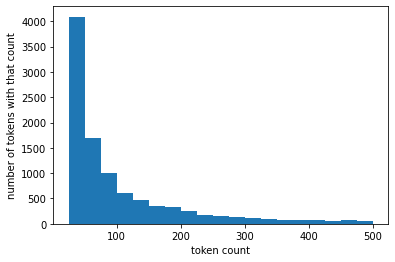

(19997, 10517)
111851 --> 10517


[(0,
  '0.043*"writes" + 0.037*"article" + 0.015*"would" + 0.009*"like" + 0.009*"hockey" + 0.008*"get" + 0.008*"one" + 0.007*"money" + 0.006*"people" + 0.006*"think"'),
 (1,
  '0.037*"science" + 0.027*"writes" + 0.025*"article" + 0.025*"value" + 0.020*"apr" + 0.015*"values" + 0.015*"objective" + 0.014*"date" + 0.013*"frank" + 0.013*"theory"'),
 (2,
  '0.047*"please" + 0.047*"thanks" + 0.038*"email" + 0.032*"anyone" + 0.030*"know" + 0.029*"would" + 0.021*"help" + 0.016*"advance" + 0.016*"looking" + 0.016*"post"'),
 (3,
  '0.041*"game" + 0.034*"team" + 0.022*"games" + 0.019*"year" + 0.018*"play" + 0.016*"players" + 0.014*"win" + 0.011*"last" + 0.011*"first" + 0.011*"baseball"'),
 (4,
  '0.016*"rights" + 0.011*"state" + 0.010*"states" + 0.009*"bill" + 0.008*"amendment" + 0.008*"political" + 0.008*"government" + 0.008*"law" + 0.007*"constitution" + 0.007*"free"'),
 (5,
  '0.041*"gun" + 0.023*"guns" + 0.014*"weapons" + 0.014*"would" + 0.014*"control" + 0.013*"crime" + 0.013*"firearms" + 0.0

In [ ]:
 
# add a list of english words
! wget https://raw.githubusercontent.com/dwyl/english-words/master/words.txt
words = set([word.strip() for word in open('words.txt').readlines()])


# simple tokenization/normalization 

import nltk
nltk.download('punkt')
nltk.download('stopwords')
import string
from nltk.corpus import stopwords
stopwords = set(stopwords.words('english'))
import re
email_pat = re.compile(r"\S+@\S+\.\S+")
url_pat = re.compile("^https?:\\/\\/(?:www\\.)?[-a-zA-Z0-9@:%._\\+~#=]{1,256}\\.[a-zA-Z0-9()]{1,6}\\b(?:[-a-zA-Z0-9()@:%_\\+.~#?&\\/=]*)$")

# document is a string containing 1 or more sentences
# returns a list of all of the tokens in the document
def tokenize(document, skip_header = True):
    doc_tokens = []
    if skip_header:
        document = document.split('\n\n',1)[1]
    # use nltk sentence tokenization
    sentences = nltk.sent_tokenize(document)
    for sentence in sentences:
        # use nltk word tokenization
        # remove email addresses
        sentence = re.sub(email_pat,'',sentence)
        sentence = re.sub(url_pat,'',sentence)
        sent_tokens = nltk.word_tokenize(sentence)
        # remove punctuation
        sent_tokens = [word.translate(str.maketrans('', '', string.punctuation)) for word in sent_tokens]
        # lowercase and remove empty strings, stopwords, and numbers (all punctuation will become empty after previous line)
        sent_tokens = [word.lower() for word in sent_tokens if word]
        sent_tokens = ([word for word in sent_tokens if 
                            word not in stopwords 
                            #and word in vocab
                            and not re.search('\d+',word)
                            and len(word) > 2])
        # either use char ngrams or full words
        doc_tokens += sent_tokens
    return doc_tokens

tokenize("header\n\nthis is a test with darwinsomething@ics.edu  and cantelopes@csc.smu.edu in it and some words like computers and baseball the.")



!wget https://archive.ics.uci.edu/ml/machine-learning-databases/20newsgroups-mld/20_newsgroups.tar.gz
!tar -xzvf 20_newsgroups.tar.gz


# get all of the file names for the documents
import glob
paths = glob.glob("20_newsgroups/*/*")
paths

! pip install gensim
from gensim.models import LdaModel
'''
import collections
import numpy as np
from tqdm import tqdm
import math
from scipy.sparse import csc_matrix
# vector_type should be one of ['count','freq','binary','tfidf']
# Update 1: also return id2token: reverse map from col ids back to tokens
# Update 2: make sparse matrix instead of storing all of the 0s so we use less RAM
# didn't implement all matrix types for now (e.g. tfidf)
def compute_sparse_doc_vectors(document_paths):

    document_dicts = []

    # Now we need to make a vector based on these tokens
    # We don't know the full vocab yet (until we process everything)
    # So instead of doing a full pass over everything to compute that
    # Let's make a column_id for each new word we see and use a dict
    # then we can rely on that later to build the vectors without
    # processing the documents again (just need to check the dict objects)
    token2id = {}
    current_next_id = 0

    for doc_path in tqdm(document_paths):
        with open(doc_path,'r',encoding='latin-1') as document_handle:
            document = document_handle.read()
            tokens = tokenize(document)

            # map from token_id -> tf (count, binary, frequency, etc.)
            document_dict = collections.defaultdict(int)

            doc_length = len(tokens)
            for token in tokens:
                if token not in token2id:
                    token2id[token] = current_next_id
                    current_next_id += 1
                    if token == 'cantaloupesrvcscmuedu':
                        print(doc_path)
                token_id = token2id[token]
                document_dict[token_id] += 1

            document_dicts.append(document_dict)

    data = []
    rows = []
    cols = []
    for doc_id, document_dict in enumerate(document_dicts):
        for word_id, count in document_dict.items():
            data.append(count)
            rows.append(doc_id)
            cols.append(word_id)
    mat = csc_matrix((data, (rows, cols)))

    id2token = {id:tok for tok,id in token2id.items()}

    return mat,id2token

subset_paths = paths[::50]
vectors, id2token = compute_sparse_doc_vectors(subset_paths)
print(vectors.shape)
vectors
'''
import collections
import numpy as np
from tqdm import tqdm
import math
from scipy.sparse import csc_matrix
# vector_type should be one of ['count','freq','binary','tfidf']
# Update 1: also return id2token: reverse map from col ids back to tokens
# Update 2: make sparse matrix instead of storing all of the 0s so we use less RAM
# didn't implement all matrix types for now (e.g. tfidf)
def compute_sparse_doc_vectors(document_paths):

    document_dicts = []

    # Now we need to make a vector based on these tokens
    # We don't know the full vocab yet (until we process everything)
    # So instead of doing a full pass over everything to compute that
    # Let's make a column_id for each new word we see and use a dict
    # then we can rely on that later to build the vectors without
    # processing the documents again (just need to check the dict objects)
    token2id = {}
    current_next_id = 0

    for doc_path in tqdm(document_paths):
        with open(doc_path,'r',encoding='latin-1') as document_handle:
            document = document_handle.read()
            tokens = tokenize(document)

            # map from token_id -> tf (count, binary, frequency, etc.)
            document_dict = collections.defaultdict(int)

            doc_length = len(tokens)
            for token in tokens:
                if token not in token2id:
                    token2id[token] = current_next_id
                    current_next_id += 1
                    if token == 'cantaloupesrvcscmuedu':
                        print(doc_path)
                token_id = token2id[token]
                document_dict[token_id] += 1

            document_dicts.append(document_dict)

    data = []
    rows = []
    cols = []
    for doc_id, document_dict in enumerate(document_dicts):
        for word_id, count in document_dict.items():
            data.append(count)
            rows.append(doc_id)
            cols.append(word_id)
    mat = csc_matrix((data, (rows, cols)))

    id2token = {id:tok for tok,id in token2id.items()}

    return mat,id2token

subset_paths = paths[::50]
vectors, id2token = compute_sparse_doc_vectors(subset_paths)
print(vectors.shape)
vectors

# sparse matrix representations
sparse_vectors, id2token = compute_sparse_doc_vectors(paths)
# check out how many stored elements we actually need
print('\n','dense matrix size:',sparse_vectors.shape[0] * sparse_vectors.shape[1])
sparse_vectors

from gensim.models import LdaModel
from gensim.matutils import Sparse2Corpus
num_topics = 25
corpus = Sparse2Corpus(sparse_vectors, documents_columns=False)
# Train the model on the corpus.
# Stream of document vectors or sparse matrix of shape (num_documents, num_terms).
lda = LdaModel(corpus=corpus, id2word=id2token, num_topics=num_topics)


lda.get_topics().shape

lda.print_topics()

# do we need so many words? are rare words getting too high of scores?
# are common words appearing in all topics?
# Let's remove some of the less frequent words
word_counts = sparse_vectors.sum(axis=0)
print(word_counts.shape)
from matplotlib import pyplot as plt
bins = [25,50,75,100,125,150,175,200,225,250,275,300,325,350,375,400,425,450,475,500]
plt.hist(word_counts.tolist()[0], bins)
plt.xlabel("token count")
plt.ylabel("number of tokens with that count")
plt.show()

min_wordcount = 25
mask = np.where(word_counts>min_wordcount,1,0)
col_ids_to_keep = np.nonzero(mask)[1]
filtered_vectors = sparse_vectors[:,col_ids_to_keep]
print(filtered_vectors.shape)
filtered_tokens = [tok for id,tok in id2token.items() if id in col_ids_to_keep]
filtered_id2token = {id:tok for id,tok in enumerate(filtered_tokens)}

print(len(id2token),'-->',len(filtered_tokens))

num_topics = 25
filtered_corpus = Sparse2Corpus(filtered_vectors, documents_columns=False)
# Train the model on the corpus.
# Stream of document vectors or sparse matrix of shape (num_documents, num_terms).
# set more passes which takes longer by might get closer to convergence
# default is just 1 pass through the corpus which probably isn't sufficient
# on colab, seems to take about 30s per pass
lda_v2 = LdaModel(corpus=filtered_corpus, id2word=filtered_id2token, num_topics=num_topics, passes=10)


lda_v2.print_topics(num_topics=num_topics)



Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

[(0,
  '0.112*"find" + 0.082*"trip" + 0.057*"year" + 0.041*"love" + 0.036*"explore" '
  '+ 0.036*"spend" + 0.029*"several" + 0.027*"hour" + 0.021*"location" + '
  '0.020*"believe"'),
 (1,
  '0.103*"site" + 0.026*"magnificent" + 0.024*"company" + 0.023*"lovely" + '
  '0.022*"cover" + 0.021*"shape" + 0.018*"similar" + 0.017*"center" + '
  '0.016*"rock" + 0.016*"yet"'),
 (2,
  '0.035*"however" + 0.025*"wonderful" + 0.021*"winter" + 0.020*"tea" + '
  '0.019*"couple" + 0.018*"person" + 0.018*"map" + 0.018*"actually" + '
  '0.017*"season" + 0.016*"snow"'),
 (3,
  '0.103*"ticket" + 0.068*"walk" + 0.063*"entrance" + 0.058*"line" + '
  '0.057*"long" + 0.044*"get" + 0.039*"exit" + 0.032*"worth" + 0.025*"start" + '
  '0.023*"passport"'),
 (4,
  '0.069*"side" + 0.059*"nice" + 0.032*"main" + 0.029*"crowded" + 0.027*"shop" '
  '+ 0.021*"wear" + 0.021*"holiday" + 0.020*"work" + 0.017*"new" + '
  '0.016*"lose"'),
 (5,
  '0.155*"worth" + 0.111*"huge" + 0.042*"really" + 0.039*"definitely" + '
  '0.036*"

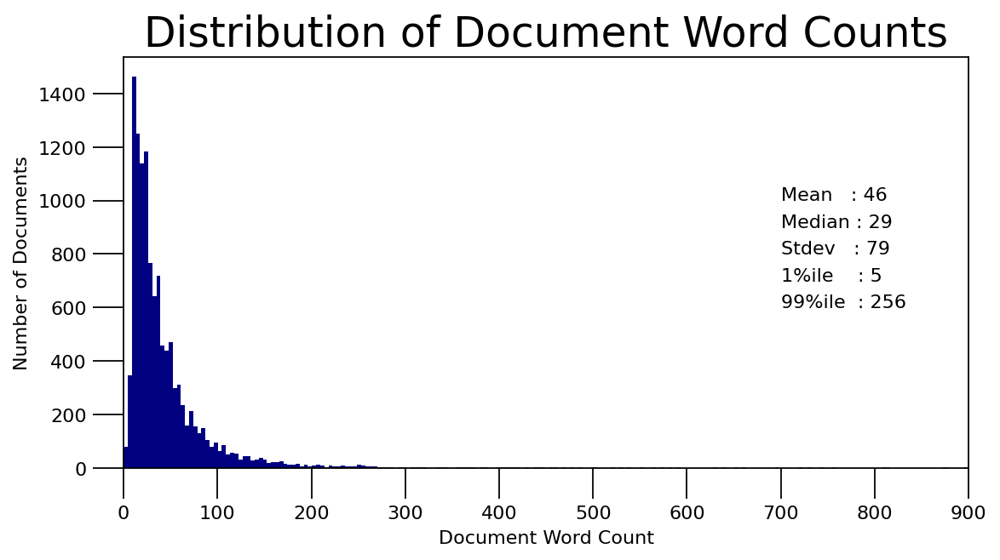

In [ ]:

imUsingColab = True

if imUsingColab:
    !pip install gensim
    !pip install pyLDAvis
   ## !pip install vega
   ## !pip install altair
    
     
import re
import spacy

from nltk.corpus import stopwords 
from nltk.stem.wordnet import WordNetLemmatizer
import string

# import numpy for matrix operation
import numpy as np


from pprint import pprint
import pandas as pd

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim_models  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
from gensim.models.wrappers import LdaMallet

## from google.colab import drive
## drive.mount('/content/drive/')

##!unzip -uq "/content/Names_207039.zip" -d "/content/"
## !unzip -uq "/content/test_names_220610" -d "/content/"
!unzip -uq "/content/mallet-2.0.8.zip" -d "/content/"  
## !unzip -uq "/content/reviews_words.zip" -d "/content/"   
##!unzip -uq "/content/review_huangshan.zip" -d "/content/"   
!unzip -uq "/content/reviews.zip" -d "/content/"  

##dirpath = '/content/Names_207039/'
## dirpath = '/content/test_names/
## dirpath = '/content/reviews_words/'
## dirpath = '/content/review_huangshan/'
dirpath = '/content/reviews/'
mallet_path = '/content/mallet-2.0.8/bin/mallet'

import os
## Setup mallet environment change it according to your drive
os.environ.update({'MALLET_HOME':r'/content/mallet-2.0.8'})
## Setup mallet path change it according to your drive

files = [os.path.join(dirpath, fname) for fname in os.listdir(dirpath)]
corpus_text = []

for filename in sorted(files):
    with open(filename, 'r') as f:
        corpus_text += [f.read()]




from pathlib import Path

doc_names = [Path(file).stem for file in sorted(files)]

# Apply Preprocessing on the Corpus

# Apply Preprocessing on the Corpus

import nltk

nltk.download('omw-1.4')
nltk.download('wordnet')
nltk.download('stopwords')

# stop loss words
stop = set(stopwords.words('english'))

# punctuation
exclude = set(string.punctuation)

# lemmatization
lemma = WordNetLemmatizer()

# One function for all the steps:
def clean(doc):
    
    doc = re.sub("([^\x00-\x7F])+"," ", str(doc))
    ## doc = re.sub(r'\b\d+(?:\.\d+)?\s+', '', str(doc))
    ## print(doc)
    # convert text into lower case + split into words
    stop_free = " ".join([i for i in doc.lower().split() if i not in stop])

    for z in stop_free:
      
      ## string = 'abcd1234efg567'
      z = re.sub(r'\b\d+(?:\.\d+)?\s+', '', str(z))
      
      newstring = ''.join([i for i in z if not i.isdigit()]).lower()
      if not(len(newstring) < 2):
          ## print(newstring)
          stringVal = stringVal + " " + newstring
   
    # remove any stop words present
    punc_free = ''.join(ch for ch in stop_free if ch not in exclude)  
   
    # remove punctuations + normalize the text
    normalized = " ".join(lemma.lemmatize(word) for word in punc_free.split() if not word.isdigit())  
    return normalized

# clean data stored in a new list
clean_corpus    = [clean(doc).split() for doc in corpus_text]
## data_lemmatized = [clean(doc).split() for doc in corpus]

# Create Dictionary
##id2word = corpora.Dictionary(data_lemmatized)
id2word = corpora.Dictionary(clean_corpus)

# Create Corpus
texts = clean_corpus

##

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# Human readable format of corpus (term-frequency)
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:3]]




from nltk.corpus import stopwords
stop_words = stopwords.words('english')
## stop_words.extend(['for', 'and', 'to', 'the', 'you', 'not', 'from', 'subject', 're', 'edu', 'use'])

# Build the bigram and trigram models
bigram = gensim.models.Phrases(texts, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[texts], threshold=100)  
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# !python3 -m spacy download en  # run in terminal once
def process_words(texts, stop_words=stop_words, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """Remove Stopwords, Form Bigrams, Trigrams and Lemmatization"""
    texts = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]
    texts = [bigram_mod[doc] for doc in texts]
    texts = [trigram_mod[bigram_mod[doc]] for doc in texts]
    texts_out = []
    nlp = spacy.load("en_core_web_sm")
    ## nlp = spacy.load('en', disable=['parser', 'ner'])
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    # remove stopwords once more after lemmatization
    texts_out = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts_out]    
    return texts_out

data_ready = process_words(texts)  # processed Text Data!

# Create Dictionary
id2word = corpora.Dictionary(data_ready)

# Create Corpus: Term Document Frequency
corpus = [id2word.doc2bow(text) for text in data_ready]

# Build LDA model
'''
lda_model = gensim.models.wrappers.LdaMallet(mallet_path, 
                                          corpus=corpus, 
                                          num_topics=4, 
                                          ## alpha=1/num_topics,
                                          alpha=50/4,
                                          id2word=id2word, 
                                          workers=40,
                                          optimize_interval=4,
                                          iterations=500) 
                                          ##iterations=1500)  
'''
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=20,
                                           passes=10,
                                           alpha='symmetric',
                                           iterations=100,
                                           per_word_topics=True)


pprint(lda_model.print_topics())


import math 

def format_topics_sentences(ldamodel=None, corpus=corpus, texts=data_ready):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            ## print(topic_num)
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num, topn=20)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([math.floor(topic_num), round(prop_topic, 4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dom_t', 'Contri', 'Topic_Keywords']
    print(sent_topics_df.columns)

    # Add original text to the end of the output
    contents = pd.Series(texts)
    names = pd.Series(doc_names)

    sent_topics_df = pd.concat([sent_topics_df, contents, names], axis=1)
    ## sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data_ready)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
# df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

df_dominant_topic.columns = ['D#', 'Dom_t', 'Contri', 'Keywords', 'Text', 'Name']
df_dominant_topic.head(20)



# Display setting to show more characters in column
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_mallet = pd.DataFrame()
sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dom_t')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, grp.sort_values(['Contri'], ascending=False).head(1)], axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['T#', "Contri", "Keywords", 'Text', 'Name']

# Show
sent_topics_sorteddf_mallet.head(20)


doc_lens = [len(d) for d in df_dominant_topic.Text]

# Plot
plt.figure(figsize=(8,4), dpi=160)
plt.hist(doc_lens, bins = 900, color='navy')
plt.text(700, 1000, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(700, 900, "Median : " + str(round(np.median(doc_lens))))
plt.text(700, 800, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(700, 700, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(700, 600, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))
'''plt.text(700, 45, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(700, 40, "Median : " + str(round(np.median(doc_lens))))
plt.text(700, 35, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(700, 30, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(700, 25, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))'''

plt.gca().set(xlim=(0, 900), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,900,10))
plt.title('Distribution of Document Word Counts', fontdict=dict(size=22))
plt.show()


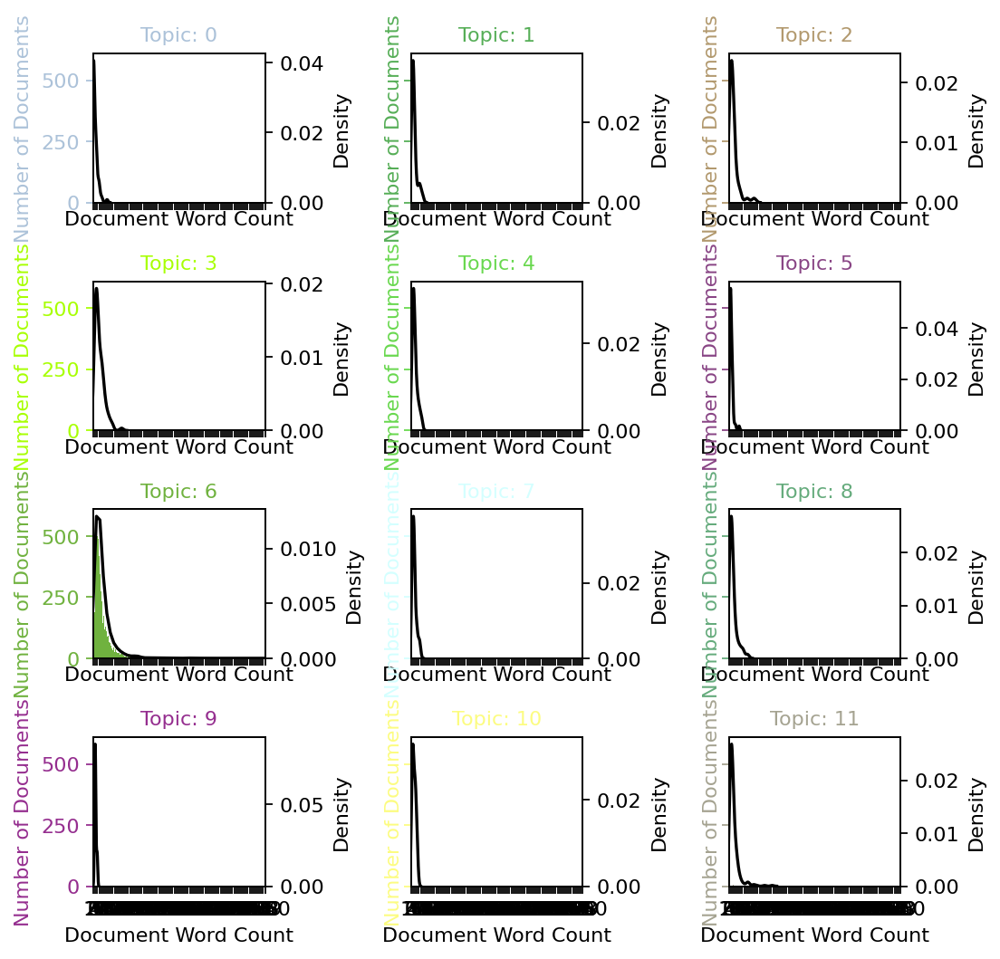

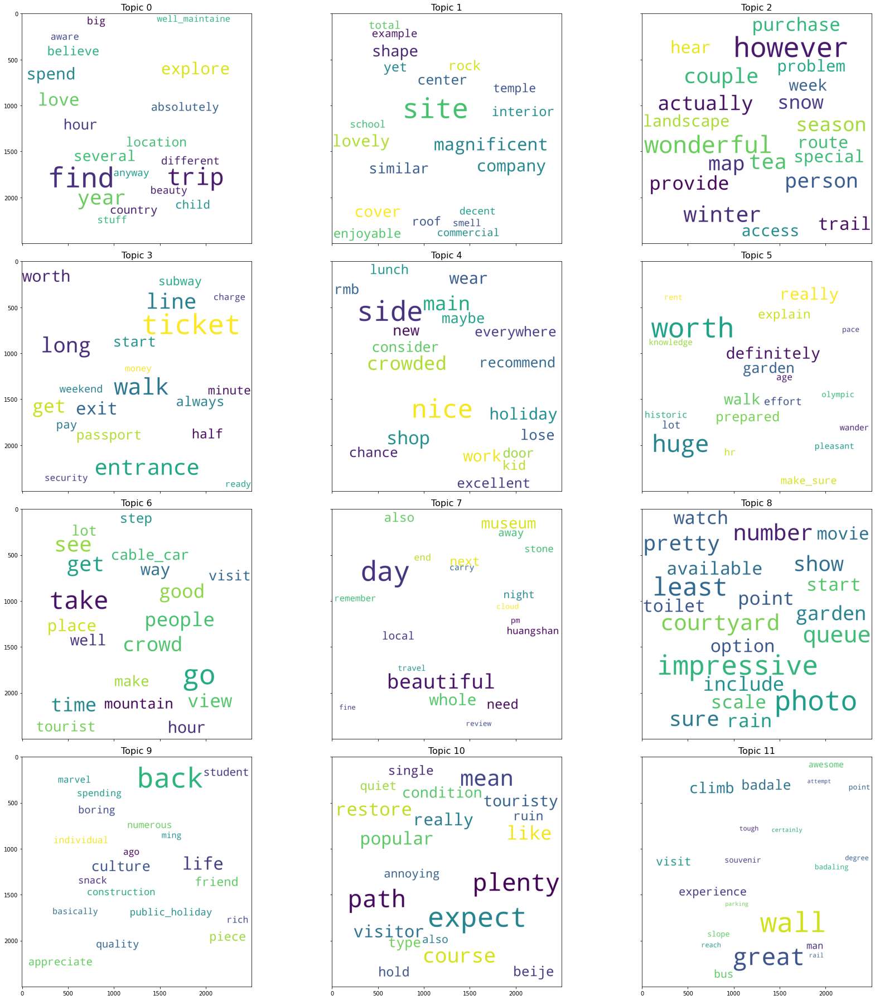

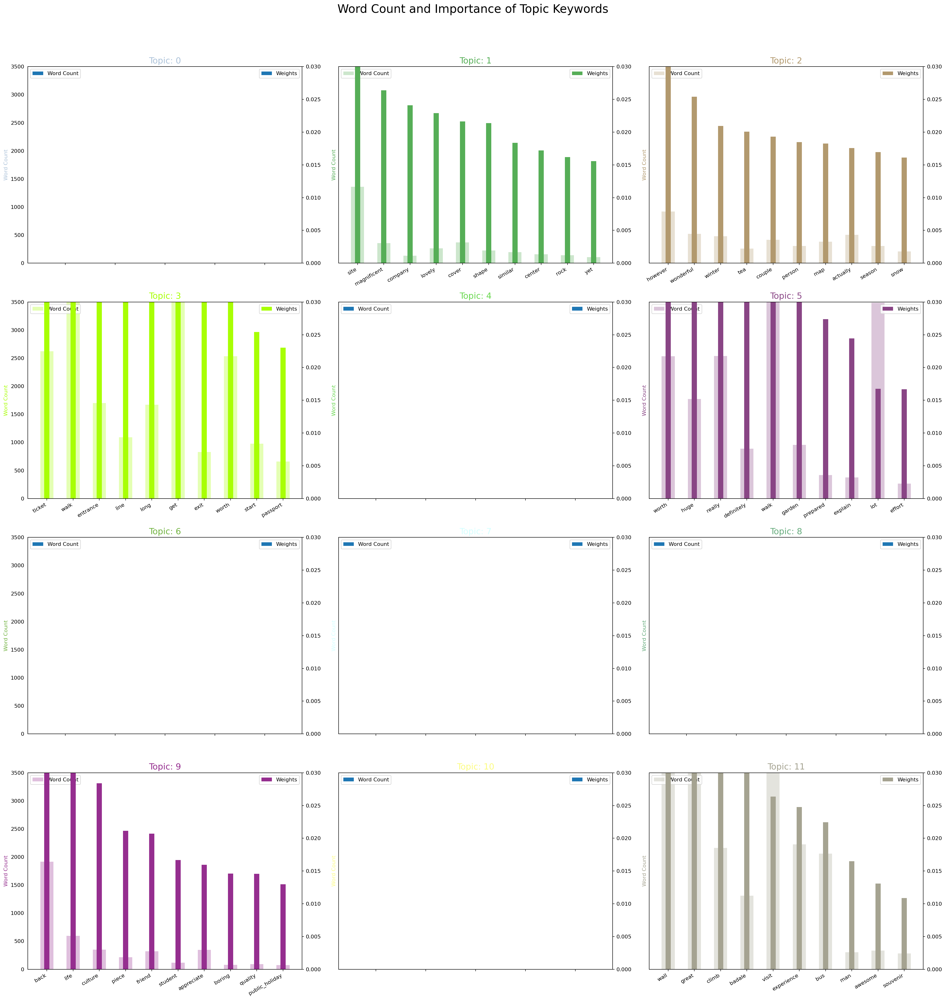

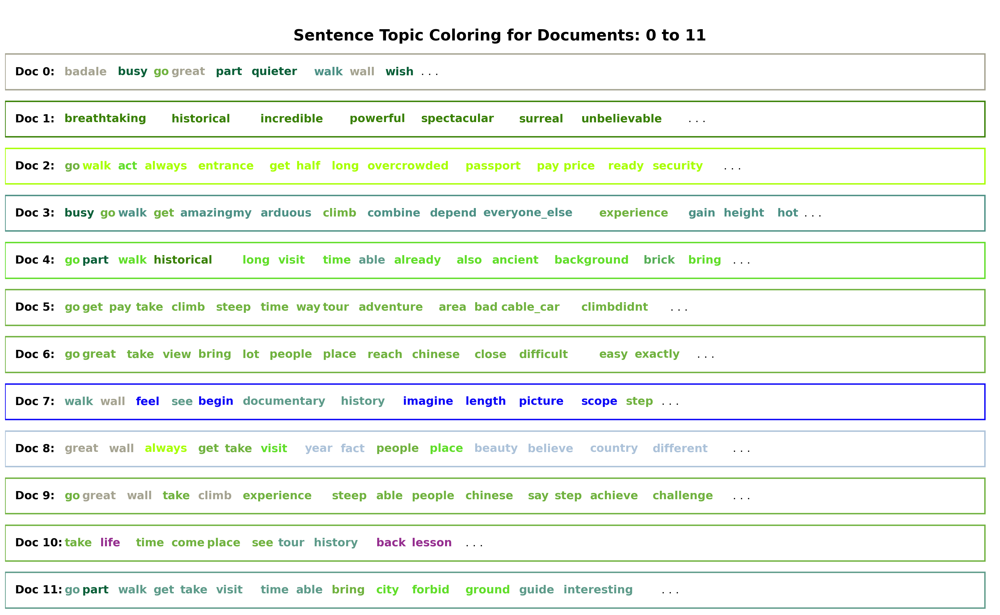

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4377 samples in 0.001s...
[t-SNE] Computed neighbors for 4377 samples in 0.461s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4377
[t-SNE] Computed conditional probabilities for sample 2000 / 4377
[t-SNE] Computed conditional probabilities for sample 3000 / 4377
[t-SNE] Computed conditional probabilities for sample 4000 / 4377
[t-SNE] Computed conditional probabilities for sample 4377 / 4377
[t-SNE] Mean sigma: 0.062987


/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.695511
[t-SNE] KL divergence after 1000 iterations: 1.072565


In [ ]:
import seaborn as sns
import matplotlib.colors as mcolors
##cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'
cols = [color for name, color in mcolors.XKCD_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

fig, axes = plt.subplots(4,3,figsize=(7,7), dpi=160, sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):    
    df_dominant_topic_sub = df_dominant_topic.loc[df_dominant_topic.Dom_t == i, :]
    doc_lens = [len(d) for d in df_dominant_topic_sub.Text]
    ax.hist(doc_lens, bins = 1000, color=cols[i])
    ax.tick_params(axis='y', labelcolor=cols[i], color=cols[i])
    sns.kdeplot(doc_lens, color="black", shade=False, ax=ax.twinx())
    ax.set(xlim=(0, 1000), xlabel='Document Word Count')
    ax.set_ylabel('Number of Documents', color=cols[i])
    ax.set_title('Topic: '+str(i), fontdict=dict(size=10, color=cols[i]))

fig.tight_layout()
fig.subplots_adjust(top=0.90)
plt.xticks(np.linspace(0,1000,90))
## fig.suptitle('Distribution of Document Word Counts by Dominant Topic', fontsize=22)
plt.show()

# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

##cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'
cols = [color for name, color in mcolors.XKCD_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS

'''
wordcloud = WordCloud()
wordcloud.generate_from_frequencies(frequencies=d)
plt.figure(num=None, figsize=(12, 10), dpi=80, facecolor='w',
           edgecolor='k')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud", fontsize=20)
plt.show()
'''

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=2500,
                  max_words=20,
                  ##colormap='tab10',
                  ##color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model.show_topics(formatted=False,  num_topics=20, num_words=20)

fig, axes = plt.subplots(4, 3, figsize=(25,25), sharex=True, sharey=True)

##for i, ax in enumerate(axes):
for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    #print(i)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    ##plt.figure(num=None, figsize=(12, 10), dpi=80, facecolor='w',edgecolor='k')
    #fig = plt.figure(num=None, figsize=(12, 10), dpi=80, facecolor='w',edgecolor='k')
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('on')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('on')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()


'''
plt.figure(0)
for i in range(5):
    for j in range(4):
        ax = plt.subplot2grid((5,4), (i,j))
plt.show()


import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

try:
    from itertools import product
except ImportError:
    # product is new in v 2.6
    def product(*args, **kwds):
        pools = map(tuple, args) * kwds.get('repeat', 1)
        result = [[]]
        for pool in pools:
            result = [x+[y] for x in result for y in pool]
        for prod in result:
            yield tuple(prod)


def squiggle_xy(a, b, c, d, i=np.arange(0.0, 2*np.pi, 0.05)):
    return np.sin(i*a)*np.cos(i*b), np.sin(i*c)*np.cos(i*d)

fig = plt.figure(figsize=(8, 8))

# gridspec inside gridspec
outer_grid = gridspec.GridSpec(4, 4, wspace=0.0, hspace=0.0)

for i in range(16):
    inner_grid = gridspec.GridSpecFromSubplotSpec(3, 3,
            subplot_spec=outer_grid[i], wspace=0.0, hspace=0.0)
    a, b = int(i/4)+1,i%4+1
    for j, (c, d) in enumerate(product(range(1, 4), repeat=2)):
        ax = plt.Subplot(fig, inner_grid[j])
        ax.plot(*squiggle_xy(a, b, c, d))
        ax.set_xticks([])
        ax.set_yticks([])
        fig.add_subplot(ax)

all_axes = fig.get_axes()

#show only the outside spines
for ax in all_axes:
    for sp in ax.spines.values():
        sp.set_visible(False)
    if ax.is_first_row():
        ax.spines['top'].set_visible(True)
    if ax.is_last_row():
        ax.spines['bottom'].set_visible(True)
    if ax.is_first_col():
        ax.spines['left'].set_visible(True)
    if ax.is_last_col():
        ax.spines['right'].set_visible(True)

plt.show()
'''


from collections import Counter
topics = lda_model.show_topics(formatted=False)
data_flat = [w for w_list in data_ready for w in w_list]
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(4, 3, figsize=(25, 25), sharey=True, dpi=160)
##cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'
cols = [color for name, color in mcolors.XKCD_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS

for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 3500)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=22, y=1.05)    
plt.show()


# Sentence Coloring of N Sentences
from matplotlib.patches import Rectangle

def sentences_chart(lda_model=lda_model, corpus=corpus, start = 0, end = 13):
    corp = corpus[start:end]
    mycolors = [color for name, color in mcolors.XKCD_COLORS.items()]
    ##cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'
    ##cols = [color for name, color in mcolors.XKCD_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS

    fig, axes = plt.subplots(end-start, 1, figsize=(20, (end-start)*0.95), dpi=160)       
    axes[0].axis('off')
    for i, ax in enumerate(axes):
        if i > 0:
            corp_cur = corp[i-1] 
            topic_percs, wordid_topics, wordid_phivalues = lda_model[corp_cur]
            word_dominanttopic = [(lda_model.id2word[wd], topic[0]) for wd, topic in wordid_topics]    
            ax.text(0.01, 0.5, "Doc " + str(i-1) + ": ", verticalalignment='center',
                    fontsize=16, color='black', transform=ax.transAxes, fontweight=700)

            # Draw Rectange
            topic_percs_sorted = sorted(topic_percs, key=lambda x: (x[1]), reverse=True)
            ax.add_patch(Rectangle((0.0, 0.05), 0.99, 0.90, fill=None, alpha=1, 
                                   color=mycolors[topic_percs_sorted[0][0]], linewidth=2))

            word_pos = 0.06
            for j, (word, topics) in enumerate(word_dominanttopic):
                if j < 14:
                    ax.text(word_pos, 0.5, word,
                            horizontalalignment='left',
                            verticalalignment='center',
                            fontsize=16, color=mycolors[topics],
                            transform=ax.transAxes, fontweight=700)
                    word_pos += .009 * len(word)  # to move the word for the next iter
                    ax.axis('off')
            ax.text(word_pos, 0.5, '. . .',
                    horizontalalignment='left',
                    verticalalignment='center',
                    fontsize=16, color='black',
                    transform=ax.transAxes)       

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.suptitle('Sentence Topic Coloring for Documents: ' + str(start) + ' to ' + str(end-2), fontsize=22, y=0.95, fontweight=700)
    plt.tight_layout()
    plt.show()

sentences_chart()



# Get topic weights and dominant topics ------------
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook

# Get topic weights
topic_weights = []
for i, row_list in enumerate(lda_model[corpus]):
    topic_weights.append([w for i, w in row_list[0]])

# Array of topic weights    
arr = pd.DataFrame(topic_weights).fillna(0).values

# Keep the well separated points (optional)
arr = arr[np.amax(arr, axis=1) > 0.35]

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, angle=.99, init='pca')
tsne_lda = tsne_model.fit_transform(arr)

# Plot the Topic Clusters using Bokeh
output_notebook()
n_topics = 20
mycolors = np.array([color for name, color in mcolors.XKCD_COLORS.items()])

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])
show(plot)












In [ ]:

imUsingColab = True

if imUsingColab:
    !pip install gensim
    !pip install pyLDAvis
   ## !pip install vega
   ## !pip install altair
    
     
import re
import spacy

from nltk.corpus import stopwords 
from nltk.stem.wordnet import WordNetLemmatizer
import string

# import numpy for matrix operation
import numpy as np


from pprint import pprint
import pandas as pd

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim_models  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
from gensim.models.wrappers import LdaMallet

## from google.colab import drive
## drive.mount('/content/drive/')

##!unzip -uq "/content/Names_207039.zip" -d "/content/"
## !unzip -uq "/content/test_names_220610" -d "/content/"
!unzip -uq "/content/mallet-2.0.8.zip" -d "/content/"  
## !unzip -uq "/content/reviews_words.zip" -d "/content/"   
##!unzip -uq "/content/review_huangshan.zip" -d "/content/"   
!unzip -uq "/content/reviews.zip" -d "/content/"  

##dirpath = '/content/Names_207039/'
## dirpath = '/content/test_names/
## dirpath = '/content/reviews_words/'
## dirpath = '/content/review_huangshan/'
dirpath = '/content/reviews/'
mallet_path = '/content/mallet-2.0.8/bin/mallet'

import os
## Setup mallet environment change it according to your drive
os.environ.update({'MALLET_HOME':r'/content/mallet-2.0.8'})
## Setup mallet path change it according to your drive

files = [os.path.join(dirpath, fname) for fname in os.listdir(dirpath)]
corpus_text = []

for filename in sorted(files):
    with open(filename, 'r') as f:
        corpus_text += [f.read()]




from pathlib import Path

doc_names = [Path(file).stem for file in sorted(files)]

# Apply Preprocessing on the Corpus

# Apply Preprocessing on the Corpus

import nltk

nltk.download('omw-1.4')
nltk.download('wordnet')
nltk.download('stopwords')

# stop loss words
stop = set(stopwords.words('english'))

# punctuation
exclude = set(string.punctuation)

# lemmatization
lemma = WordNetLemmatizer()

# One function for all the steps:
def clean(doc):
    
    doc = re.sub("([^\x00-\x7F])+"," ", str(doc))
    ## doc = re.sub(r'\b\d+(?:\.\d+)?\s+', '', str(doc))
    ## print(doc)
    # convert text into lower case + split into words
    stop_free = " ".join([i for i in doc.lower().split() if i not in stop])

    for z in stop_free:
      
      ## string = 'abcd1234efg567'
      z = re.sub(r'\b\d+(?:\.\d+)?\s+', '', str(z))
      
      newstring = ''.join([i for i in z if not i.isdigit()]).lower()
      if not(len(newstring) < 2):
          ## print(newstring)
          stringVal = stringVal + " " + newstring
   
    # remove any stop words present
    punc_free = ''.join(ch for ch in stop_free if ch not in exclude)  
   
    # remove punctuations + normalize the text
    normalized = " ".join(lemma.lemmatize(word) for word in punc_free.split() if not word.isdigit())  
    return normalized

# clean data stored in a new list
clean_corpus    = [clean(doc).split() for doc in corpus_text]
## data_lemmatized = [clean(doc).split() for doc in corpus]

# Create Dictionary
##id2word = corpora.Dictionary(data_lemmatized)
id2word = corpora.Dictionary(clean_corpus)

# Create Corpus
texts = clean_corpus

##

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# Human readable format of corpus (term-frequency)
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:3]]



In [ ]:
'''
def sent_to_words(sentences):
    for sent in sentences:
        sent = re.sub('\S*@\S*\s?', '', sent)  # remove emails
        sent = re.sub('\s+', ' ', sent)  # remove newline chars
        sent = re.sub("\'", "", sent)  # remove single quotes
        sent = gensim.utils.simple_preprocess(str(sent), deacc=True) 
        yield(sent)  

# Convert to list
data = df.content.values.tolist()
data_words = list(sent_to_words(data))
print(data_words[:1])
'''

In [ ]:

from nltk.corpus import stopwords
stop_words = stopwords.words('english')
## stop_words.extend(['for', 'and', 'to', 'the', 'you', 'not', 'from', 'subject', 're', 'edu', 'use'])

# Build the bigram and trigram models
bigram = gensim.models.Phrases(texts, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[texts], threshold=100)  
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# !python3 -m spacy download en  # run in terminal once
def process_words(texts, stop_words=stop_words, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """Remove Stopwords, Form Bigrams, Trigrams and Lemmatization"""
    texts = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]
    texts = [bigram_mod[doc] for doc in texts]
    texts = [trigram_mod[bigram_mod[doc]] for doc in texts]
    texts_out = []
    nlp = spacy.load("en_core_web_sm")
    ## nlp = spacy.load('en', disable=['parser', 'ner'])
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    # remove stopwords once more after lemmatization
    texts_out = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts_out]    
    return texts_out

data_ready = process_words(texts)  # processed Text Data!

/usr/local/lib/python3.8/dist-packages/gensim/models/phrases.py:598: UserWarning: For a faster implementation, use the gensim.models.phrases.Phraser class
  warnings.warn("For a faster implementation, use the gensim.models.phrases.Phraser class")


In [ ]:
# Create Dictionary
id2word = corpora.Dictionary(data_ready)

# Create Corpus: Term Document Frequency
corpus = [id2word.doc2bow(text) for text in data_ready]

# Build LDA model
'''
lda_model = gensim.models.wrappers.LdaMallet(mallet_path, 
                                          corpus=corpus, 
                                          num_topics=4, 
                                          ## alpha=1/num_topics,
                                          alpha=50/4,
                                          id2word=id2word, 
                                          workers=40,
                                          optimize_interval=4,
                                          iterations=500) 
                                          ##iterations=1500)  
'''
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=20,
                                           passes=10,
                                           alpha='symmetric',
                                           iterations=100,
                                           per_word_topics=True)


pprint(lda_model.print_topics())

In [ ]:
import math 

def format_topics_sentences(ldamodel=None, corpus=corpus, texts=data_ready):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            ## print(topic_num)
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num, topn=20)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([math.floor(topic_num), round(prop_topic, 4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dom_t', 'Contri', 'Topic_Keywords']
    print(sent_topics_df.columns)

    # Add original text to the end of the output
    contents = pd.Series(texts)
    names = pd.Series(doc_names)

    sent_topics_df = pd.concat([sent_topics_df, contents, names], axis=1)
    ## sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data_ready)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
# df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

df_dominant_topic.columns = ['D#', 'Dom_t', 'Contri', 'Keywords', 'Text', 'Name']
df_dominant_topic.head(20)

In [ ]:
# Display setting to show more characters in column
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_mallet = pd.DataFrame()
sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dom_t')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, grp.sort_values(['Contri'], ascending=False).head(1)], axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['T#', "Contri", "Keywords", 'Text', 'Name']

# Show
sent_topics_sorteddf_mallet.head(20)

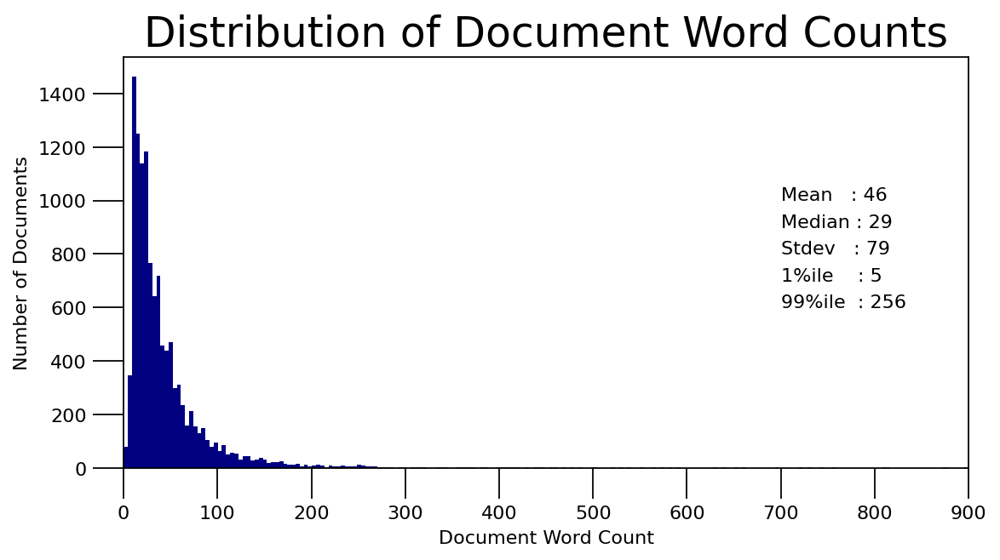

In [ ]:
doc_lens = [len(d) for d in df_dominant_topic.Text]

# Plot
plt.figure(figsize=(8,4), dpi=160)
plt.hist(doc_lens, bins = 900, color='navy')
plt.text(700, 1000, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(700, 900, "Median : " + str(round(np.median(doc_lens))))
plt.text(700, 800, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(700, 700, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(700, 600, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))
'''plt.text(700, 45, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(700, 40, "Median : " + str(round(np.median(doc_lens))))
plt.text(700, 35, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(700, 30, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(700, 25, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))'''

plt.gca().set(xlim=(0, 900), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,900,10))
plt.title('Distribution of Document Word Counts', fontdict=dict(size=22))
plt.show()

In [ ]:
import seaborn as sns
import matplotlib.colors as mcolors
##cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'
cols = [color for name, color in mcolors.XKCD_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

fig, axes = plt.subplots(4,3,figsize=(7,7), dpi=160, sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):    
    df_dominant_topic_sub = df_dominant_topic.loc[df_dominant_topic.Dom_t == i, :]
    doc_lens = [len(d) for d in df_dominant_topic_sub.Text]
    ax.hist(doc_lens, bins = 1000, color=cols[i])
    ax.tick_params(axis='y', labelcolor=cols[i], color=cols[i])
    sns.kdeplot(doc_lens, color="black", shade=False, ax=ax.twinx())
    ax.set(xlim=(0, 1000), xlabel='Document Word Count')
    ax.set_ylabel('Number of Documents', color=cols[i])
    ax.set_title('Topic: '+str(i), fontdict=dict(size=10, color=cols[i]))

fig.tight_layout()
fig.subplots_adjust(top=0.90)
plt.xticks(np.linspace(0,1000,90))
## fig.suptitle('Distribution of Document Word Counts by Dominant Topic', fontsize=22)
plt.show()

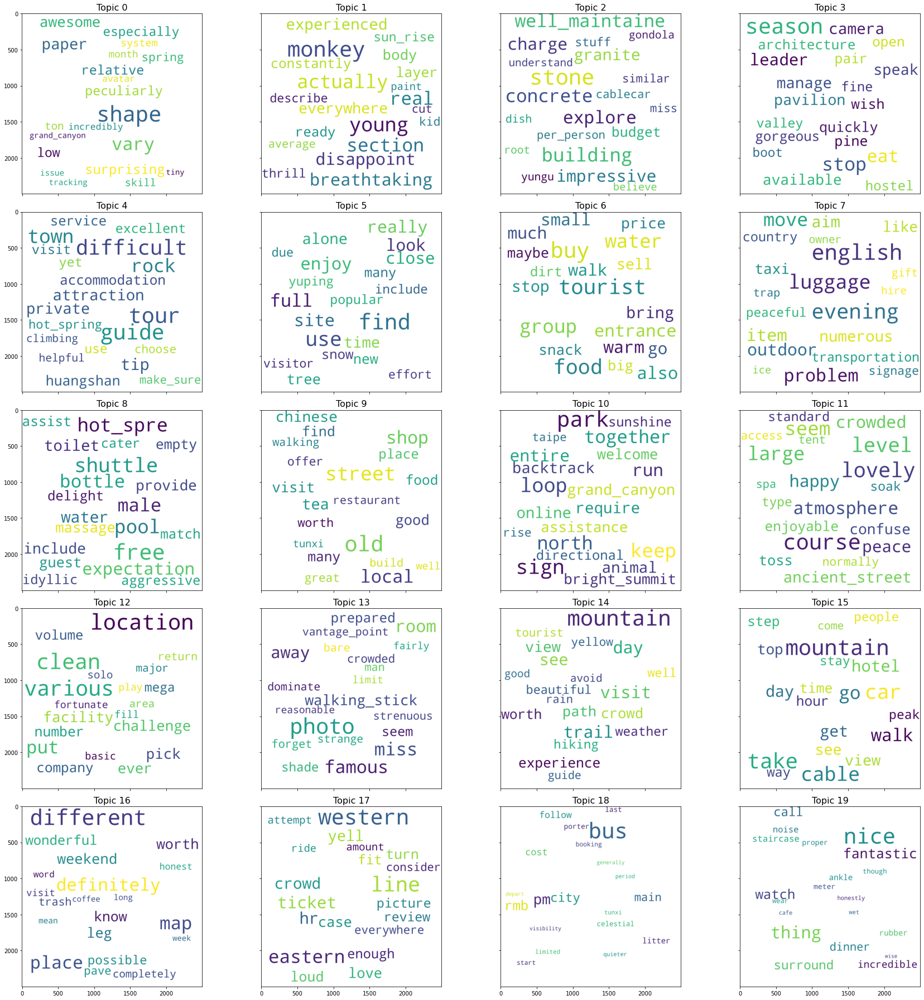

"\nplt.figure(0)\nfor i in range(5):\n    for j in range(4):\n        ax = plt.subplot2grid((5,4), (i,j))\nplt.show()\n\n\nimport matplotlib.pyplot as plt\nimport matplotlib.gridspec as gridspec\nimport numpy as np\n\ntry:\n    from itertools import product\nexcept ImportError:\n    # product is new in v 2.6\n    def product(*args, **kwds):\n        pools = map(tuple, args) * kwds.get('repeat', 1)\n        result = [[]]\n        for pool in pools:\n            result = [x+[y] for x in result for y in pool]\n        for prod in result:\n            yield tuple(prod)\n\n\ndef squiggle_xy(a, b, c, d, i=np.arange(0.0, 2*np.pi, 0.05)):\n    return np.sin(i*a)*np.cos(i*b), np.sin(i*c)*np.cos(i*d)\n\nfig = plt.figure(figsize=(8, 8))\n\n# gridspec inside gridspec\nouter_grid = gridspec.GridSpec(4, 4, wspace=0.0, hspace=0.0)\n\nfor i in range(16):\n    inner_grid = gridspec.GridSpecFromSubplotSpec(3, 3,\n            subplot_spec=outer_grid[i], wspace=0.0, hspace=0.0)\n    a, b = int(i/4)+1,i%4+

In [ ]:
# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

##cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'
cols = [color for name, color in mcolors.XKCD_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS

'''
wordcloud = WordCloud()
wordcloud.generate_from_frequencies(frequencies=d)
plt.figure(num=None, figsize=(12, 10), dpi=80, facecolor='w',
           edgecolor='k')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud", fontsize=20)
plt.show()
'''

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=2500,
                  max_words=20,
                  ##colormap='tab10',
                  ##color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model.show_topics(formatted=False,  num_topics=20, num_words=20)

fig, axes = plt.subplots(5, 4, figsize=(25,25), sharex=True, sharey=True)

##for i, ax in enumerate(axes):
for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    #print(i)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    ##plt.figure(num=None, figsize=(12, 10), dpi=80, facecolor='w',edgecolor='k')
    #fig = plt.figure(num=None, figsize=(12, 10), dpi=80, facecolor='w',edgecolor='k')
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('on')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('on')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()


'''
plt.figure(0)
for i in range(5):
    for j in range(4):
        ax = plt.subplot2grid((5,4), (i,j))
plt.show()


import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

try:
    from itertools import product
except ImportError:
    # product is new in v 2.6
    def product(*args, **kwds):
        pools = map(tuple, args) * kwds.get('repeat', 1)
        result = [[]]
        for pool in pools:
            result = [x+[y] for x in result for y in pool]
        for prod in result:
            yield tuple(prod)


def squiggle_xy(a, b, c, d, i=np.arange(0.0, 2*np.pi, 0.05)):
    return np.sin(i*a)*np.cos(i*b), np.sin(i*c)*np.cos(i*d)

fig = plt.figure(figsize=(8, 8))

# gridspec inside gridspec
outer_grid = gridspec.GridSpec(4, 4, wspace=0.0, hspace=0.0)

for i in range(16):
    inner_grid = gridspec.GridSpecFromSubplotSpec(3, 3,
            subplot_spec=outer_grid[i], wspace=0.0, hspace=0.0)
    a, b = int(i/4)+1,i%4+1
    for j, (c, d) in enumerate(product(range(1, 4), repeat=2)):
        ax = plt.Subplot(fig, inner_grid[j])
        ax.plot(*squiggle_xy(a, b, c, d))
        ax.set_xticks([])
        ax.set_yticks([])
        fig.add_subplot(ax)

all_axes = fig.get_axes()

#show only the outside spines
for ax in all_axes:
    for sp in ax.spines.values():
        sp.set_visible(False)
    if ax.is_first_row():
        ax.spines['top'].set_visible(True)
    if ax.is_last_row():
        ax.spines['bottom'].set_visible(True)
    if ax.is_first_col():
        ax.spines['left'].set_visible(True)
    if ax.is_last_col():
        ax.spines['right'].set_visible(True)

plt.show()
'''

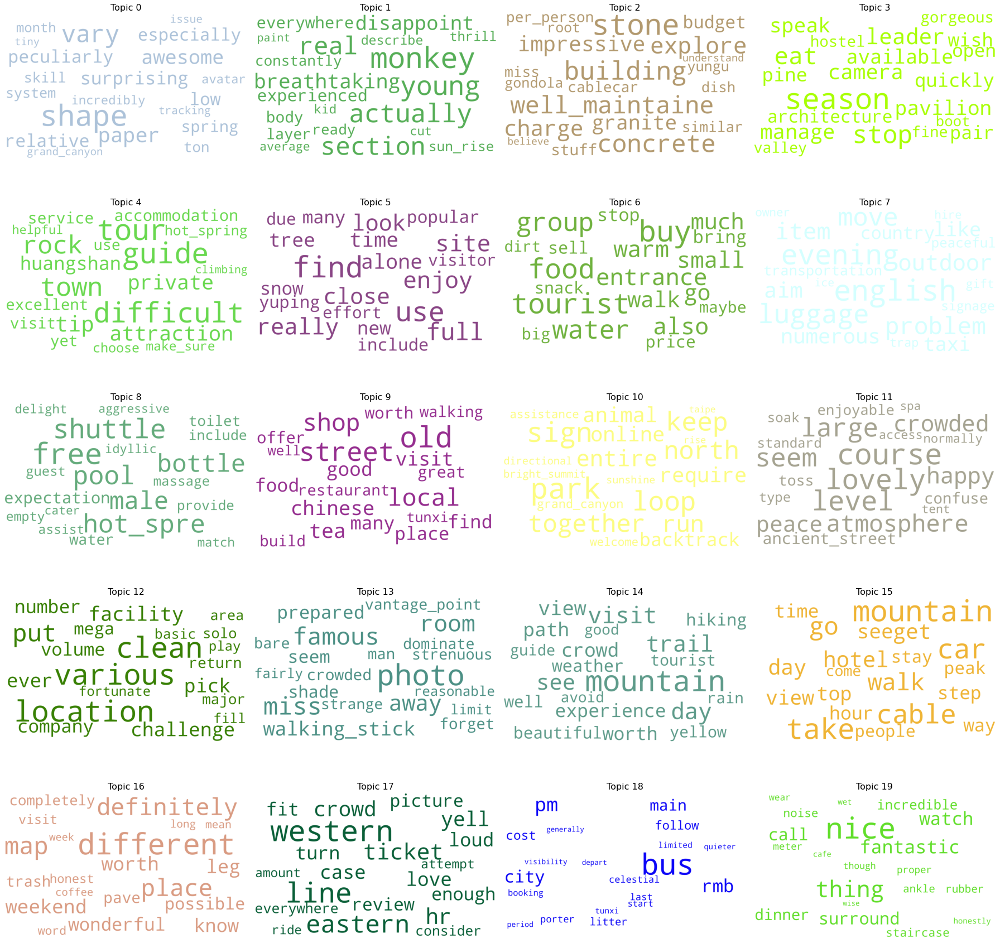

'\ndef create_wordcloud(model, topic):\n    text = {word: value for word, value in model.show_topic(topic)}\n    wc = WordCloud(background_color="white", max_words=1000)\n    wc.generate_from_frequencies(text)\n    plt.imshow(wc, interpolation="bilinear")\n    plt.axis("off")\n    plt.title("Topic" + " "+ str(topic))\n    plt.show()\n\nfor i in range(1, 15):\n    create_wordcloud(lda_model, topic=i)\n'

In [ ]:

'''
from gensim.test.utils import common_texts
from gensim.corpora.dictionary import Dictionary
import gensim
import matplotlib.pyplot as plt
from wordcloud import WordCloud

common_dictionary = Dictionary(common_texts) # create corpus
common_corpus = [common_dictionary.doc2bow(text) for text in common_texts]

lda_model = gensim.models.LdaModel(common_corpus, num_topics=20) # train model on corpus
for t in range(lda_model.num_topics):
    plt.figure()
    ##plt.imshow(WordCloud().fit_words(lda_model.show_topic(t, 200)))
    plt.imshow(WordCloud().fit_words(dict(lda_model.show_topic(t, 200))))
    plt.axis("off")
    plt.title("Topic #" + str(t))
    plt.show()
    

'''
# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

##cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'
cols = [color for name, color in mcolors.XKCD_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=1500,
                  max_words=20,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

##topics = lda_model.show_topics(formatted=False)
topics = lda_model.show_topics(formatted=False,  num_topics=20, num_words=20)

##fig, axes = plt.subplots(2, 3, figsize=(12,10), sharex=True, sharey=True)
fig, axes = plt.subplots(5, 4, figsize=(25,25), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

'''
def create_wordcloud(model, topic):
    text = {word: value for word, value in model.show_topic(topic)}
    wc = WordCloud(background_color="white", max_words=1000)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title("Topic" + " "+ str(topic))
    plt.show()

for i in range(1, 15):
    create_wordcloud(lda_model, topic=i)
'''

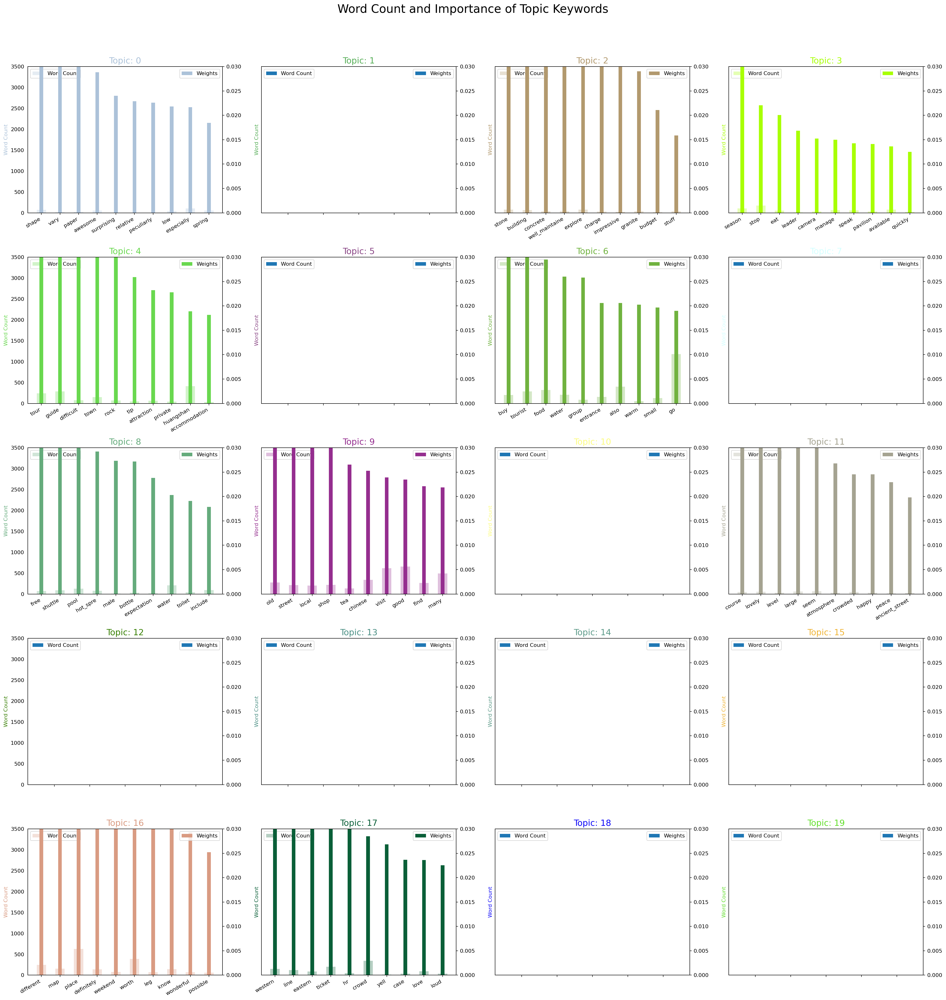

In [ ]:
from collections import Counter
topics = lda_model.show_topics(formatted=False)
data_flat = [w for w_list in data_ready for w in w_list]
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(5, 4, figsize=(25, 25), sharey=True, dpi=160)
##cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'
cols = [color for name, color in mcolors.XKCD_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS

for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 3500)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=22, y=1.05)    
plt.show()

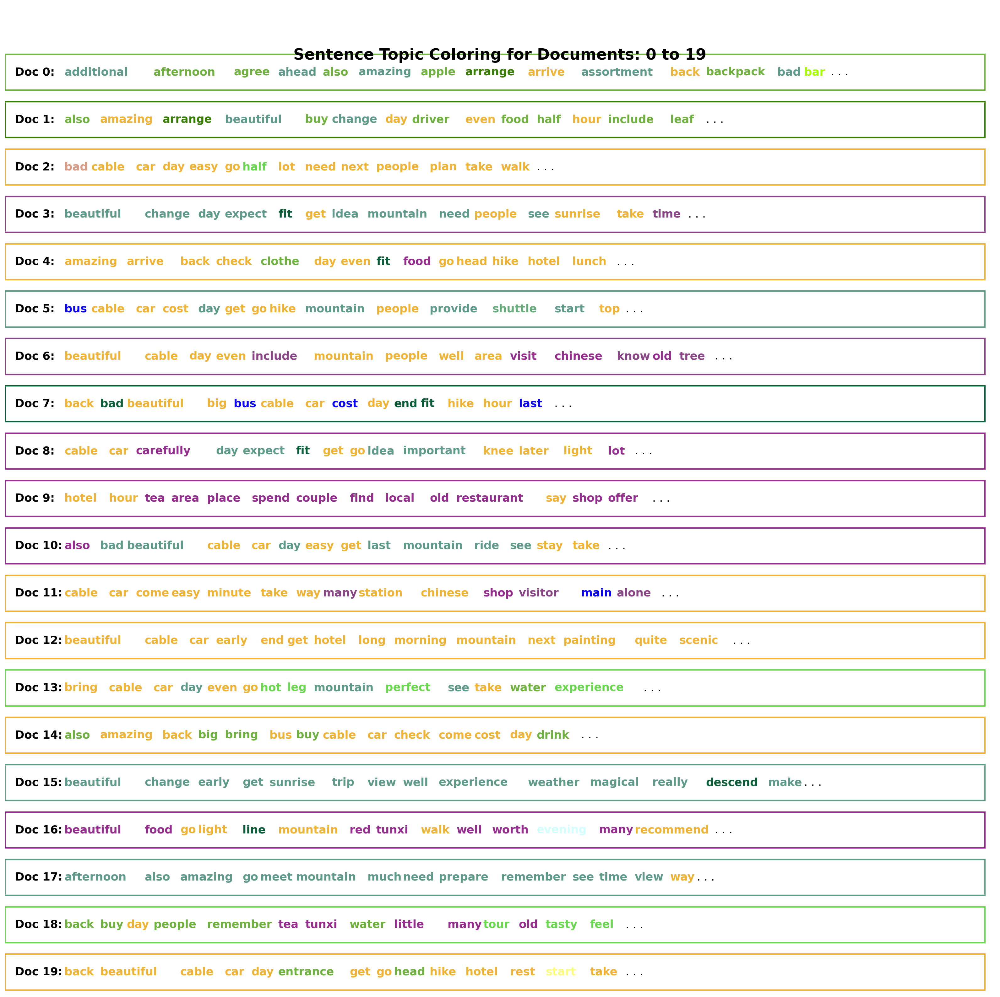

In [ ]:
# Sentence Coloring of N Sentences
from matplotlib.patches import Rectangle

def sentences_chart(lda_model=lda_model, corpus=corpus, start = 0, end = 21):
    corp = corpus[start:end]
    mycolors = [color for name, color in mcolors.XKCD_COLORS.items()]
    ##cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'
    ##cols = [color for name, color in mcolors.XKCD_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS

    fig, axes = plt.subplots(end-start, 1, figsize=(20, (end-start)*0.95), dpi=160)       
    axes[0].axis('off')
    for i, ax in enumerate(axes):
        if i > 0:
            corp_cur = corp[i-1] 
            topic_percs, wordid_topics, wordid_phivalues = lda_model[corp_cur]
            word_dominanttopic = [(lda_model.id2word[wd], topic[0]) for wd, topic in wordid_topics]    
            ax.text(0.01, 0.5, "Doc " + str(i-1) + ": ", verticalalignment='center',
                    fontsize=16, color='black', transform=ax.transAxes, fontweight=700)

            # Draw Rectange
            topic_percs_sorted = sorted(topic_percs, key=lambda x: (x[1]), reverse=True)
            ax.add_patch(Rectangle((0.0, 0.05), 0.99, 0.90, fill=None, alpha=1, 
                                   color=mycolors[topic_percs_sorted[0][0]], linewidth=2))

            word_pos = 0.06
            for j, (word, topics) in enumerate(word_dominanttopic):
                if j < 14:
                    ax.text(word_pos, 0.5, word,
                            horizontalalignment='left',
                            verticalalignment='center',
                            fontsize=16, color=mycolors[topics],
                            transform=ax.transAxes, fontweight=700)
                    word_pos += .009 * len(word)  # to move the word for the next iter
                    ax.axis('off')
            ax.text(word_pos, 0.5, '. . .',
                    horizontalalignment='left',
                    verticalalignment='center',
                    fontsize=16, color='black',
                    transform=ax.transAxes)       

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.suptitle('Sentence Topic Coloring for Documents: ' + str(start) + ' to ' + str(end-2), fontsize=22, y=0.95, fontweight=700)
    plt.tight_layout()
    plt.show()

sentences_chart()

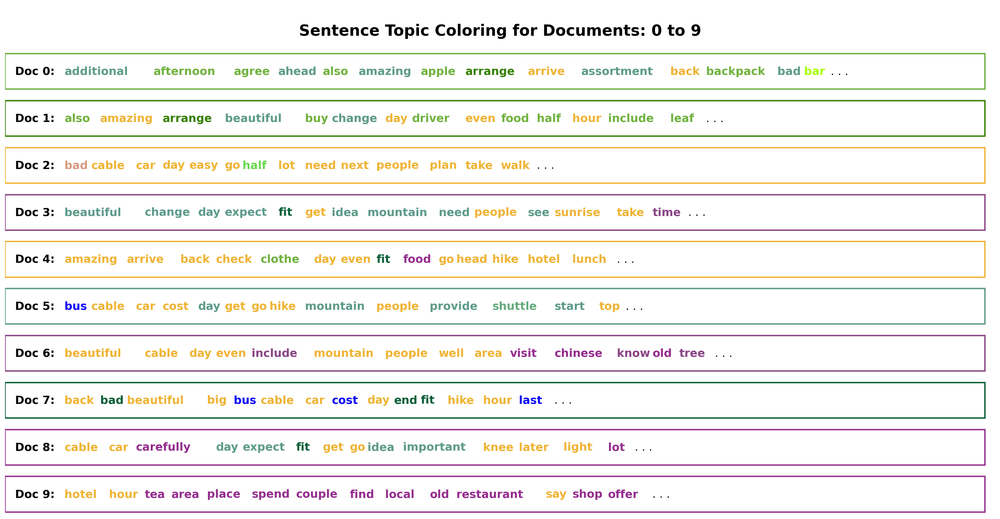

In [ ]:
# Sentence Coloring of N Sentences
from matplotlib.patches import Rectangle

def sentences_chart(lda_model=lda_model, corpus=corpus, start = 0, end = 11):
    corp = corpus[start:end]
    mycolors = [color for name, color in mcolors.XKCD_COLORS.items()]
    ##cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'
    ##cols = [color for name, color in mcolors.XKCD_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS

    fig, axes = plt.subplots(end-start, 1, figsize=(20, (end-start)*0.95), dpi=160)       
    axes[0].axis('off')
    for i, ax in enumerate(axes):
        if i > 0:
            corp_cur = corp[i-1] 
            topic_percs, wordid_topics, wordid_phivalues = lda_model[corp_cur]
            word_dominanttopic = [(lda_model.id2word[wd], topic[0]) for wd, topic in wordid_topics]    
            ax.text(0.01, 0.5, "Doc " + str(i-1) + ": ", verticalalignment='center',
                    fontsize=16, color='black', transform=ax.transAxes, fontweight=700)

            # Draw Rectange
            topic_percs_sorted = sorted(topic_percs, key=lambda x: (x[1]), reverse=True)
            ax.add_patch(Rectangle((0.0, 0.05), 0.99, 0.90, fill=None, alpha=1, 
                                   color=mycolors[topic_percs_sorted[0][0]], linewidth=2))

            word_pos = 0.06
            for j, (word, topics) in enumerate(word_dominanttopic):
                if j < 14:
                    ax.text(word_pos, 0.5, word,
                            horizontalalignment='left',
                            verticalalignment='center',
                            fontsize=16, color=mycolors[topics],
                            transform=ax.transAxes, fontweight=700)
                    word_pos += .009 * len(word)  # to move the word for the next iter
                    ax.axis('off')
            ax.text(word_pos, 0.5, '. . .',
                    horizontalalignment='left',
                    verticalalignment='center',
                    fontsize=16, color='black',
                    transform=ax.transAxes)       

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.suptitle('Sentence Topic Coloring for Documents: ' + str(start) + ' to ' + str(end-2), fontsize=22, y=0.95, fontweight=700)
    plt.tight_layout()
    plt.show()

sentences_chart()

In [ ]:
# Sentence Coloring of N Sentences
def topics_per_document(model, corpus, start=1, end=21):
    corpus_sel = corpus[start:end]
    dominant_topics = []
    topic_percentages = []
    for i, corp in enumerate(corpus_sel):
        topic_percs, wordid_topics, wordid_phivalues = model[corp]
        dominant_topic = sorted(topic_percs, key = lambda x: x[1], reverse=True)[0][0]
        dominant_topics.append((i, dominant_topic))
        topic_percentages.append(topic_percs)
    return(dominant_topics, topic_percentages)

dominant_topics, topic_percentages = topics_per_document(model=lda_model, corpus=corpus, end=-1)            

# Distribution of Dominant Topics in Each Document
df = pd.DataFrame(dominant_topics, columns=['Document_Id', 'Dominant_Topic'])
dominant_topic_in_each_doc = df.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc = dominant_topic_in_each_doc.to_frame(name='count').reset_index()

# Total Topic Distribution by actual weight
topic_weightage_by_doc = pd.DataFrame([dict(t) for t in topic_percentages])
df_topic_weightage_by_doc = topic_weightage_by_doc.sum().to_frame(name='count').reset_index()

# Top 3 Keywords for each Topic
topic_top3words = [(i, topic) for i, topics in lda_model.show_topics(formatted=False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked = pd.DataFrame(topic_top3words, columns=['topic_id', 'words'])
df_top3words = df_top3words_stacked.groupby('topic_id').agg(', \n'.join)
df_top3words.reset_index(level=0,inplace=True)


from matplotlib.ticker import FuncFormatter

# Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), dpi=120, sharey=True)

# Topic Distribution by Dominant Topics
ax1.bar(x='Dominant_Topic', height='count', data=df_dominant_topic_in_each_doc, width=.5, color='firebrick')
ax1.set_xticks(range(df_dominant_topic_in_each_doc.Dominant_Topic.unique().__len__()))
tick_formatter = FuncFormatter(lambda x, pos: 'Topic ' + str(x)+ '\n' + df_top3words.loc[df_top3words.topic_id==x, 'words'].values[0])
ax1.xaxis.set_major_formatter(tick_formatter)
ax1.set_title('Number of Documents by Dominant Topic', fontdict=dict(size=10))
ax1.set_ylabel('Number of Documents')
ax1.set_ylim(0, 1000)

# Topic Distribution by Topic Weights
ax2.bar(x='index', height='count', data=df_topic_weightage_by_doc, width=.5, color='steelblue')
ax2.set_xticks(range(df_topic_weightage_by_doc.index.unique().__len__()))
ax2.xaxis.set_major_formatter(tick_formatter)
ax2.set_title('Number of Documents by Topic Weightage', fontdict=dict(size=10))

plt.show()

In [ ]:
# Sentence Coloring of N Sentences
def topics_per_document(model, corpus, start=1, end=21):
    corpus_sel = corpus[start:end]
    dominant_topics = []
    topic_percentages = []
    for i, corp in enumerate(corpus_sel):
        topic_percs, wordid_topics, wordid_phivalues = model[corp]
        dominant_topic = sorted(topic_percs, key = lambda x: x[1], reverse=True)[0][0]
        dominant_topics.append((i, dominant_topic))
        topic_percentages.append(topic_percs)
    return(dominant_topics, topic_percentages)

dominant_topics, topic_percentages = topics_per_document(model=lda_model, corpus=corpus, end=-1)            


In [ ]:
# Distribution of Dominant Topics in Each Document
df = pd.DataFrame(dominant_topics, columns=['Document_Id', 'Dominant_Topic'])
dominant_topic_in_each_doc = df.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc = dominant_topic_in_each_doc.to_frame(name='count').reset_index()

# Total Topic Distribution by actual weight
topic_weightage_by_doc = pd.DataFrame([dict(t) for t in topic_percentages])
df_topic_weightage_by_doc = topic_weightage_by_doc.sum().to_frame(name='count').reset_index()

# Top 3 Keywords for each Topic
topic_top3words = [(i, topic) for i, topics in lda_model.show_topics(formatted=False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked = pd.DataFrame(topic_top3words, columns=['topic_id', 'words'])
df_top3words = df_top3words_stacked.groupby('topic_id').agg(', \n'.join)
df_top3words.reset_index(level=0,inplace=True)


In [ ]:
from matplotlib.ticker import FuncFormatter

# Plot
# NULL ERROR
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), dpi=120, sharey=True)

# Topic Distribution by Dominant Topics
ax1.bar(x='Dominant_Topic', height='count', data=df_dominant_topic_in_each_doc, width=.5, color='firebrick')
ax1.set_xticks(range(df_dominant_topic_in_each_doc.Dominant_Topic.unique().__len__()))
tick_formatter = FuncFormatter(lambda x, pos: 'Topic ' + str(x)+ '\n' + df_top3words.loc[df_top3words.topic_id==x, 'words'].values[0])
ax1.xaxis.set_major_formatter(tick_formatter)
ax1.set_title('Number of Documents by Dominant Topic', fontdict=dict(size=10))
ax1.set_ylabel('Number of Documents')
ax1.set_ylim(0, 1000)

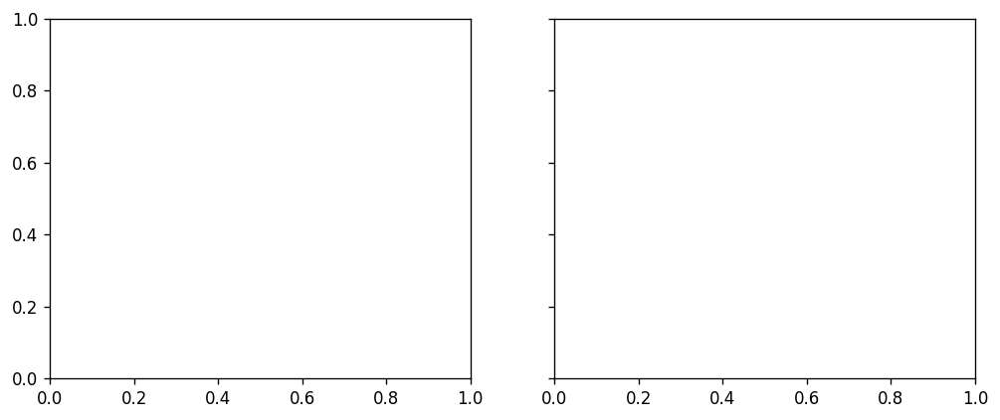

In [ ]:
from matplotlib.ticker import FuncFormatter

# Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), dpi=120, sharey=True)


In [ ]:
# Topic Distribution by Dominant Topics
ax1.bar(x='Dominant_Topic', height='count', data=df_dominant_topic_in_each_doc, width=.5, color='firebrick')


<BarContainer object of 20 artists>

In [ ]:
ax1.set_xticks(range(df_dominant_topic_in_each_doc.Dominant_Topic.unique().__len__()))


In [ ]:
tick_formatter = FuncFormatter(lambda x, pos: 'Topic ' + str(x)+ '\n' + df_top3words.loc[df_top3words.topic_id==x, 'words'].values[0])


In [ ]:
ax1.xaxis.set_major_formatter(tick_formatter)


In [ ]:
ax1.set_title('Number of Documents by Dominant Topic', fontdict=dict(size=10))


Text(0.5, 1.0, 'Number of Documents by Dominant Topic')

In [ ]:
ax1.set_ylabel('Number of Documents')


Text(5.333333333333326, 0.5, 'Number of Documents')

In [ ]:
ax1.set_ylabel('Number of Documents')
ax1.set_ylim(0, 1000)

(0.0, 1000.0)

In [ ]:
# Topic Distribution by Topic Weights
ax2.bar(x='index', height='count', data=df_topic_weightage_by_doc, width=.5, color='steelblue')
ax2.set_xticks(range(df_topic_weightage_by_doc.index.unique().__len__()))
ax2.xaxis.set_major_formatter(tick_formatter)
ax2.set_title('Number of Documents by Topic Weightage', fontdict=dict(size=10))

plt.show()

In [ ]:
# Get topic weights and dominant topics ------------
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook

# Get topic weights
topic_weights = []
for i, row_list in enumerate(lda_model[corpus]):
    topic_weights.append([w for i, w in row_list[0]])

# Array of topic weights    
arr = pd.DataFrame(topic_weights).fillna(0).values

# Keep the well separated points (optional)
arr = arr[np.amax(arr, axis=1) > 0.35]

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, angle=.99, init='pca')
tsne_lda = tsne_model.fit_transform(arr)

# Plot the Topic Clusters using Bokeh
output_notebook()
n_topics = 20
mycolors = np.array([color for name, color in mcolors.XKCD_COLORS.items()])

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])
show(plot)

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1053 samples in 0.001s...
[t-SNE] Computed neighbors for 1053 samples in 0.059s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1053
[t-SNE] Computed conditional probabilities for sample 1053 / 1053
[t-SNE] Mean sigma: 0.100399
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.341141
[t-SNE] KL divergence after 1000 iterations: 0.392227


In [ ]:
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_model, corpus, id2word)
vis


/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
15     0.391765  0.093217       1        1  40.033330
14     0.317926 -0.010555       2        1  12.365059
9      0.195691 -0.220439       3        1   6.217072
6      0.165993  0.246237       4        1   5.548031
3     -0.057901  0.092882       5        1   4.498944
5      0.040386 -0.128328       6        1   3.016177
4      0.019594 -0.164242       7        1   2.959058
17    -0.008745  0.070408       8        1   2.935641
16     0.007856 -0.159830       9        1   2.759330
18    -0.065508  0.005448      10        1   2.443415
8     -0.068615  0.098845      11        1   2.201651
13    -0.101851  0.015700      12        1   2.102673
10    -0.101030  0.020800      13        1   1.895455
2     -0.103185  0.002005      14        1   1.771177
12    -0.096420 -0.001849      15        1   1.733154
19    -0.096027  0.013052      16        1   1.700855
1     -0.101401  0.011133      17        1   1.669087
11    -0.120679  0.020873      18        1   1.525021
7     -0.101295 -0.006788      19        1   1.449782
0     -0.116556  0.001431      20        1   1.175086, topic_info=              Term         Freq        Total Category  logprob  loglift
24             bus   566.000000   566.000000  Default  30.0000  30.0000
98        mountain  1980.000000  1980.000000  Default  29.0000  29.0000
268          place   577.000000   577.000000  Default  28.0000  28.0000
153           take  1356.000000  1356.000000  Default  27.0000  27.0000
27             car  1257.000000  1257.000000  Default  26.0000  26.0000
...            ...          ...          ...      ...      ...      ...
4468         haunt     5.221932     6.170257  Topic20  -5.3003   4.2770
3043     primarily     5.532277     6.541216  Topic20  -5.2426   4.2763
621     especially    22.686399   115.410715  Topic20  -3.8314   2.8171
5912      tracking     8.823450    26.537374  Topic20  -4.7758   3.3427
781   grand_canyon     8.187476    39.168008  Topic20  -4.8506   2.8786

[805 rows x 6 columns], token_table=      Topic      Freq          Term
term                               
5865      3  0.040780         aaron
5865      7  0.774824         aaron
5865     10  0.040780         aaron
5865     11  0.040780         aaron
5865     16  0.040780         aaron
...     ...       ...           ...
601       7  0.939865          yuan
899      14  0.974579         yungu
1379     10  0.924119  yungu_temple
560       6  0.967587          yupe
561       6  0.974905        yuping

[896 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[16, 15, 10, 7, 4, 6, 5, 18, 17, 19, 9, 14, 11, 3, 13, 20, 2, 12, 8, 1])

/usr/local/lib/python3.8/dist-packages/gensim/topic_coherence/direct_confirmation_measure.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  m_lr_i = np.log(numerator / denominator)
/usr/local/lib/python3.8/dist-packages/gensim/topic_coherence/indirect_confirmation_measure.py:317: RuntimeWarning: invalid value encountered in double_scalars
  return cv1.T.dot(cv2)[0, 0] / (_magnitude(cv1) * _magnitude(cv2))


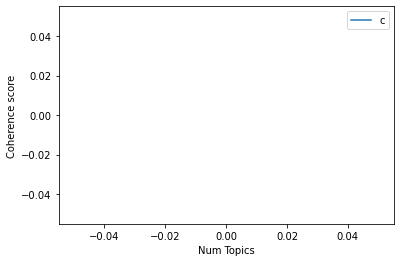

Num Topics = 5  has Coherence Value of nan
Num Topics = 6  has Coherence Value of nan
Num Topics = 7  has Coherence Value of nan
Num Topics = 8  has Coherence Value of nan
Num Topics = 9  has Coherence Value of nan
Num Topics = 10  has Coherence Value of nan
Num Topics = 11  has Coherence Value of nan
Num Topics = 12  has Coherence Value of nan
Num Topics = 13  has Coherence Value of nan
Num Topics = 14  has Coherence Value of nan
Num Topics = 15  has Coherence Value of nan
Num Topics = 16  has Coherence Value of nan
Num Topics = 17  has Coherence Value of nan
Num Topics = 18  has Coherence Value of nan
Num Topics = 19  has Coherence Value of nan
Num Topics = 20  has Coherence Value of nan
Num Topics = 21  has Coherence Value of nan
Num Topics = 22  has Coherence Value of nan
Num Topics = 23  has Coherence Value of nan
Num Topics = 24  has Coherence Value of nan
Num Topics = 25  has Coherence Value of nan
Num Topics = 26  has Coherence Value of nan
Num Topics = 27  has Coherence Value 

In [ ]:




# Plotting tools
import pyLDAvis
import pyLDAvis.gensim_models  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)



# Converting list of documents (corpus) into Document Term Matrix using the dictionary
doc_term_matrix = [id2word.doc2bow(i) for i in clean_corpus]
doc_term_matrix

'''
nltk.download('punkt')
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
## stop_words.extend(['for', 'and', 'to', 'the', 'you', 'not', 'from', 'subject', 're', 'edu', 'use'])

from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.tokenize import word_tokenize


def flattern(doc):

    # split into words
    split_into_words = " ".join([i for i in doc.split() if not i.isdigit()])
    ## split_into_words = " ".join([i for i in doc.split()])
    
    return split_into_words

# Saving data in a new list
texts = [flattern(doc).split() for doc in corpus_text] 

##
##def remove_stopwords(texts):
  ##for text in texts:
    ##return [word for word in simple_preprocess(str(text)) if word not in stop_words] 
##

## text = "Nick likes to play football, however he is not too fond of tennis."
for text in texts:
  text_tokens = word_tokenize(str(text))
  text = [word for word in text_tokens if not word in stop_words]
  ## text = [word for word in text_tokens if not word in stopwords.words()]

  ## print(text)

##for doc in corpus_text:
## texts = remove_stopwords(texts)
## corpus = remove_stopwords(list(texts))

# Create Dictionary
id2word = corpora.Dictionary(texts)
## id2word.filter_extremes(no_below=15, no_above=0.4, keep_n=80000)

# Term Document Frequency
# https://radimrehurek.com/gensim/auto_examples/core/run_corpora_and_vector_spaces.html

corpus = [id2word.doc2bow(text) for text in texts]

##corpus = [TaggedDocument(simple_preprocess(text), [i])
                  ##for i, text in enumerate(texts)]

#### apply(lambda x: gensim.parsing.preprocessing.remove_stopwords(" ".join(x)))

'''

def compute_coherence_values(dictionary, corpus, texts, limit, start, step):

    coherence_values = []
    model_list = []

    for num_topics in range(start, limit, step):

        ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, 
                                                 corpus=corpus, 
                                                 num_topics=num_topics, 
                                                 ## alpha=1/num_topics,
                                                 alpha=50/num_topics,
                                                 id2word=id2word, 
                                                 workers=40,
                                                 optimize_interval=4,
                                                 iterations=500) 
                                                 ##iterations=1500)   
        
        model = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(ldamallet)
        model_list.append(model)   

        
         
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        ## coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='u_mass')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=texts, start=5, limit=30, step=1)



import csv  

with open('/content/lda_cv.csv', 'w', encoding='UTF8') as f:
    writer = csv.writer(f)

    header = ['K', 'CV']
    writer.writerow(header)

    limit=30; start=5; step=1;

    x = range(start, limit, step)
    # Show graph

    plt.plot(x, coherence_values)
    plt.xlabel("Num Topics")
    plt.ylabel("Coherence score")
    plt.legend(("coherence_values"), loc='best')
    plt.show()


    for m, cv in zip(x, coherence_values):
        print("Num Topics =", m, " has Coherence Value of", round(cv, 4))
        data = [m, round(cv, 4)]
        writer.writerow(data)

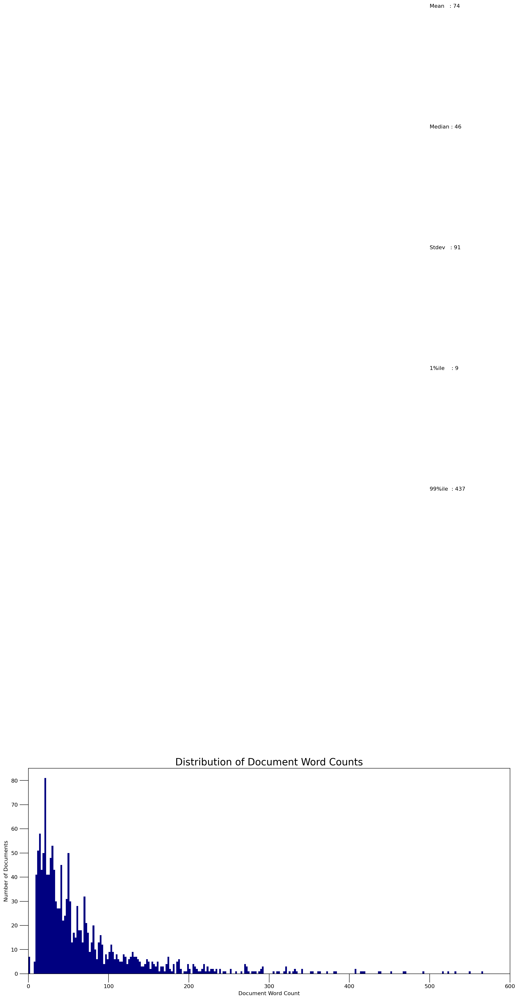

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
10    -0.000383  0.000739       1        1  36.009399
0     -0.000877  0.000516       2        1  20.984260
1      0.000483 -0.000016       3        1  16.662400
9     -0.000160  0.000305       4        1   5.897449
5     -0.000112 -0.000495       5        1   5.442821
3     -0.000017 -0.000308       6        1   4.605915
6      0.000034 -0.000464       7        1   2.435798
2      0.000068  0.000232       8        1   2.430821
4      0.000428  0.000158       9        1   2.130864
8     -0.000443 -0.000926      10        1   2.023412
7      0.000978  0.000259      11        1   1.376860, topic_info=              Term       Freq      Total Category  logprob  loglift
2021        medium  15.000000  15.000000  Default  30.0000  30.0000
5283     andaircon  16.000000  16.000000  Default  29.0000  29.0000
5400  entertaining  16.000000  16.000000  Default  28.0000  28.0000
1331      somewhat  16.000000  16.000000  Default  27.0000  27.0000
2975       unclean  15.000000  15.000000  Default  26.0000  26.0000
...            ...        ...        ...      ...      ...      ...
589   manipulation   0.260742  14.861419  Topic11  -8.4559   0.2424
5553        shaobe   0.264649  15.815194  Topic11  -8.4410   0.1950
2171          fork   0.261504  15.406258  Topic11  -8.4530   0.2093
3800        pastry   0.261194  15.251785  Topic11  -8.4542   0.2182
72            knee   0.261017  15.865841  Topic11  -8.4548   0.1780

[539 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
788       1  0.331515  actively
788       2  0.265212  actively
788       3  0.198909  actively
788       4  0.066303  actively
788       5  0.066303  actively
...     ...       ...       ...
4459      2  0.189712       zip
4459      3  0.189712       zip
4459      4  0.063237       zip
4459      5  0.063237       zip
4459      6  0.063237       zip

[3028 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[11, 1, 2, 10, 6, 4, 7, 3, 5, 9, 8])

In [ ]:


# Plotting tools
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()



# Select the model and print the topics
optimal_model = model_list[6]


# Finding the dominant topic in each document 

def format_topics_sentences(ldamodel=optimal_model, corpus=corpus, texts=texts):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        
        # Get the Dominant topic, Percentage Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic, 4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    names = pd.Series(doc_names)

    sent_topics_df = pd.concat([sent_topics_df, contents, names], axis=1)
    ## sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=optimal_model, corpus=corpus, texts=texts)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
## df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Contrib', 'Keywords']
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Contrib', 'Keywords', 'Text', 'Name']

# Display
df_dominant_topic.head(20)

doc_lens = [len(d) for d in df_dominant_topic.Text]

# Plot
plt.figure(figsize=(16,7), dpi=160)
plt.hist(doc_lens, bins = 600, color='navy')
plt.text(500, 400, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(500, 350, "Median : " + str(round(np.median(doc_lens))))
plt.text(500, 300, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(500, 250, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(500, 200, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))

plt.gca().set(xlim=(0, 600), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,600,7))
plt.title('Distribution of Document Word Counts', fontdict=dict(size=18))
plt.show()


# Visualize the topics
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(optimal_model, corpus, id2word)
vis


In [ ]:
print(df.shape)

NameError: ignored

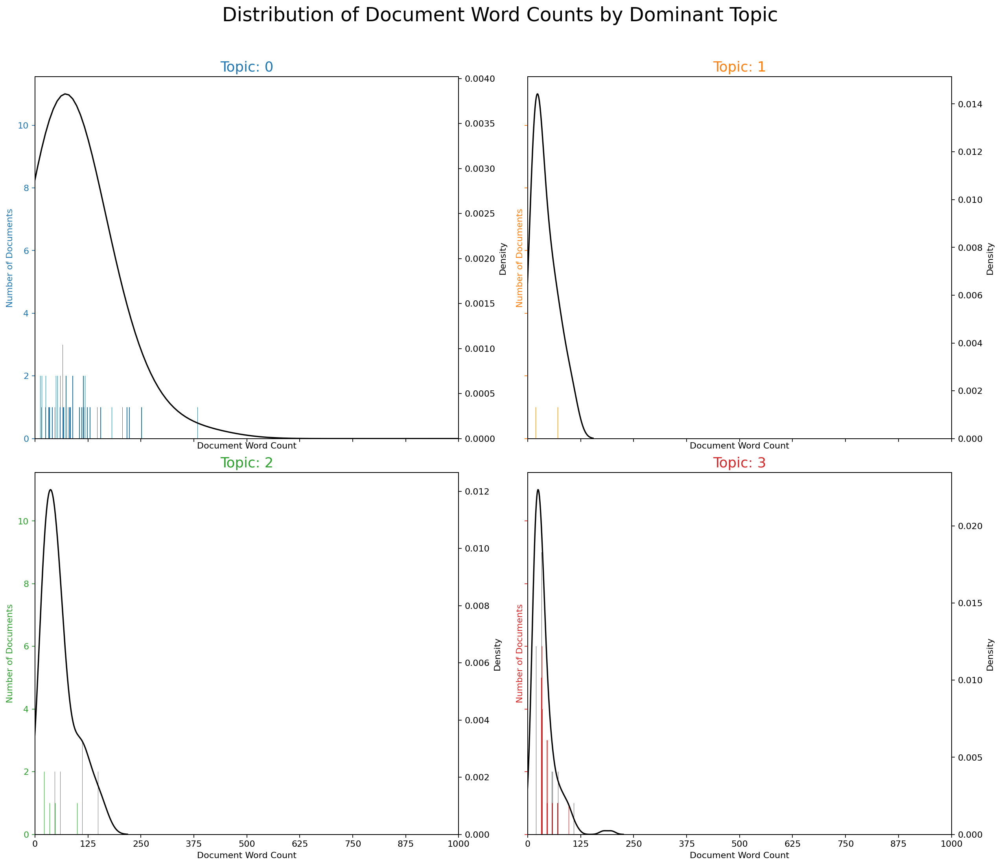

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


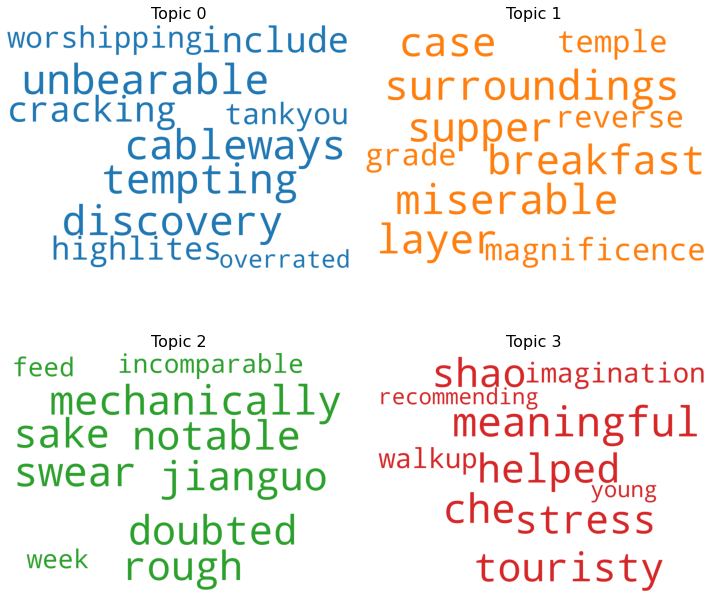

In [ ]:
import seaborn as sns
import matplotlib.colors as mcolors
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

fig, axes = plt.subplots(2,2,figsize=(16,14), dpi=160, sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):    
    df_dominant_topic_sub = df_dominant_topic.loc[df_dominant_topic.Dominant_Topic == i, :]
    doc_lens = [len(d) for d in df_dominant_topic_sub.Text]
    ax.hist(doc_lens, bins = 1000, color=cols[i])
    ax.tick_params(axis='y', labelcolor=cols[i], color=cols[i])
    sns.kdeplot(doc_lens, color="black", shade=False, ax=ax.twinx())
    ax.set(xlim=(0, 1000), xlabel='Document Word Count')
    ax.set_ylabel('Number of Documents', color=cols[i])
    ax.set_title('Topic: '+str(i), fontdict=dict(size=16, color=cols[i]))

fig.tight_layout()
fig.subplots_adjust(top=0.90)
plt.xticks(np.linspace(0,1000,9))
fig.suptitle('Distribution of Document Word Counts by Dominant Topic', fontsize=22)
plt.show()

# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors
import nltk
nltk.download('punkt')
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = optimal_model.show_topics(formatted=False)

fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

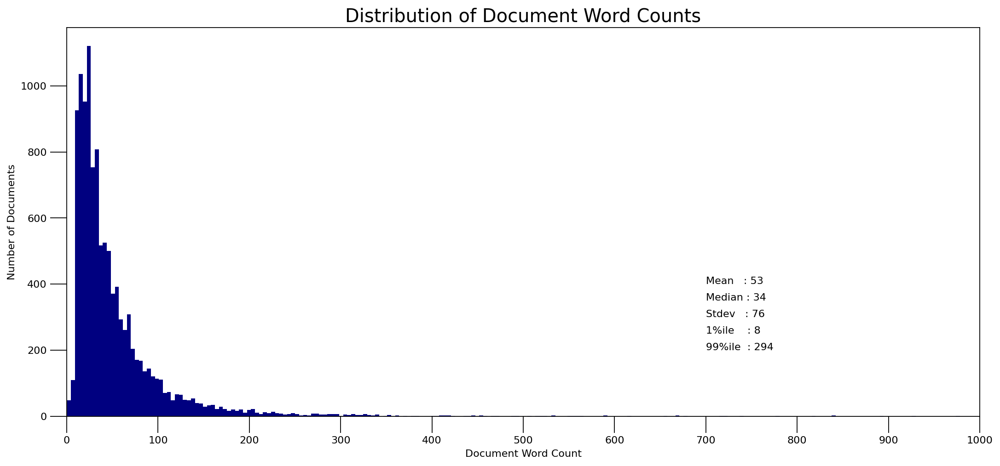

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x             y  topics  cluster       Freq
topic                                                    
1     -0.000342  1.893269e-05       1        1  25.351977
2     -0.000114  5.908157e-04       2        1  15.239781
3      0.000079  2.625780e-05       3        1  14.535029
0     -0.000440  5.315694e-06       4        1  12.454172
8      0.000813 -5.612022e-07       5        1   9.441735
10     0.000895 -6.367755e-04       6        1   5.978421
6     -0.000441 -6.092325e-04       7        1   4.320621
9     -0.000298 -2.745909e-04       8        1   4.174067
4     -0.000465 -3.730311e-04       9        1   3.434634
7      0.000284  3.303005e-04      10        1   3.355337
5      0.000028  9.225687e-04      11        1   1.714226, topic_info=               Term       Freq      Total Category  logprob  loglift
14966      trickier  34.000000  34.000000  Default  30.0000  30.0000
16045      cascaded  34.000000  34.000000  Default  29.0000  29.0000
15615          prmd  35.000000  35.000000  Default  28.0000  28.0000
4385        buiding  32.000000  32.000000  Default  27.0000  27.0000
8250         tennis  33.000000  33.000000  Default  26.0000  26.0000
...             ...        ...        ...      ...      ...      ...
15272  huangshanbei   0.783515  36.889095  Topic11  -9.4721   0.2143
15050    sculptured   0.780273  37.088980  Topic11  -9.4763   0.2048
1097     frightened   0.764453  35.040829  Topic11  -9.4968   0.2411
16189          woma   0.769171  37.308886  Topic11  -9.4906   0.1845
2463     deshengmen   0.762873  34.796615  Topic11  -9.4988   0.2460

[541 rows x 6 columns], token_table=       Topic      Freq         Term
term                               
13165      1  0.244156     absorbed
13165      2  0.183117     absorbed
13165      3  0.122078     absorbed
13165      4  0.091559     absorbed
13165      5  0.091559     absorbed
...      ...       ...          ...
10240      7  0.057699  zithromycin
10240      8  0.028850  zithromycin
10240      9  0.028850  zithromycin
10240     10  0.028850  zithromycin
10240     11  0.028850  zithromycin

[5739 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 3, 4, 1, 9, 11, 7, 10, 5, 8, 6])

In [ ]:


# Plotting tools
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()



# Select the model and print the topics
optimal_model = model_list[6]


# Finding the dominant topic in each document 

def format_topics_sentences(ldamodel=optimal_model, corpus=corpus, texts=texts):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        
        # Get the Dominant topic, Percentage Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic, 4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    names = pd.Series(doc_names)

    sent_topics_df = pd.concat([sent_topics_df, contents, names], axis=1)
    ## sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=optimal_model, corpus=corpus, texts=texts)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
## df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Contrib', 'Keywords']
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Contrib', 'Keywords', 'Text', 'Name']

# Display
df_dominant_topic.head(20)

doc_lens = [len(d) for d in df_dominant_topic.Text]

# Plot
plt.figure(figsize=(16,7), dpi=160)
plt.hist(doc_lens, bins = 600, color='navy')
plt.text(500, 400, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(500, 350, "Median : " + str(round(np.median(doc_lens))))
plt.text(500, 300, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(500, 250, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(500, 200, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))

plt.gca().set(xlim=(0, 600), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,600,7))
plt.title('Distribution of Document Word Counts', fontdict=dict(size=18))
plt.show()


# Visualize the topics
#pyLDAvis.enable_notebook()
vis = gensimvis.prepare(optimal_model, corpus, id2word)
vis


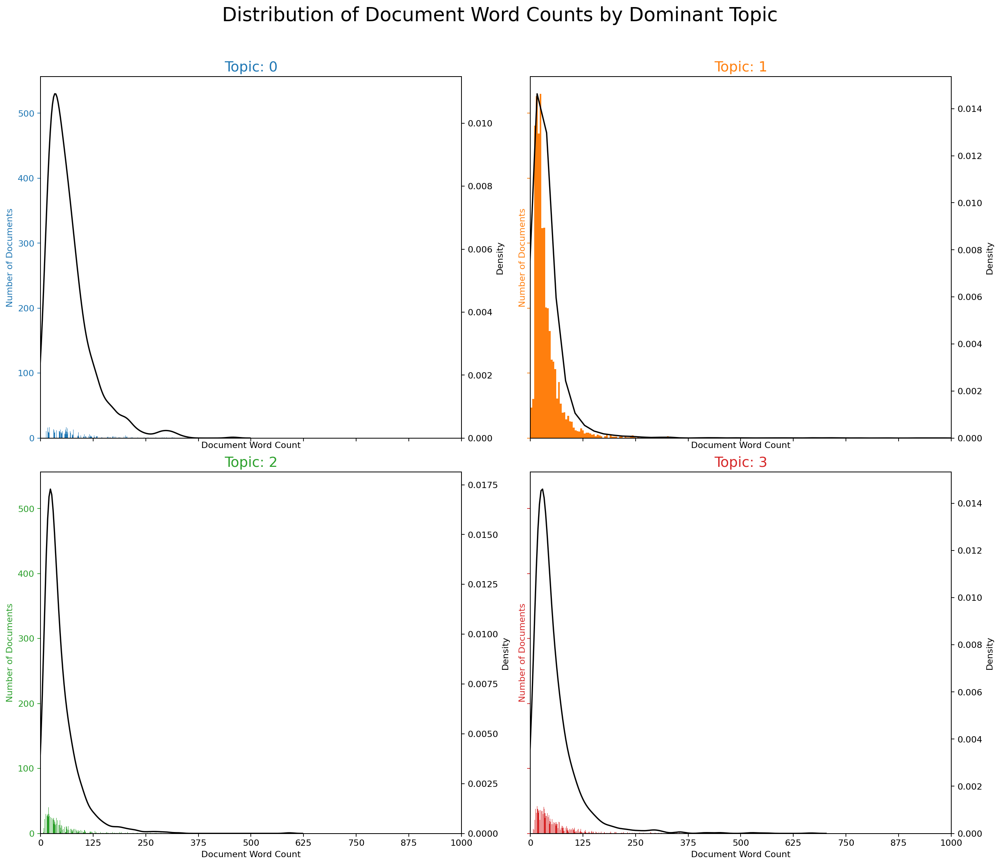

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


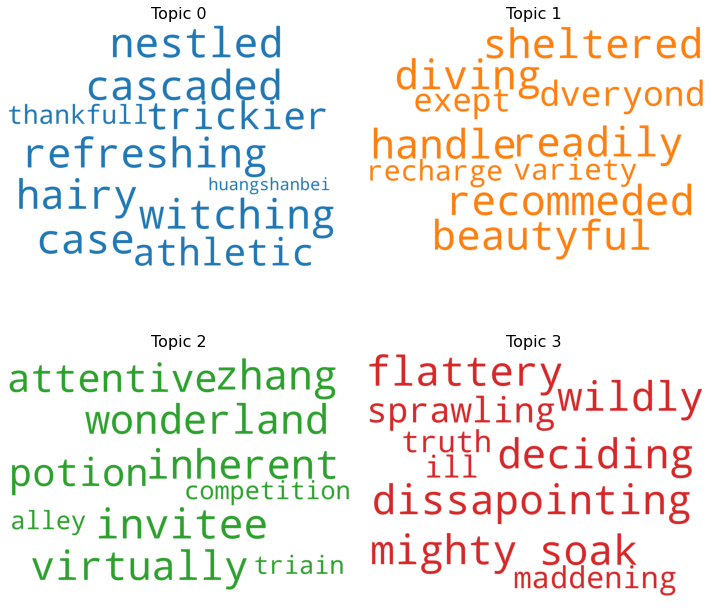

In [ ]:
import seaborn as sns
import matplotlib.colors as mcolors
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

fig, axes = plt.subplots(2,2,figsize=(16,14), dpi=160, sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):    
    df_dominant_topic_sub = df_dominant_topic.loc[df_dominant_topic.Dominant_Topic == i, :]
    doc_lens = [len(d) for d in df_dominant_topic_sub.Text]
    ax.hist(doc_lens, bins = 1000, color=cols[i])
    ax.tick_params(axis='y', labelcolor=cols[i], color=cols[i])
    sns.kdeplot(doc_lens, color="black", shade=False, ax=ax.twinx())
    ax.set(xlim=(0, 1000), xlabel='Document Word Count')
    ax.set_ylabel('Number of Documents', color=cols[i])
    ax.set_title('Topic: '+str(i), fontdict=dict(size=16, color=cols[i]))

fig.tight_layout()
fig.subplots_adjust(top=0.90)
plt.xticks(np.linspace(0,1000,9))
fig.suptitle('Distribution of Document Word Counts by Dominant Topic', fontsize=22)
plt.show()

# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors
import nltk
nltk.download('punkt')
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = optimal_model.show_topics(formatted=False)

fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

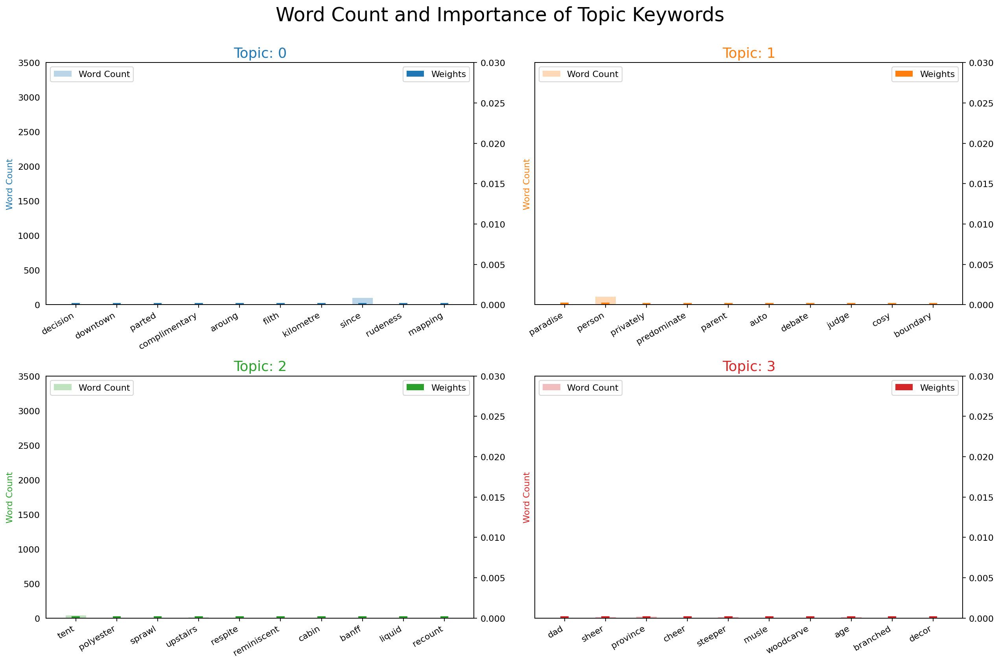

TypeError: ignored

In [ ]:
from collections import Counter
topics = optimal_model.show_topics(formatted=False)
data_flat = [w for w_list in texts for w in w_list]
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(2, 2, figsize=(16,10), sharey=True, dpi=160)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 3500)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=22, y=1.05)    
plt.show()

'''
# Sentence Coloring of N Sentences
from matplotlib.patches import Rectangle

def sentences_chart(lda_model=optimal_model, corpus=corpus, start = 0, end = 13):
    corp = corpus[start:end]
    mycolors = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    fig, axes = plt.subplots(end-start, 1, figsize=(20, (end-start)*0.95), dpi=160)       
    axes[0].axis('off')
    for i, ax in enumerate(axes):
        if i > 0:
            corp_cur = corp[i-1] 
            topic_percs, wordid_topics, wordid_phivalues = optimal_model[corp_cur]
            word_dominanttopic = [(optimal_model.id2word[wd], topic[0]) for wd, topic in wordid_topics]    
            ax.text(0.01, 0.5, "Doc " + str(i-1) + ": ", verticalalignment='center',
                    fontsize=16, color='black', transform=ax.transAxes, fontweight=700)

            # Draw Rectange
            topic_percs_sorted = sorted(topic_percs, key=lambda x: (x[1]), reverse=True)
            ax.add_patch(Rectangle((0.0, 0.05), 0.99, 0.90, fill=None, alpha=1, 
                                   color=mycolors[topic_percs_sorted[0][0]], linewidth=2))

            word_pos = 0.06
            for j, (word, topics) in enumerate(word_dominanttopic):
                if j < 14:
                    ax.text(word_pos, 0.5, word,
                            horizontalalignment='left',
                            verticalalignment='center',
                            fontsize=16, color=mycolors[topics],
                            transform=ax.transAxes, fontweight=700)
                    word_pos += .009 * len(word)  # to move the word for the next iter
                    ax.axis('off')
            ax.text(word_pos, 0.5, '. . .',
                    horizontalalignment='left',
                    verticalalignment='center',
                    fontsize=16, color='black',
                    transform=ax.transAxes)       

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.suptitle('Sentence Topic Coloring for Documents: ' + str(start) + ' to ' + str(end-2), fontsize=22, y=0.95, fontweight=700)
    plt.tight_layout()
    plt.show()

sentences_chart()  
'''
# Get topic weights and dominant topics ------------
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook

# Get topic weights
topic_weights = []
for i, row_list in enumerate(optimal_model[corpus]):
#for i, row_list in enumerate(optimal_model[corpus]):
    topic_weights.append([w for i, w in row_list[0]])

# Array of topic weights    
arr = pd.DataFrame(topic_weights).fillna(0).values

# Keep the well separated points (optional)
arr = arr[np.amax(arr, axis=1) > 0.35]

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, angle=.99, init='pca')
tsne_lda = tsne_model.fit_transform(arr)

# Plot the Topic Clusters using Bokeh
output_notebook()
n_topics = 4
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])
show(plot)

In [ ]:

from matplotlib.ticker import FuncFormatter

# Sentence Coloring of N Sentences
def topics_per_document(model, corpus, start=0, end=1):
    corpus_sel = corpus[start:end]
    dominant_topics = []
    topic_percentages = []
    for i, corp in enumerate(corpus_sel):
        topic_percs, wordid_topics, wordid_phivalues = model[corp]
        dominant_topic = sorted(topic_percs, key = lambda x: x[1], reverse=True)[0][0]
        dominant_topics.append((i, dominant_topic))
        topic_percentages.append(topic_percs)
    return(dominant_topics, topic_percentages)

dominant_topics, topic_percentages = topics_per_document(model=optimal_model, corpus=corpus, end=-1)            

# Distribution of Dominant Topics in Each Document
df = pd.DataFrame(dominant_topics, columns=['Document_Id', 'Dominant_Topic'])
dominant_topic_in_each_doc = df.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc = dominant_topic_in_each_doc.to_frame(name='count').reset_index()

# Total Topic Distribution by actual weight
topic_weightage_by_doc = pd.DataFrame([dict(t) for t in topic_percentages])
df_topic_weightage_by_doc = topic_weightage_by_doc.sum().to_frame(name='count').reset_index()

# Top 3 Keywords for each Topic
topic_top3words = [(i, topic) for i, topics in optimal_model.show_topics(formatted=False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked = pd.DataFrame(topic_top3words, columns=['topic_id', 'words'])
df_top3words = df_top3words_stacked.groupby('topic_id').agg(', \n'.join)
df_top3words.reset_index(level=0,inplace=True)

# Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), dpi=120, sharey=True)


# Topic Distribution by Dominant Topics
ax1.bar(x='Dominant_Topic', height='count', data=df_dominant_topic_in_each_doc, width=.5, color='firebrick')
ax1.set_xticks(range(df_dominant_topic_in_each_doc.Dominant_Topic.unique().__len__()))
tick_formatter = FuncFormatter(lambda x, pos: 'Topic ' + str(x)+ '\n' + df_top3words.loc[df_top3words.topic_id==x, 'words'].values[0])
ax1.xaxis.set_major_formatter(tick_formatter)
ax1.set_title('Number of Documents by Dominant Topic', fontdict=dict(size=10))
ax1.set_ylabel('Number of Documents')
ax1.set_ylim(0, 1000)

# Topic Distribution by Topic Weights
ax2.bar(x='index', height='count', data=df_topic_weightage_by_doc, width=.5, color='steelblue')
ax2.set_xticks(range(df_topic_weightage_by_doc.index.unique().__len__()))
ax2.xaxis.set_major_formatter(tick_formatter)
ax2.set_title('Number of Documents by Topic Weightage', fontdict=dict(size=10))

plt.show()

ValueError: ignored

In [ ]:
# Get topic weights and dominant topics ------------
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook

# Get topic weights
topic_weights = []
for i, row_list in enumerate(lda_model[corpus]):
    topic_weights.append([w for i, w in row_list[0]])

# Array of topic weights    
arr = pd.DataFrame(topic_weights).fillna(0).values

# Keep the well separated points (optional)
arr = arr[np.amax(arr, axis=1) > 0.35]

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, angle=.99, init='pca')
tsne_lda = tsne_model.fit_transform(arr)

# Plot the Topic Clusters using Bokeh
output_notebook()
n_topics = 4
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])
show(plot)

TypeError: ignored

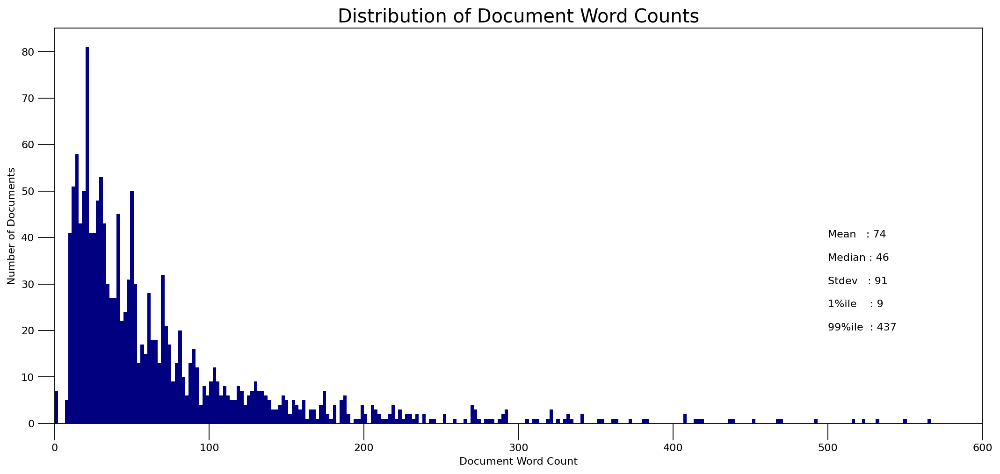

In [ ]:
# Plot
plt.figure(figsize=(16,7), dpi=160)
plt.hist(doc_lens, bins = 600, color='navy')
plt.text(500, 40, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(500, 35, "Median : " + str(round(np.median(doc_lens))))
plt.text(500, 30, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(500, 25, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(500, 20, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))

plt.gca().set(xlim=(0, 600), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,600,7))
plt.title('Distribution of Document Word Counts', fontdict=dict(size=18))
plt.show()

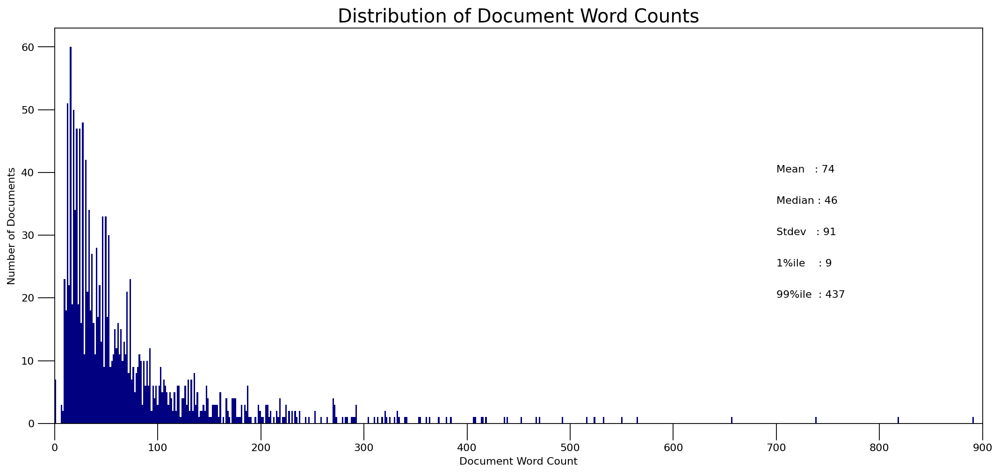

In [ ]:
# Plot
plt.figure(figsize=(16,7), dpi=160)
plt.hist(doc_lens, bins = 900, color='navy')
plt.text(700, 40, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(700, 35, "Median : " + str(round(np.median(doc_lens))))
plt.text(700, 30, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(700, 25, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(700, 20, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))

plt.gca().set(xlim=(0, 900), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,900,10))
plt.title('Distribution of Document Word Counts', fontdict=dict(size=18))
plt.show()

In [ ]:

def compute_coherence_values(dictionary, corpus, texts, limit, start, step):

    coherence_values = []
    model_list = []

    for num_topics in range(start, limit, step):

        ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, 
                                                 corpus=corpus, 
                                                 num_topics=num_topics, 
                                                 ## alpha=1/num_topics,
                                                 alpha=50/num_topics,
                                                 id2word=id2word, 
                                                 workers=40,
                                                 optimize_interval=4,
                                                 iterations=500) 
                                                 ##iterations=1500)   
        
        model = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(ldamallet)
        model_list.append(model)   

        
         
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        ## coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='u_mass')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=texts, start=5, limit=30, step=1)



import csv  

with open('/content/lda_cv.csv', 'w', encoding='UTF8') as f:
    writer = csv.writer(f)

    header = ['K', 'CV']
    writer.writerow(header)

    limit=30; start=5; step=1;

    x = range(start, limit, step)
    # Show graph

    plt.plot(x, coherence_values)
    plt.xlabel("Num Topics")
    plt.ylabel("Coherence score")
    plt.legend(("coherence_values"), loc='best')
    plt.show()


    for m, cv in zip(x, coherence_values):
        print("Num Topics =", m, " has Coherence Value of", round(cv, 4))
        data = [m, round(cv, 4)]
        writer.writerow(data)

In [ ]:
print(coherence_values[14])

0.7557361095372128


In [ ]:
imUsingColab = True

if imUsingColab:
    ##!pip install gensim
    !pip install pyLDAvis
    ##!pip install vega
    ##!pip install altair
    
import re
import spacy

from nltk.corpus import stopwords 
from nltk.stem.wordnet import WordNetLemmatizer
import string

# import numpy for matrix operation
import numpy as np


from pprint import pprint
import pandas as pd

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim_models  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
from gensim.models.wrappers import LdaMallet

## from google.colab import drive
## drive.mount('/content/drive/')

##!unzip -uq "/content/Names_207039.zip" -d "/content/"
## !unzip -uq "/content/test_names_220610" -d "/content/"
!unzip -uq "/content/mallet-2.0.8.zip" -d "/content/"  
!unzip -uq "/content/review_words.zip" -d "/content/"      

##dirpath = '/content/Names_207039/'
## dirpath = '/content/test_names/
dirpath = '/content/review_words/'
mallet_path = '/content/mallet-2.0.8/bin/mallet'

import os
## Setup mallet environment change it according to your drive
os.environ.update({'MALLET_HOME':r'/content/mallet-2.0.8'})
## Setup mallet path change it according to your drive

files = [os.path.join(dirpath, fname) for fname in os.listdir(dirpath)]
corpus_text = []

for filename in sorted(files):
    with open(filename, 'r') as f:
        corpus_text += [f.read()]




from pathlib import Path

doc_names = [Path(file).stem for file in sorted(files)]

# Apply Preprocessing on the Corpus

import nltk

nltk.download('punkt')
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
## stop_words.extend(['for', 'and', 'to', 'the', 'you', 'not', 'from', 'subject', 're', 'edu', 'use'])

from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.tokenize import word_tokenize


def flattern(doc):

    # split into words
    split_into_words = " ".join([i for i in doc.split() if not i.isdigit()])
    ## split_into_words = " ".join([i for i in doc.split()])
    
    return split_into_words

# Saving data in a new list
texts = [flattern(doc).split() for doc in corpus_text] 

'''
def remove_stopwords(texts):
  for text in texts:
    return [word for word in simple_preprocess(str(text)) if word not in stop_words] 
'''

## text = "Nick likes to play football, however he is not too fond of tennis."
for text in texts:
  text_tokens = word_tokenize(str(text))
  text = [word for word in text_tokens if not word in stop_words]
  ## text = [word for word in text_tokens if not word in stopwords.words()]

  ## print(text)

##for doc in corpus_text:
## texts = remove_stopwords(texts)
## corpus = remove_stopwords(list(texts))

# Create Dictionary
id2word = corpora.Dictionary(texts)
## id2word.filter_extremes(no_below=15, no_above=0.4, keep_n=80000)

# Term Document Frequency
# https://radimrehurek.com/gensim/auto_examples/core/run_corpora_and_vector_spaces.html

corpus = [id2word.doc2bow(text) for text in texts]

##corpus = [TaggedDocument(simple_preprocess(text), [i])
                  ##for i, text in enumerate(texts)]

#### apply(lambda x: gensim.parsing.preprocessing.remove_stopwords(" ".join(x)))

def compute_coherence_values(dictionary, corpus, texts, limit, start=5, step=5):

    coherence_values = []
    model_list = []

    for num_topics in range(start, limit, step):

        ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, 
                                                 corpus=corpus, 
                                                 num_topics=num_topics, 
                                                 ## alpha=1/num_topics,
                                                 alpha=50/num_topics,
                                                 id2word=id2word, 
                                                 workers=40,
                                                 optimize_interval=4,
                                                 iterations=500) 
                                                 ##iterations=1500)   
        
        model = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(ldamallet)
        model_list.append(model)   

        
         
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        ## coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='u_mass')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=texts, start=5, limit=30, step=1)



import csv  

with open('/content/lda_cv.csv', 'w', encoding='UTF8') as f:
    writer = csv.writer(f)

    header = ['K', 'CV']
    writer.writerow(header)

    limit=30; start=5; step=1;

    x = range(start, limit, step)
    # Show graph

    plt.plot(x, coherence_values)
    plt.xlabel("Num Topics")
    plt.ylabel("Coherence score")
    plt.legend(("coherence_values"), loc='best')
    plt.show()


    for m, cv in zip(x, coherence_values):
        print("Num Topics =", m, " has Coherence Value of", round(cv, 4))
        data = [m, round(cv, 4)]
        writer.writerow(data)

In [ ]:
# Select the model and print the topics
optimal_model = model_list[14]


# Finding the dominant topic in each document 

def format_topics_sentences(ldamodel=optimal_model, corpus=corpus, texts=texts):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        
        # Get the Dominant topic, Percentage Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic, 4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    names = pd.Series(doc_names)

    sent_topics_df = pd.concat([sent_topics_df, contents, names], axis=1)
    ## sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=optimal_model, corpus=corpus, texts=texts)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
## df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Contrib', 'Keywords']
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Contrib', 'Keywords', 'Text', 'Name']

# Display
df_dominant_topic.head(20)

,Document_No,Dominant_Topic,Topic_Contrib,Keywords,Text,Name
0,0,10.0,0.3432,"tiandu, idea, disliked, uninterrupted, shorten...","[want, pay, cable, opt, hike, mountain, rememb...",2 Days in a painting
1,1,2.0,0.3267,"backtracking, awestruck, mistake, kill, stunne...","[jane, jane, jane, couching, tiger, hidden, dr...",2 night trip to Mt. Huangshan great thanks to ...
2,2,6.0,0.3295,"campsite, pitch, shortened, wont, camellia, is...","[easy, place, visit, without, knowing, chinese...",24 hours at Mt. Huangshan
3,3,17.0,0.3721,"regardless, safety, froze, lengthy, recycling,...","[family, spent, day, huangshan, area, wonderfu...",3 days in Huangshan
4,4,2.0,0.3614,"backtracking, awestruck, mistake, kill, stunne...","[booked, private, tour, china, highlight, webs...",3-day Essence of Huangshan tour
5,5,1.0,0.2847,"red, bunk, trek, waaaaaa, throwing, stamen, pl...","[like, crowd, go, week, day, avoid, golden, we...",8 miles of Wonder!
6,6,18.0,0.2859,"confines, extravagant, zhaixi, solitude, cheap...","[cool, one, thousand, beautiful, tree, mountai...",A 'must-see' for Chinese....foreigners maybe.....
7,7,10.0,0.5624,"tiandu, idea, disliked, uninterrupted, shorten...","[t, trip, huangshan, travelled, beijing, huang...",A 5star in sunny weather
8,8,4.0,0.2675,"orderly, provision, frontage, biscuit, fading,...","[never, seen, elsewhere, misty, clear, still, ...",A 6 star experience - Pack strong legs and bra...
9,9,13.0,0.4571,"flea, yet, leisurelythan, overweight, furong, ...","[old, stree, hotel, fun, place, spend, couple,...",A Bustling Area of Shops and Restaurants


review_words/Don’t let the weather forecast discourage you!_2, 2018_.txt:  mismatching "local" filename (review_words/DonтАЩt let the weather forecast discourage you!_2, 2018_.txt),
         continuing with "central" filename version
review_words/Don’t miss it_22, 2016_.txt:  mismatching "local" filename (review_words/DonтАЩt miss it_22, 2016_.txt),
         continuing with "central" filename version


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


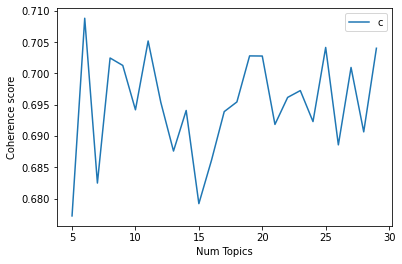

Num Topics = 5  has Coherence Value of 0.6773
Num Topics = 6  has Coherence Value of 0.7088
Num Topics = 7  has Coherence Value of 0.6825
Num Topics = 8  has Coherence Value of 0.7025
Num Topics = 9  has Coherence Value of 0.7013
Num Topics = 10  has Coherence Value of 0.6942
Num Topics = 11  has Coherence Value of 0.7052
Num Topics = 12  has Coherence Value of 0.6954
Num Topics = 13  has Coherence Value of 0.6876
Num Topics = 14  has Coherence Value of 0.6941
Num Topics = 15  has Coherence Value of 0.6792
Num Topics = 16  has Coherence Value of 0.6862
Num Topics = 17  has Coherence Value of 0.6939
Num Topics = 18  has Coherence Value of 0.6955
Num Topics = 19  has Coherence Value of 0.7028
Num Topics = 20  has Coherence Value of 0.7028
Num Topics = 21  has Coherence Value of 0.6919
Num Topics = 22  has Coherence Value of 0.6962
Num Topics = 23  has Coherence Value of 0.6973
Num Topics = 24  has Coherence Value of 0.6923
Num Topics = 25  has Coherence Value of 0.7042
Num Topics = 26  h

In [ ]:
import re
import spacy

from nltk.corpus import stopwords 
from nltk.stem.wordnet import WordNetLemmatizer
import string

# import numpy for matrix operation
import numpy as np


from pprint import pprint
import pandas as pd

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim_models  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
from gensim.models.wrappers import LdaMallet

## from google.colab import drive
## drive.mount('/content/drive/')

##!unzip -uq "/content/Names_207039.zip" -d "/content/"
## !unzip -uq "/content/test_names_220610" -d "/content/"
!unzip -uq "/content/mallet-2.0.8.zip" -d "/content/"  
!unzip -uq "/content/review_words.zip" -d "/content/"      

##dirpath = '/content/Names_207039/'
## dirpath = '/content/test_names/
dirpath = '/content/review_words/'
mallet_path = '/content/mallet-2.0.8/bin/mallet'

import os
## Setup mallet environment change it according to your drive
os.environ.update({'MALLET_HOME':r'/content/mallet-2.0.8'})
## Setup mallet path change it according to your drive

files = [os.path.join(dirpath, fname) for fname in os.listdir(dirpath)]
corpus_text = []

for filename in sorted(files):
    with open(filename, 'r') as f:
        corpus_text += [f.read()]




from pathlib import Path

doc_names = [Path(file).stem for file in sorted(files)]

# Apply Preprocessing on the Corpus

import nltk
nltk.download('punkt')
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
## stop_words.extend(['for', 'and', 'to', 'the', 'you', 'not', 'from', 'subject', 're', 'edu', 'use'])

from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.tokenize import word_tokenize


def flattern(doc):

    # split into words
    split_into_words = " ".join([i for i in doc.split() if not i.isdigit()])
    ## split_into_words = " ".join([i for i in doc.split()])
    
    return split_into_words

# Saving data in a new list
texts = [flattern(doc).split() for doc in corpus_text] 

'''
def remove_stopwords(texts):
  for text in texts:
    return [word for word in simple_preprocess(str(text)) if word not in stop_words] 
'''

## text = "Nick likes to play football, however he is not too fond of tennis."
for text in texts:
  text_tokens = word_tokenize(str(text))
  text = [word for word in text_tokens if not word in stop_words]
  ## text = [word for word in text_tokens if not word in stopwords.words()]

  ## print(text)

##for doc in corpus_text:
## texts = remove_stopwords(texts)
## corpus = remove_stopwords(list(texts))

# Create Dictionary
id2word = corpora.Dictionary(texts)
## id2word.filter_extremes(no_below=15, no_above=0.4, keep_n=80000)

# Term Document Frequency
# https://radimrehurek.com/gensim/auto_examples/core/run_corpora_and_vector_spaces.html

corpus = [id2word.doc2bow(text) for text in texts]

##corpus = [TaggedDocument(simple_preprocess(text), [i])
                  ##for i, text in enumerate(texts)]

#### apply(lambda x: gensim.parsing.preprocessing.remove_stopwords(" ".join(x)))

def compute_coherence_values(dictionary, corpus, texts, limit, start=5, step=5):

    coherence_values = []
    model_list = []

    for num_topics in range(start, limit, step):

        ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, 
                                                 corpus=corpus, 
                                                 num_topics=num_topics, 
                                                 ## alpha=1/num_topics,
                                                 alpha=50/num_topics,
                                                 id2word=id2word, 
                                                 workers=40,
                                                 optimize_interval=4,
                                                 iterations=500) 
                                                 ##iterations=1500)   
        
        model = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(ldamallet)
        model_list.append(model)   

        
         
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        ## coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='u_mass')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=texts, start=5, limit=30, step=1)



import csv  

with open('/content/lda_cv.csv', 'w', encoding='UTF8') as f:
    writer = csv.writer(f)

    header = ['K', 'CV']
    writer.writerow(header)

    limit=30; start=5; step=1;

    x = range(start, limit, step)
    # Show graph

    plt.plot(x, coherence_values)
    plt.xlabel("Num Topics")
    plt.ylabel("Coherence score")
    plt.legend(("coherence_values"), loc='best')
    plt.show()


    for m, cv in zip(x, coherence_values):
        print("Num Topics =", m, " has Coherence Value of", round(cv, 4))
        data = [m, round(cv, 4)]
        writer.writerow(data)

In [ ]:
print(coherence_values[19])

0.576550174461658


review_words/Don’t let the weather forecast discourage you!_2, 2018_.txt:  mismatching "local" filename (review_words/DonтАЩt let the weather forecast discourage you!_2, 2018_.txt),
         continuing with "central" filename version
review_words/Don’t miss it_22, 2016_.txt:  mismatching "local" filename (review_words/DonтАЩt miss it_22, 2016_.txt),
         continuing with "central" filename version


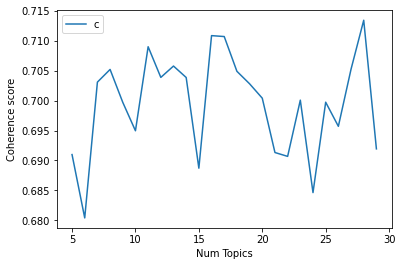

Num Topics = 5  has Coherence Value of 0.691
Num Topics = 6  has Coherence Value of 0.6804
Num Topics = 7  has Coherence Value of 0.7031
Num Topics = 8  has Coherence Value of 0.7052
Num Topics = 9  has Coherence Value of 0.6997
Num Topics = 10  has Coherence Value of 0.695
Num Topics = 11  has Coherence Value of 0.709
Num Topics = 12  has Coherence Value of 0.7039
Num Topics = 13  has Coherence Value of 0.7058
Num Topics = 14  has Coherence Value of 0.7039
Num Topics = 15  has Coherence Value of 0.6887
Num Topics = 16  has Coherence Value of 0.7109
Num Topics = 17  has Coherence Value of 0.7107
Num Topics = 18  has Coherence Value of 0.7049
Num Topics = 19  has Coherence Value of 0.7028
Num Topics = 20  has Coherence Value of 0.7004
Num Topics = 21  has Coherence Value of 0.6913
Num Topics = 22  has Coherence Value of 0.6907
Num Topics = 23  has Coherence Value of 0.7001
Num Topics = 24  has Coherence Value of 0.6846
Num Topics = 25  has Coherence Value of 0.6997
Num Topics = 26  has 

In [ ]:
import re
import spacy

from nltk.corpus import stopwords 
from nltk.stem.wordnet import WordNetLemmatizer
import string

# import numpy for matrix operation
import numpy as np

# Importing Gensim
import gensim
from gensim import corpora
# to suppress warnings
from warnings import filterwarnings
filterwarnings('ignore')

## from google.colab import drive
## drive.mount('/content/drive/')

##!unzip -uq "/content/Names_207039.zip" -d "/content/"
## !unzip -uq "/content/test_names_220610" -d "/content/"
!unzip -uq "/content/mallet-2.0.8.zip" -d "/content/"  
!unzip -uq "/content/review_words.zip" -d "/content/"      

##dirpath = '/content/Names_207039/'
## dirpath = '/content/test_names/
dirpath = '/content/review_words/'
mallet_path = '/content/mallet-2.0.8/bin/mallet'

import os
## Setup mallet environment change it according to your drive
os.environ.update({'MALLET_HOME':r'/content/mallet-2.0.8'})
## Setup mallet path change it according to your drive

files = [os.path.join(dirpath, fname) for fname in os.listdir(dirpath)]
corpus_text = []

for filename in sorted(files):
    with open(filename, 'r') as f:
        corpus_text += [f.read()]




from pathlib import Path

doc_names = [Path(file).stem for file in sorted(files)]

# Apply Preprocessing on the Corpus

import nltk

def flattern(doc):

    # split into words
    split_into_words = " ".join([i for i in doc.split() if not i.isdigit()])
    ## split_into_words = " ".join([i for i in doc.split()])
    
    return split_into_words

# Saving data in a new list
texts = [flattern(doc).split() for doc in corpus_text] 

# Create Dictionary
id2word = corpora.Dictionary(texts)
## id2word.filter_extremes(no_below=15, no_above=0.4, keep_n=80000)

# Term Document Frequency
# https://radimrehurek.com/gensim/auto_examples/core/run_corpora_and_vector_spaces.html

corpus = [id2word.doc2bow(text) for text in texts]



from pprint import pprint
import pandas as pd

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim_models  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
from gensim.models.wrappers import LdaMallet

def compute_coherence_values(dictionary, corpus, texts, limit, start=5, step=5):

    coherence_values = []
    model_list = []

    for num_topics in range(start, limit, step):

        ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, 
                                                 corpus=corpus, 
                                                 num_topics=num_topics, 
                                                 ## alpha=1/num_topics,
                                                 alpha=50/num_topics,
                                                 id2word=id2word, 
                                                 ##workers=40,
                                                 ##optimize_interval=4,
                                                 iterations=5) 
                                                 ##iterations=1500)   
        
        model = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(ldamallet)
        model_list.append(model)   

        
         
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        ## coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='u_mass')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=texts, start=5, limit=30, step=1)



import csv  

with open('/content/lda_cv.csv', 'w', encoding='UTF8') as f:
    writer = csv.writer(f)

    header = ['K', 'CV']
    writer.writerow(header)

    limit=30; start=5; step=1;

    x = range(start, limit, step)
    # Show graph

    plt.plot(x, coherence_values)
    plt.xlabel("Num Topics")
    plt.ylabel("Coherence score")
    plt.legend(("coherence_values"), loc='best')
    plt.show()


    for m, cv in zip(x, coherence_values):
        print("Num Topics =", m, " has Coherence Value of", round(cv, 4))
        data = [m, round(cv, 4)]
        writer.writerow(data)


In [ ]:
print(coherence_values[1])

0.708819542517784


In [ ]:
# install chromium, its driver, and selenium
!apt-get update
!apt install chromium-chromedriver
!cp /usr/lib/chromium-browser/chromedriver /usr/bin
!pip install selenium

## print(driver.page_source)  # results

## driver.get("https://www.tripadvisor.com/Restaurant_Review-g190328-d8867662-Reviews-Storie_Sapori_La_Valletta-Valletta_Island_of_Malta.html")
## print(driver.page_source)  # results

import csv
import time
from selenium import webdriver
from selenium.webdriver.common.by import By

##URL = "https://www.tripadvisor.com/Restaurant_Review-g190328-d8867662-Reviews-Storie_Sapori_La_Valletta-Valletta_Island_of_Malta.html"

##driver = webdriver.Chrome("./chromedriver")
##driver.get(URL)

# Prepare CSV file
csvFile = open("reviews_yellow_mountain_acient_street.csv", "w", newline='', encoding="utf-8")
## csvFile = open("reviews_yellow_mountain_Xihai.csv", "w", newline='', encoding="utf-8")
## csvFile = open("reviews_yellow_mountain_Xihai.csv", "w", newline='', encoding="utf-8")
csvWriter = csv.writer(csvFile)
csvWriter.writerow(['Date','Title','Review'])
## csvWriter.writerow(['Contribution','Title','Review'])
## csvWriter.writerow(['Date','Contribution','Title','Review'])

## num_page = 99
num_page = 99

## driver.implicitly_wait(10)

from selenium import webdriver
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from selenium.webdriver.common.by import By
from selenium.common.exceptions import ElementClickInterceptedException
from selenium.webdriver.chrome.options import Options
from time import sleep

## options = Options()
## options.add_argument("--disable-notifications")

## !pip install selenium==4.2.0 --force-reinstall
# set options to be headless, ..
from selenium import webdriver
options = webdriver.ChromeOptions()
options.add_argument('--headless')
options.add_argument('--no-sandbox')
options.add_argument('--disable-dev-shm-usage')
options.add_argument("--disable-notifications")
# open it, go to a website, and get results
driver = webdriver.Chrome('chromedriver',options=options)

## driver.manage().timeouts().implicitlyWait(40, TimeUnit.SECONDS);

from selenium import webdriver
from selenium.common.exceptions import TimeoutException


try:
    driver.set_page_load_timeout(1000)
    driver.get("https://www.tripadvisor.com/Attraction_Review-g303685-d550738-Reviews-Mt_Huangshan-Huangshan_Anhui.html")
    ## driver.get("https://www.tripadvisor.com/Attraction_Review-g303685-d1826843-Reviews-Huangshan_UNESCO_Global_Geopark-Huangshan_Anhui.html")
    ## driver.get("https://www.tripadvisor.com/Attraction_Review-g303685-d1969398-Reviews-Xihai_Great_Canyon-Huangshan_Anhui.html#REVIEWS")
## driver.get("https://www.tripadvisor.com/Attraction_Review-g303685-d502831-Reviews-Tunxi_Ancient_Street-Huangshan_Anhui.html#REVIEWS")
    ## driver.get("https://www.tripadvisor.com/Attraction_Review-g303685-d551319-Reviews-Celestial_Capital_Peak_Tian_Du_Feng-Huangshan_Anhui.html")
    ## driver.get("https://www.tripadvisor.com/Attraction_Review-g303685-d2003195-Reviews-Shixin_Peak-Huangshan_Anhui.html")
    ## driver.get("https://www.tripadvisor.com/Attraction_Review-g303685-d551309-Reviews-Greeting_Pine_Ying_Ke_Song-Huangshan_Anhui.html")
except TimeoutException as ex:
    isrunning = 0
    print("Exception has been thrown. " + str(ex))
    driver.close()


## driver.get("https://www.tripadvisor.com/Attraction_Review-g303685-d550738-Reviews-Mt_Huangshan-Huangshan_Anhui.html")
## driver.get("https://www.tripadvisor.com/Attraction_Review-g303685-d1826843-Reviews-Huangshan_UNESCO_Global_Geopark-Huangshan_Anhui.html")
## driver.get("https://www.tripadvisor.com/Attraction_Review-g303685-d1969398-Reviews-Xihai_Great_Canyon-Huangshan_Anhui.html#REVIEWS")
## driver.get("https://www.tripadvisor.com/Attraction_Review-g303685-d502831-Reviews-Tunxi_Ancient_Street-Huangshan_Anhui.html#REVIEWS")
## driver.get("https://www.tripadvisor.com/Attraction_Review-g303685-d551319-Reviews-Celestial_Capital_Peak_Tian_Du_Feng-Huangshan_Anhui.html")
## driver.get("https://www.tripadvisor.com/Attraction_Review-g303685-d2003195-Reviews-Shixin_Peak-Huangshan_Anhui.html")
## driver.get("https://www.tripadvisor.com/Attraction_Review-g303685-d551309-Reviews-Greeting_Pine_Ying_Ke_Song-Huangshan_Anhui.html")
## driver.get("https://www.tripadvisor.com/Hotel_Review-g60763-d1218720-Reviews-The_Standard_High_Line-New_York_City_New_York.html")

wait = WebDriverWait(driver, 20)
showmore_link_ = wait.until(EC.element_to_be_clickable((By.XPATH, "//*[contains(@data-smoke-attr, 'pagination-next-arrow')]")))


def save_body_to_file(destination_path, filename, body):

    with open(destination_path  + filename, 'w') as file:
        file.write(body)
    file.close()

## driver.find_element(By.XPATH, "//*[contains(@data-smoke-attr, 'pagination-next-arrow')]").click()

## anchor = WebDriverWait(driver,100).until(EC.element_to_be_clickable( (By.XPATH, "//*[contains(@data-smoke-attr, 'pagination-next-arrow')]")))

## anchor.click()

##driver.manage().window().maximize();

###anchor = driver.find_element(By.XPATH, "//*[contains(@data-smoke-attr, 'pagination-next-arrow')]")
# change the value inside the range to save more or less reviews
for i in range(0, num_page):

    # expand the review 
    time.sleep(2)
    ## driver.find_elements(By.XPATH, ".//div[contains(@data-test-target, 'expand-review')]")
    ## driver.find_elements(By.XPATH, ".//span[@class='biGQs _P XWJSj Wb']")

    driver.find_elements(By.XPATH, "//span[@class='lszDU']")

    container = driver.find_elements(By.XPATH, "//div[@data-automation='reviewCard']")
    ## dates = driver.find_elements(By.XPATH, ".//div[@class='EftBQ']")
    ## dates = driver.find_elements(By.XPATH, ".//span[@class='teHYY _R Me S4 H3']")
    dates = driver.find_elements(By.XPATH, ".//div[@class='biGQs _P pZUbB ncFvv osNWb']")

    for j in range(len(container)):

        ##rating = container[j].find_element(By.XPATH, ".//span[contains(@class, 'ui_bubble_rating bubble_')]").get_attribute("class").split("_")[3]
        ## contribution = container[j].find_elements(By.XPATH, ".//span[@class='IugUm']")
        title = container[j].find_element(By.XPATH, ".//div[@class='biGQs _P fiohW qWPrE ncFvv fOtGX']//span[@class='yCeTE']").text
        review = container[j].find_element(By.XPATH, ".//div[1]/div/span[@class='yCeTE']").text.replace("\n", "")
        date = " ".join(dates[j].text.split(" ")[-2:])

         ##a1 = 'samp"le s"tring'
        title = title.replace('"','')

        exclude = '//'
        title = ''.join(ch for ch in title if ch not in exclude)
        ## title.replace(r'/', ' ')

        csvWriter.writerow([date, title, review]) 



        ##if title == "":
          ##title = "empty"
        ##else :
        filename = title + '_' + date + '_'  + ".txt"

        save_body_to_file(dirpath_, filename, review)
        
    ## driver.manage().window().maximize();
    # change the page    
    ## driver.find_element_by_xpath('.//a[@class="ui_button nav next primary "]').click()       
    ## driver.find_element(By.XPATH, '//*a[@href="/Attraction_Review-g303685-d550738-Reviews-or10-Mt_Huangshan-Huangshan_Anhui.html"]').click() 
    ## driver.find_element(By.XPATH, "//*[contains(@data-smoke-attr, 'pagination-next-arrow')]").click()
    
 
'''   wait = WebDriverWait(driver, 100)

    try:
        showmore_link = wait.until(EC.element_to_be_clickable((By.XPATH, "//*[contains(@data-smoke-attr, 'pagination-next-arrow')]")))
        showmore_link.click()

    except ElementClickInterceptedException:
        print("Trying to click on the button again")
        driver.execute_script("arguments[0].click()", showmore_link)
 '''       
    ## anchor_ = driver.find_element(By.XPATH, "//*[contains(@data-smoke-attr, 'pagination-next-arrow')]")

    ##JavaScriptExecutor.ExecuteScript("window.scrollTo(0, 0);");
    ## driver.execute_script("window.scrollTo(0, 0);")
    ## driver.manage().window().maximize();
    ## anchor_.click() 
    ##response.xpath('//a[@class="prevNext" and contains(text(),"Next")]/@href')
    ##restrict_xpaths='(//a[@class="prevNext" and contains(text(),"Next")])[1]'




driver.quit()



In [ ]:
!zip -r reviews_words.zip reviews_words/

In [ ]:
# Select the model and print the topics
optimal_model = model_list[14]


# Finding the dominant topic in each document 

def format_topics_sentences(ldamodel=optimal_model, corpus=corpus, texts=texts):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        
        # Get the Dominant topic, Percentage Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic, 4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    names = pd.Series(doc_names)

    sent_topics_df = pd.concat([sent_topics_df, contents, names], axis=1)
    ## sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=optimal_model, corpus=corpus, texts=texts)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
## df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Contrib', 'Keywords']
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Contrib', 'Keywords', 'Text', 'Name']

# Display
df_dominant_topic.head(20)

,Document_No,Dominant_Topic,Topic_Contrib,Keywords,Text,Name
0,0,10.0,0.3432,"tiandu, idea, disliked, uninterrupted, shorten...","[want, pay, cable, opt, hike, mountain, rememb...",2 Days in a painting
1,1,2.0,0.3267,"backtracking, awestruck, mistake, kill, stunne...","[jane, jane, jane, couching, tiger, hidden, dr...",2 night trip to Mt. Huangshan great thanks to ...
2,2,6.0,0.3295,"campsite, pitch, shortened, wont, camellia, is...","[easy, place, visit, without, knowing, chinese...",24 hours at Mt. Huangshan
3,3,17.0,0.3721,"regardless, safety, froze, lengthy, recycling,...","[family, spent, day, huangshan, area, wonderfu...",3 days in Huangshan
4,4,2.0,0.3614,"backtracking, awestruck, mistake, kill, stunne...","[booked, private, tour, china, highlight, webs...",3-day Essence of Huangshan tour
5,5,1.0,0.2847,"red, bunk, trek, waaaaaa, throwing, stamen, pl...","[like, crowd, go, week, day, avoid, golden, we...",8 miles of Wonder!
6,6,18.0,0.2859,"confines, extravagant, zhaixi, solitude, cheap...","[cool, one, thousand, beautiful, tree, mountai...",A 'must-see' for Chinese....foreigners maybe.....
7,7,10.0,0.5624,"tiandu, idea, disliked, uninterrupted, shorten...","[t, trip, huangshan, travelled, beijing, huang...",A 5star in sunny weather
8,8,4.0,0.2675,"orderly, provision, frontage, biscuit, fading,...","[never, seen, elsewhere, misty, clear, still, ...",A 6 star experience - Pack strong legs and bra...
9,9,13.0,0.4571,"flea, yet, leisurelythan, overweight, furong, ...","[old, stree, hotel, fun, place, spend, couple,...",A Bustling Area of Shops and Restaurants


In [ ]:
df_dominant_topic.head(20)

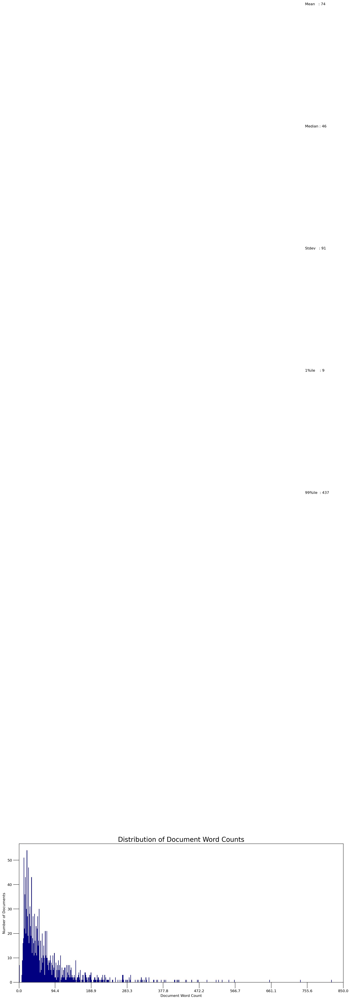

In [ ]:
doc_lens = [len(d) for d in df_dominant_topic.Text]

# Plot
plt.figure(figsize=(16,7), dpi=160)
plt.hist(doc_lens, bins = 1000, color='navy')
plt.text(750, 400, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(750, 350, "Median : " + str(round(np.median(doc_lens))))
plt.text(750, 300, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(750, 250, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(750, 200, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))

plt.gca().set(xlim=(0, 850), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,850,10))
plt.title('Distribution of Document Word Counts', fontdict=dict(size=18))
plt.show()


In [ ]:
import re
import spacy

from nltk.corpus import stopwords 
from nltk.stem.wordnet import WordNetLemmatizer
import string

# import numpy for matrix operation
import numpy as np

# Importing Gensim
import gensim
from gensim import corpora
# to suppress warnings
from warnings import filterwarnings
filterwarnings('ignore')

## from google.colab import drive
## drive.mount('/content/drive/')

##!unzip -uq "/content/Names_207039.zip" -d "/content/"
## !unzip -uq "/content/test_names_220610" -d "/content/"
!unzip -uq "/content/mallet-2.0.8.zip" -d "/content/"  
!unzip -uq "/content/reviews_words.zip" -d "/content/"      

##dirpath = '/content/Names_207039/'
## dirpath = '/content/test_names/
dirpath = '/content/reviews_words/'
mallet_path = '/content/mallet-2.0.8/bin/mallet'

import os
## Setup mallet environment change it according to your drive
os.environ.update({'MALLET_HOME':r'/content/mallet-2.0.8'})
## Setup mallet path change it according to your drive

files = [os.path.join(dirpath, fname) for fname in os.listdir(dirpath)]
corpus_text = []

for filename in sorted(files):
    with open(filename, 'r') as f:
        corpus_text += [f.read()]




from pathlib import Path

doc_names = [Path(file).stem for file in sorted(files)]

# Apply Preprocessing on the Corpus

import nltk

def flattern(doc):

    # split into words
    split_into_words = " ".join([i for i in doc.split() if not i.isdigit()])
    ## split_into_words = " ".join([i for i in doc.split()])
    
    return split_into_words

# Saving data in a new list
texts = [flattern(doc).split() for doc in corpus_text] 

# Create Dictionary
id2word = corpora.Dictionary(texts)
## id2word.filter_extremes(no_below=15, no_above=0.4, keep_n=80000)

# Term Document Frequency
# https://radimrehurek.com/gensim/auto_examples/core/run_corpora_and_vector_spaces.html

corpus = [id2word.doc2bow(text) for text in texts]



# Build LDA model
## lda_model = gensim.models.LdaMulticore(corpus=corpus, id2word=id2word, num_topics=20)
## lda_multicore_model = gensim.models.ldamulticore.LdaMulticore(corpus, num_topics = NUM_TOPICS, id2word=dictionary,random_state=100,passes=10)

## lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
lda_model = gensim.models.ldamulticore.LdaMulticore(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           ## update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha=1/20,
                                           eta=1/20,
                                           per_word_topics=True)
                                           



from pprint import pprint
import pandas as pd

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim_models  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

# Converting list of documents (corpus) into Document Term Matrix using the dictionary 
## doc_term_matrix = [id2word.doc2bow(i) for i in data_lemmatized]


def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=5):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        Lda = gensim.models.ldamodel.LdaModel
        model = Lda(corpus=corpus, num_topics=num_topics, id2word = id2word, passes=20, random_state=30, eval_every=None)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=texts, start=2, limit=20, step=5)


limit=20; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))


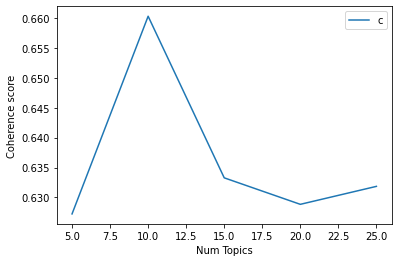

Num Topics = 5  has Coherence Value of 0.6272
Num Topics = 10  has Coherence Value of 0.6603
Num Topics = 15  has Coherence Value of 0.6333
Num Topics = 20  has Coherence Value of 0.6288
Num Topics = 25  has Coherence Value of 0.6319


In [ ]:

import csv  

with open('/content/lda_cv.csv', 'w', encoding='UTF8') as f:
    writer = csv.writer(f)

    header = ['K', 'CV']
    writer.writerow(header)

    limit=30; start=5; step=5;

    x = range(start, limit, step)
    # Show graph

    plt.plot(x, coherence_values)
    plt.xlabel("Num Topics")
    plt.ylabel("Coherence score")
    plt.legend(("coherence_values"), loc='best')
    plt.show()


    for m, cv in zip(x, coherence_values):
        print("Num Topics =", m, " has Coherence Value of", round(cv, 4))
        data = [m, round(cv, 4)]
        writer.writerow(data)


In [ ]:
# for text preprocessing
import re
import spacy

from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
import string

# import numpy for matrix operation
import numpy as np

# Importing Gensim
import gensim
# to suppress warnings
from warnings import filterwarnings
filterwarnings('ignore')

import pandas as pd
from pprint import pprint

import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel


#dirpath = '/content/drive/MyDrive/lda_silhouette/Names_no_duplicates/'
## dirpath = '/content/drive/MyDrive/Names_2000/'
#output = '/content/drive/MyDrive/lda_silhouette/name.csv'
!unzip -uq "/content/Names_207039.zip" -d "/content/"
## !unzip -uq "/content/test_names" -d "/content/"
## !unzip -uq "/content/mallet-2.0.8" -d "/content/"  

dirpath = '/content/Names_207039/'
output = '/content/name.csv'
import os

files = [os.path.join(dirpath, fname) for fname in os.listdir(dirpath)]
corpus = []

for filename in sorted(files):
    with open(filename, 'r') as f:
        corpus += [f.read()]
# corpus


# Apply Preprocessing on the Corpus

import nltk

nltk.download('omw-1.4')
nltk.download('wordnet')
nltk.download('stopwords')

# stop loss words
stop = set(stopwords.words('english'))

# punctuation
exclude = set(string.punctuation)

# lemmatization
lemma = WordNetLemmatizer()

# One function for all the steps:
def clean(doc):
   
    # convert text into lower case + split into words
    stop_free = " ".join([i for i in doc.lower().split() if i not in stop])
   
    # remove any stop words present
    punc_free = ''.join(ch for ch in stop_free if ch not in exclude)  
   
    # remove punctuations + normalize the text
    normalized = " ".join(lemma.lemmatize(word) for word in punc_free.split())  
    return normalized

# clean data stored in a new list
clean_corpus    = [clean(doc).split() for doc in corpus]
data_lemmatized = [clean(doc).split() for doc in corpus]

# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# Human readable format of corpus (term-frequency)
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:3]]



imUsingColab = True

if imUsingColab:
    !pip install gensim
    !pip install pyLDAvis
    !pip install vega
    !pip install altair


# Plotting tools
import pyLDAvis
import pyLDAvis.gensim_models  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)



"""
# Build LDA model
## lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
lda_model = gensim.models.ldamulticore.LdaMulticore(corpus=corpus,                                            
                                           id2word=id2word,
                                           num_topics=20,
                                           random_state=100,
                                           ## update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           ## alpha='auto',
                                           alpha='symmetric',
                                           eta=0.0001,
                                           per_word_topics=True)

# Print the Keyword in the 10 topics
print(lda_model.print_topics())

# spacy for lemmatization
import spacy

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  
# a measure of how good the model is. lower the better.

# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word)
vis


"""


# Converting list of documents (corpus) into Document Term Matrix using the dictionary
doc_term_matrix = [id2word.doc2bow(i) for i in clean_corpus]
doc_term_matrix

def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        Lda = gensim.models.ldamodel.LdaModel
# Running and Training LDA model on the document term matrix.
## ldamallet = Lda(doc_term_matrix, num_topics=10, id2word = id2word, passes=20, alpha=0.01, eta=0.0001, random_state=30, eval_every=None)
        # model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word)
        ## model = Lda(doc_term_matrix, num_topics=10, id2word = id2word, passes=20, alpha=0.01, eta=0.0001, random_state=30, eval_every=None)
        model = gensim.models.ldamulticore.LdaMulticore(doc_term_matrix, 
                                                        num_topics=num_topics, 
                                                        id2word = id2word, 
                                                        passes=5, 
                                                        random_state=30, 
                                                        eval_every=None)
        ## model = Lda(doc_term_matrix, num_topics=num_topics, id2word = id2word, passes=20, alpha=0.01, eta=0.0001, random_state=30, eval_every=None)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_lemmatized, start=2, limit=40, step=6)

# Show graph
limit=40; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [ ]:
# for text preprocessing
import re
import spacy

from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
import string

# import numpy for matrix operation
import numpy as np

# Importing Gensim
import gensim
# to suppress warnings
from warnings import filterwarnings
filterwarnings('ignore')

import pandas as pd
from pprint import pprint

import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel


#dirpath = '/content/drive/MyDrive/lda_silhouette/Names_no_duplicates/'
## dirpath = '/content/drive/MyDrive/Names_2000/'
#output = '/content/drive/MyDrive/lda_silhouette/name.csv'
!unzip -uq "/content/Names_207039.zip" -d "/content/"
## !unzip -uq "/content/test_names" -d "/content/"
## !unzip -uq "/content/mallet-2.0.8" -d "/content/"  

dirpath = '/content/Names_207039/'
output = '/content/name.csv'
import os

files = [os.path.join(dirpath, fname) for fname in os.listdir(dirpath)]
corpus = []

for filename in sorted(files):
    with open(filename, 'r') as f:
        corpus += [f.read()]
# corpus


# Apply Preprocessing on the Corpus

import nltk

nltk.download('omw-1.4')
nltk.download('wordnet')
nltk.download('stopwords')

# stop loss words
stop = set(stopwords.words('english'))

# punctuation
exclude = set(string.punctuation)

# lemmatization
lemma = WordNetLemmatizer()

# One function for all the steps:
def clean(doc):
   
    # convert text into lower case + split into words
    stop_free = " ".join([i for i in doc.lower().split() if i not in stop])
   
    # remove any stop words present
    punc_free = ''.join(ch for ch in stop_free if ch not in exclude)  
   
    # remove punctuations + normalize the text
    normalized = " ".join(lemma.lemmatize(word) for word in punc_free.split())  
    return normalized

# clean data stored in a new list
clean_corpus    = [clean(doc).split() for doc in corpus]
data_lemmatized = [clean(doc).split() for doc in corpus]

# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# Human readable format of corpus (term-frequency)
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:3]]



imUsingColab = True

if imUsingColab:
    !pip install gensim
    !pip install pyLDAvis
    !pip install vega
    !pip install altair


# Plotting tools
import pyLDAvis
import pyLDAvis.gensim_models  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)



"""
# Build LDA model
## lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
lda_model = gensim.models.ldamulticore.LdaMulticore(corpus=corpus,                                            
                                           id2word=id2word,
                                           num_topics=20,
                                           random_state=100,
                                           ## update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           ## alpha='auto',
                                           alpha='symmetric',
                                           eta=0.0001,
                                           per_word_topics=True)

# Print the Keyword in the 10 topics
print(lda_model.print_topics())

# spacy for lemmatization
import spacy

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  
# a measure of how good the model is. lower the better.

# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word)
vis


"""


# Converting list of documents (corpus) into Document Term Matrix using the dictionary
doc_term_matrix = [id2word.doc2bow(i) for i in clean_corpus]
doc_term_matrix

def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        Lda = gensim.models.ldamodel.LdaModel
# Running and Training LDA model on the document term matrix.
## ldamallet = Lda(doc_term_matrix, num_topics=10, id2word = id2word, passes=20, alpha=0.01, eta=0.0001, random_state=30, eval_every=None)
        # model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word)
        ## model = Lda(doc_term_matrix, num_topics=10, id2word = id2word, passes=20, alpha=0.01, eta=0.0001, random_state=30, eval_every=None)
        model = gensim.models.ldamulticore.LdaMulticore(doc_term_matrix, 
                                                        num_topics=num_topics, 
                                                        id2word = id2word, 
                                                        passes=5, 
                                                        random_state=30, 
                                                        eval_every=None)
        ## model = Lda(doc_term_matrix, num_topics=num_topics, id2word = id2word, passes=20, alpha=0.01, eta=0.0001, random_state=30, eval_every=None)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_lemmatized, start=2, limit=40, step=6)

# Show graph
limit=40; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [ ]:
print(texts[:1])

[['This', 'worth', 'making', 'a', 'trip', 'to', 'you', 'are', 'China', 'you', 'can', 'get', 'most', 'of', 'the', 'top', 'of', 'the', 'mountain', 'done', 'one', 'day', 'Please', 'note', 'that', 'the', 'cable', 'cars', 'have', 'rotating', 'outages', 'maintenance', 'November', 'to', 'January', 'every', 'year', 'it', 'quite', 'a', 'bit', 'of', 'a', 'hike', 'up', 'down', 'We', 'went', 'late', 'December', 'went', 'up', 'the', 'Yungu', 'cable', 'car', 'hiked', 'to', 'Yuping', 'The', 'trail', 'about', 'km', 'of', 'walking', 'took', 'us', 'about', 'hours', 'then', 'another', 'hours', 'to', 'hike', 'down', 'near', 'Yuping', 'The', 'cable', 'cars', 'take', 'about', 'minutes', 'to', 'go', 'up', 'down', 'cost', 'RMB', 'one', 'way', 'The', 'ticket', 'price', 'was', 'RMB', 'to', 'enter', 'the', 'park', 'We', 'would', 'recommend', 'staying', 'Tankou', 'Town', 'a', 'trip', 'to', 'the', 'mountain', 'buying', 'your', 'own', 'snacks', 'town', 'regular', 'items', 'are', 'two', 'to', 'three', 'times', 'the'

In [ ]:
# copy

from pprint import pprint
import pandas as pd

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
from gensim.models.wrappers import LdaMallet

def compute_coherence_values(dictionary, corpus, texts, limit, start=5, step=5):

    coherence_values = []
    model_list = []

    for num_topics in range(start, limit, step):

        ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, 
                                                 corpus=corpus, 
                                                 num_topics=num_topics, 
                                                 ## alpha=1/num_topics,
                                                 alpha=50/num_topics,
                                                 id2word=id2word, 
                                                 ##workers=40,
                                                 ##optimize_interval=4,
                                                 iterations=50) 
                                                 ##iterations=1500)   
        
        model = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(ldamallet)   
         
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        ## coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='u_mass')
        coherence_values.append(coherencemodel.get_coherence())

    return coherence_values

coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=texts, start=5, limit=55, step=5)



import csv  

with open('/content/lda_cv.csv', 'w', encoding='UTF8') as f:
    writer = csv.writer(f)

    header = ['K', 'CV']
    writer.writerow(header)

    limit=55; start=5; step=5;

    x = range(start, limit, step)

    for m, cv in zip(x, coherence_values):
        print("Num Topics =", m, " has Coherence Value of", round(cv, 4))
        data = [m, round(cv, 4)]
        writer.writerow(data)


In [ ]:
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.feature_extraction.text import CountVectorizer
import nltk
from nltk.corpus import stopwords
import matplotlib
import time
from google.colab import files
src = list(files.upload().values())[0]
open('utils.py','wb').write(src)

from utils import load_data
from utils import preprocess_pipeline


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Saving utils.py to utils (5).py


In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

results = []

for num_topics in range(2, 8, 1):
    ## lda_model = model.LsiModel(corpus, id2word=dictionary, num_topics=t)
    ## corpus_lsi = lda_model[corpus]

    Lda = gensim.models.ldamodel.LdaModel
    model = Lda(doc_term_matrix, num_topics=num_topics, id2word = id2word, passes=20, random_state=30, eval_every=None)

    corpus_lda = model[corpus]


    X = np.array([[float(tup[1]) for tup in arr] for arr in corpus_lda])
    kmeans = KMeans(n_clusters=num_topics, random_state=37).fit(X)

    score = silhouette_score(X, kmeans.labels_)

    tup = num_topics, score
    results.append(tup)

results = pd.DataFrame(results, columns=['topic', 'score'])

In [ ]:
w = lda_model.get_topics()
w

In [ ]:
# Select the model and print the topics
optimal_model = model_list[2]


# Finding the dominant topic in each document 

def format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data_lemmatized):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        
        # Get the Dominant topic, Percentage Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    names = pd.Series(doc_names)

    sent_topics_df = pd.concat([sent_topics_df, contents, names], axis=1)
    ## sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=optimal_model, corpus=corpus, texts=data_lemmatized)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
## df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Contrib', 'Keywords', 'Text']
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Contrib', 'Keywords', 'Text', 'Name']

# Display
df_dominant_topic.head(207039)

,Document_No,Dominant_Topic,Topic_Contrib,Keywords,Text,Name
0,0,6.0,0.3309,"tensor, input, shape, torch, output, layer, gr...","[rmse, correct, pred, torch, tensor, repeat, t...",AIStream-Peelout_flow-fore__test_loss.py_4_tes...
1,1,6.0,0.5781,"tensor, input, shape, torch, output, layer, gr...","[diagon, add, scalar, torch, randn, plu, diag,...",AlexImmer_Lap__test_utils.py_2_test_diagonal_a...
2,2,1.0,0.7884,"event, respons, output, type, content, histori...","[creat, token, first, first, tri, creat, datas...",AlexsLemonade_refin__test_dataset.py_5_test_cr...
3,3,11.0,0.6043,"loss, task, train, sampl, job, param, target, ...","[dont, restart, download, job, still, run, job...",AlexsLemonade_refin__test_downloader_job_manag...
4,4,11.0,0.9665,"loss, task, train, sampl, job, param, target, ...","[first, set, mock, network, call, experi, comp...",AlexsLemonade_refin__test_organism_shepherd.py...
...,...,...,...,...,...,...
1994,1994,4.0,0.5536,"floor, float, copi, equal, predict, pytest, ed...","[matrix, matrix, array, noisi, random, rand, m...",wq2012_SpectralClu__configs_test.py_1_test_100...
1995,1995,6.0,0.5528,"tensor, input, shape, torch, output, layer, gr...","[max, cluster, max, cluster, array, result, ma...",wq2012_SpectralClu__utils_test.py_5_test_max_c...
1996,1996,6.0,0.6826,"tensor, input, shape, torch, output, layer, gr...","[trace, doe, contain, hard, code, constant, si...",xingyizhou_Center__test_imagelist.py_1_test_im...
1997,1997,6.0,0.8403,"tensor, input, shape, torch, output, layer, gr...","[output, box, convert, tensor, dtype, torch, f...",xingyizhou_Un__test_boxes.py_10_test_box_conve...


In [ ]:

# Finding the dominant topic in each document 

def format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data_lemmatized):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        
        # Get the Dominant topic, Percentage Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num, topn=20)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    names = pd.Series(doc_names)

    sent_topics_df = pd.concat([sent_topics_df, contents, names], axis=1)
    ## sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=optimal_model, corpus=corpus, texts=data_lemmatized)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
## df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Contrib', 'Keywords', 'Text']
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Contrib', 'Keywords', 'Text', 'Name']

# Display
df_dominant_topic.head(207039)

NameError: ignored

In [ ]:
lda_model.print_topics(num_words=15)

In [ ]:
[ [(id2word[wid], s) for (wid, s) in lda_model.get_topic_terms(tid, topn=15)] for tid in range(20)]

In [ ]:
x=lda_model.show_topics(num_topics=26, num_words=15,formatted=False)
topics_words = [(tp[0], [wd[0] for wd in tp[1]]) for tp in x]

#Below Code Prints Topics and Words
for topic,words in topics_words:
    print(str(topic)+ ", "+ str(words))
print()

#Below Code Prints Only Words 
## for topic,words in topics_words:
    ## print(" ".join(words))

In [ ]:
# Finding the most representative document (top20) for each topic

sent_topics_sorteddf = pd.DataFrame()

sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf = pd.concat([sent_topics_sorteddf, 
                                             grp.sort_values(['Perc_Contribution'], ascending=[0]).head(15)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Text", "Name"]

# Display
sent_topics_sorteddf.head(300)